###### Name:- Mansi
Email:- mansinagpal786@gmail.com

Evaluation Project - 3 HR Analytics Project- Understanding the Attrition in HR Problem Statement: Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

Note: You can find the dataset in the link below.

Downlaod Files: • https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics

In [1]:
import numpy as np
import pandas as pd
import scipy.stats
from scipy.stats import zscore,boxcox
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r"C:\Users\HP\Desktop\HR Analytics.csv")
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


##### EDA

In [3]:
print('Shape is-',df.shape)
print('Row"s are',df.shape[0])
print('Columns are',df.shape[1])

Shape is- (1470, 35)
Row"s are 1470
Columns are 35


###### As,we can see that there are 1470 rows and 35 columns are there including the Target Variable-Attrition .In this project I've to train the model so that I can simply predict down the Attrition in the industry and the prediction would be in the form of Yes or No.Yes mean there is attrition across the industry and No means that there is no attrition. Ergo, it indiactes that this is the problem of Classification as there are only two category present,Hence I'll be using Logistic Regression and all other classification models going forward.Also,there are 26 Numeric columns and 9 categorical columns present in this dataframe. The categorical columns are-Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime

In [4]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [5]:

df.index

RangeIndex(start=0, stop=1470, step=1)

In [6]:
df.ndim

2

In [7]:
df.size

51450

In [8]:
df.head

<bound method NDFrame.head of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education EducationFi

In [9]:
df.tail

<bound method NDFrame.tail of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education EducationFi

In [10]:
df.sample()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1065,55,No,Travel_Rarely,1229,Research & Development,4,4,Life Sciences,1,1501,...,2,80,0,4,2,3,3,2,1,2


In [11]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [12]:
df.info

<bound method DataFrame.info of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education Education

In [13]:
df.isnull

<bound method DataFrame.isnull of       Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education Educati

In [14]:
df.isnull().any().any()

False

In [15]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [16]:
df.isnull().sum().sum()

0

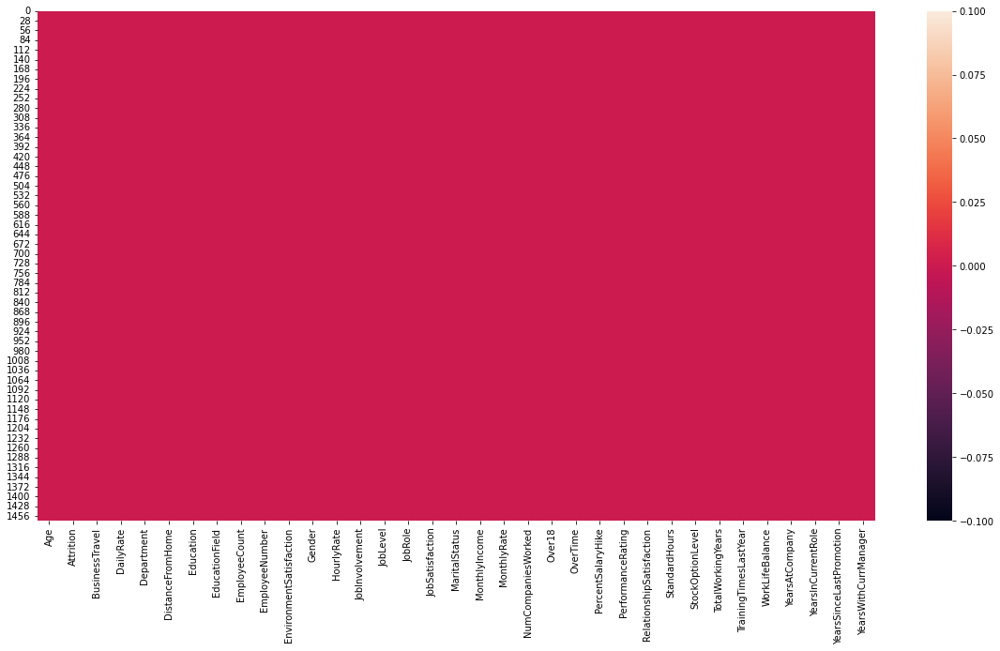

In [17]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isnull())
plt.xticks(rotation=90)
plt.show()

#### There are no null values are present in this dataset

In [18]:
l=['Age', 'Attrition', 'BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    print(f'Total Unique Value for attribute {i} is\n\n {df[i].unique()}')
    print('\n')

Total Unique Value for attribute Age is

 [41 49 37 33 27 32 59 30 38 36 35 29 31 34 28 22 53 24 21 42 44 46 39 43
 50 26 48 55 45 56 23 51 40 54 58 20 25 19 57 52 47 18 60]


Total Unique Value for attribute Attrition is

 ['Yes' 'No']


Total Unique Value for attribute BusinessTravel is

 ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']


Total Unique Value for attribute Department is

 ['Sales' 'Research & Development' 'Human Resources']


Total Unique Value for attribute DistanceFromHome is

 [ 1  8  2  3 24 23 27 16 15 26 19 21  5 11  9  7  6 10  4 25 12 18 29 22
 14 20 28 17 13]


Total Unique Value for attribute Education is

 [2 1 4 3 5]


Total Unique Value for attribute EducationField is

 ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']


Total Unique Value for attribute EmployeeCount is

 [1]


Total Unique Value for attribute EnvironmentSatisfaction is

 [2 3 4 1]


Total Unique Value for attribute Gender is

 ['Female' 'Male']


Tota

##### See we can refer the above output to know the count for each attributes,but What i can observe from the above output is like most of the attributes are containg '0' as an unique value and there counts are really high and that might creates an error while going ahead for training and testing phase.Ergo,going forward i will try to replace all the zeros with the mean value of their respective columns.

##### Data Visualisation

Countplot

This is the Countplot diagram for--- Age
AxesSubplot(0.125,0.125;0.775x0.755)


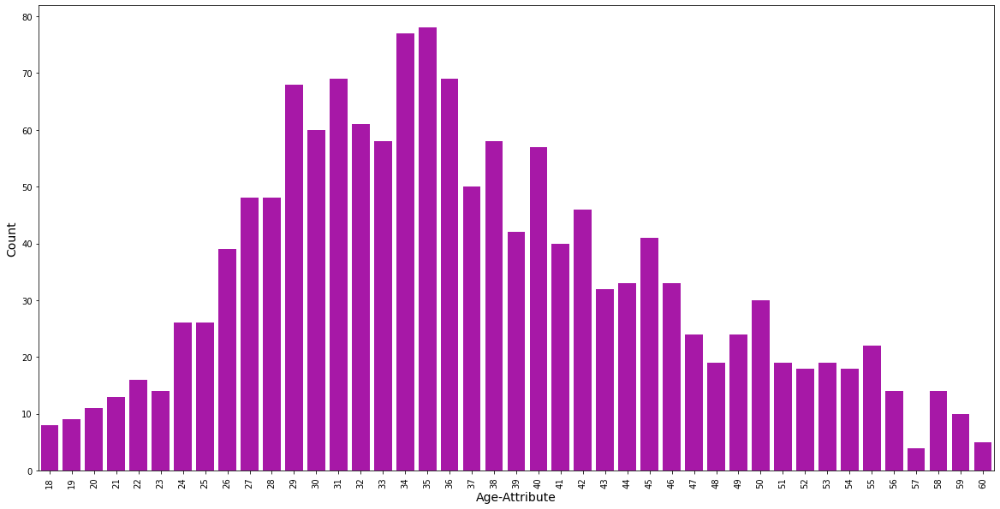



This is the Countplot diagram for--- Attrition
AxesSubplot(0.125,0.125;0.775x0.755)


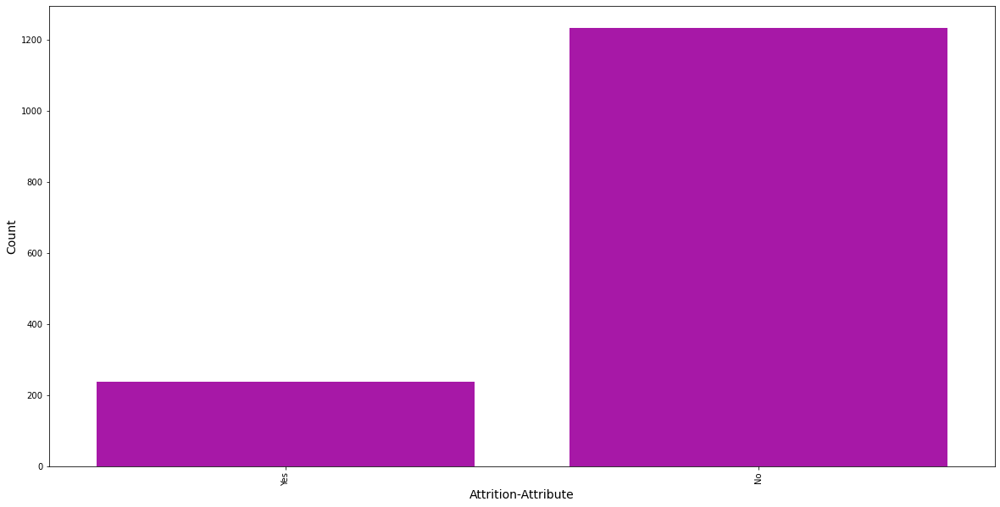



This is the Countplot diagram for--- BusinessTravel
AxesSubplot(0.125,0.125;0.775x0.755)


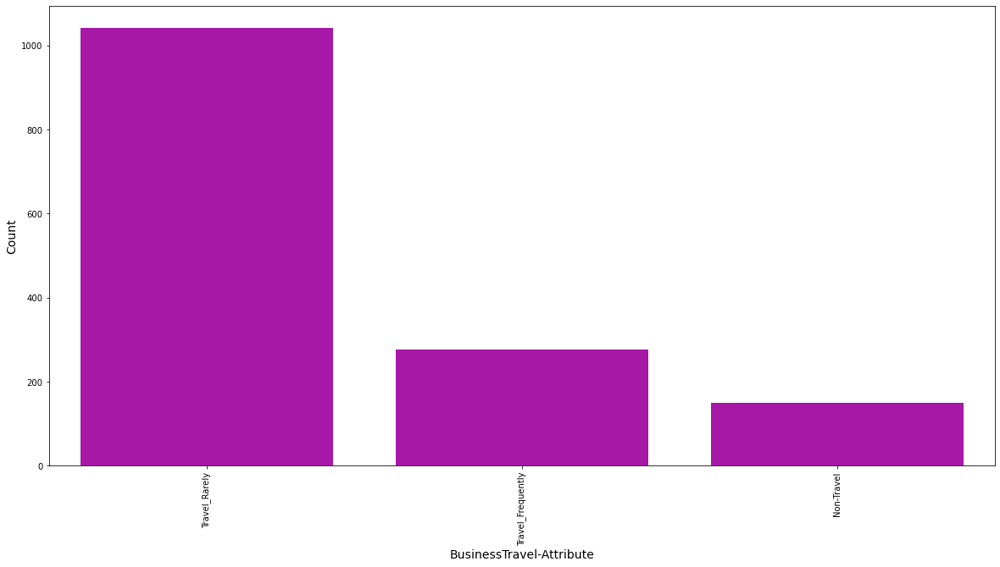



This is the Countplot diagram for--- Department
AxesSubplot(0.125,0.125;0.775x0.755)


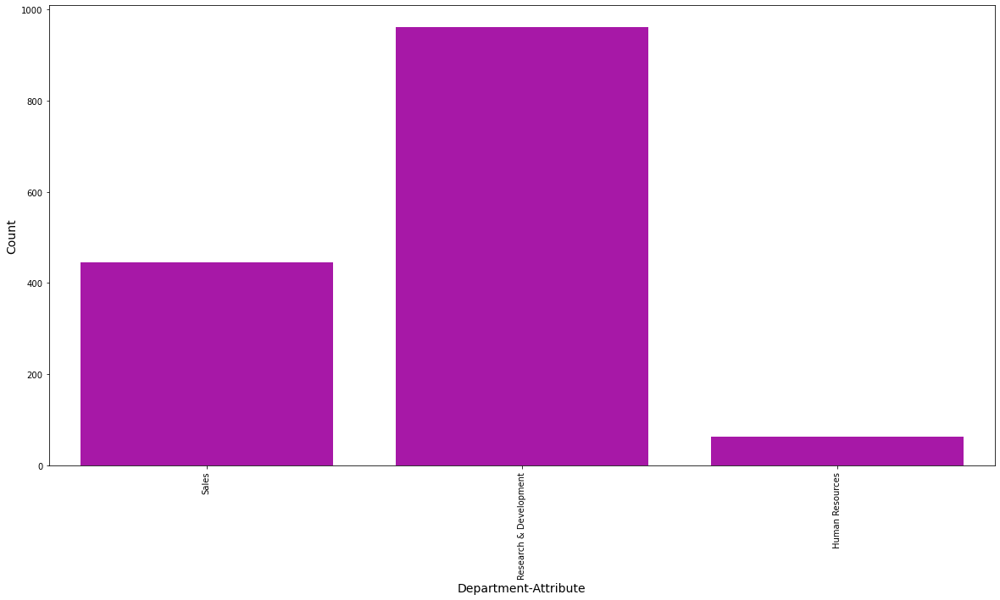



This is the Countplot diagram for--- DistanceFromHome
AxesSubplot(0.125,0.125;0.775x0.755)


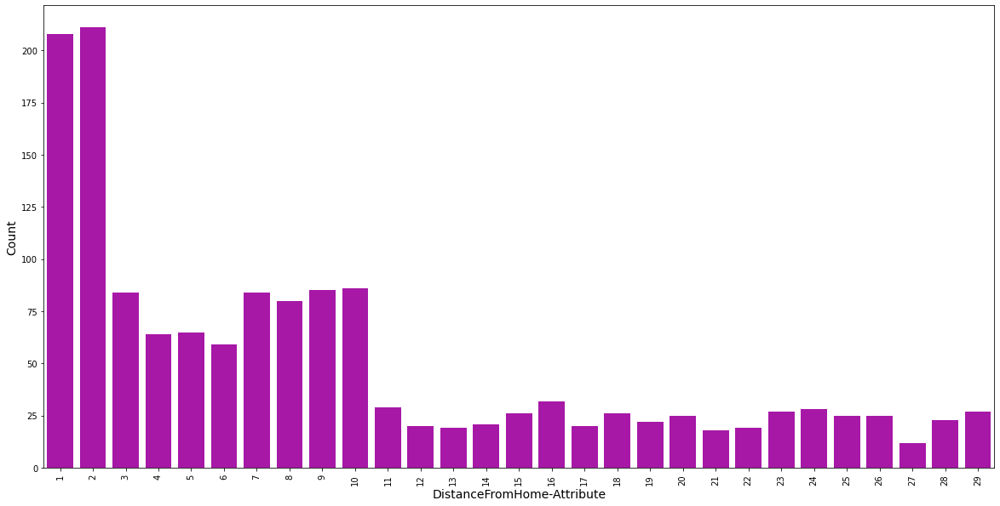



This is the Countplot diagram for--- Education
AxesSubplot(0.125,0.125;0.775x0.755)


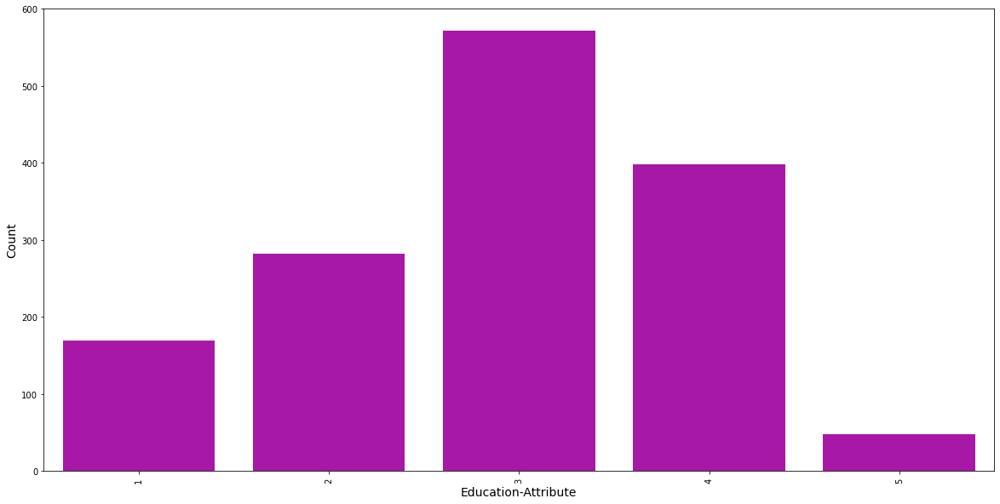



This is the Countplot diagram for--- EducationField
AxesSubplot(0.125,0.125;0.775x0.755)


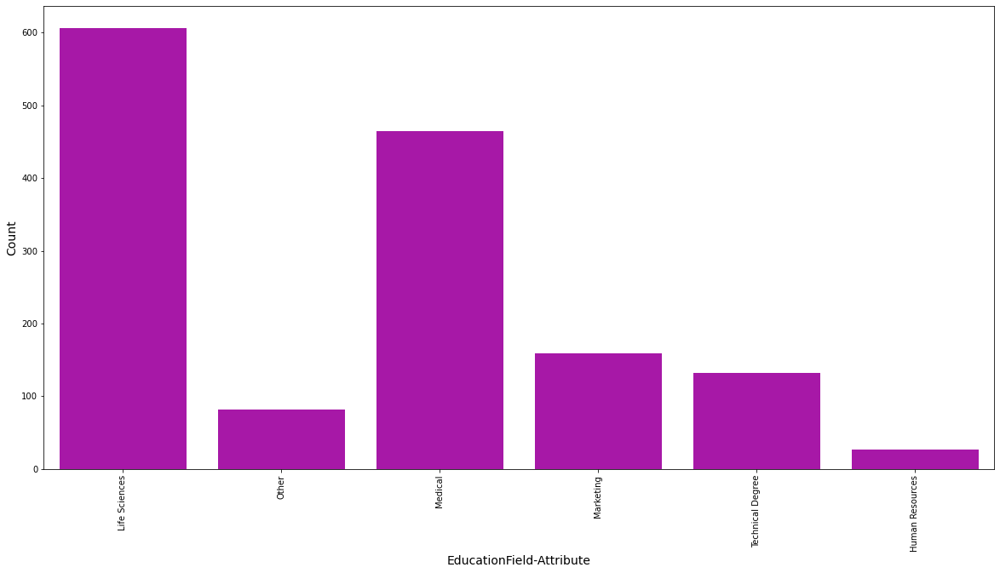



This is the Countplot diagram for--- EmployeeCount
AxesSubplot(0.125,0.125;0.775x0.755)


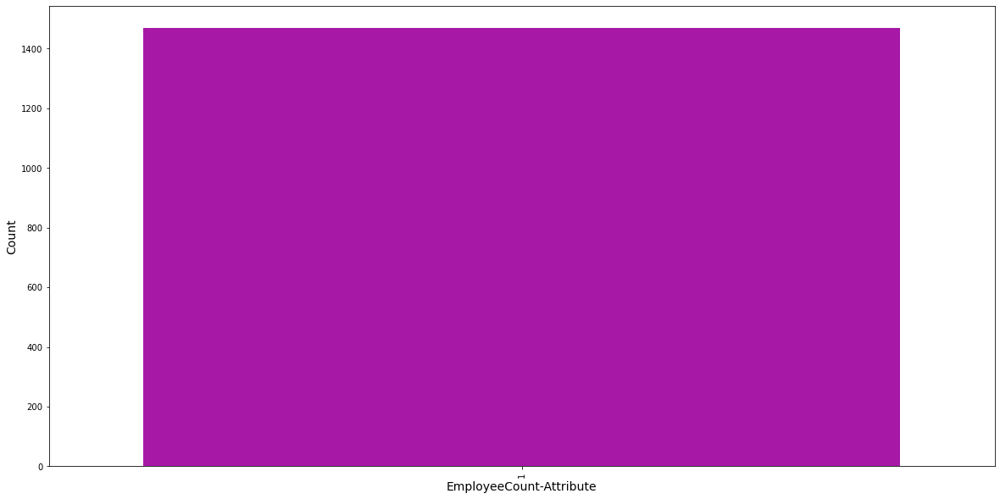



This is the Countplot diagram for--- EnvironmentSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


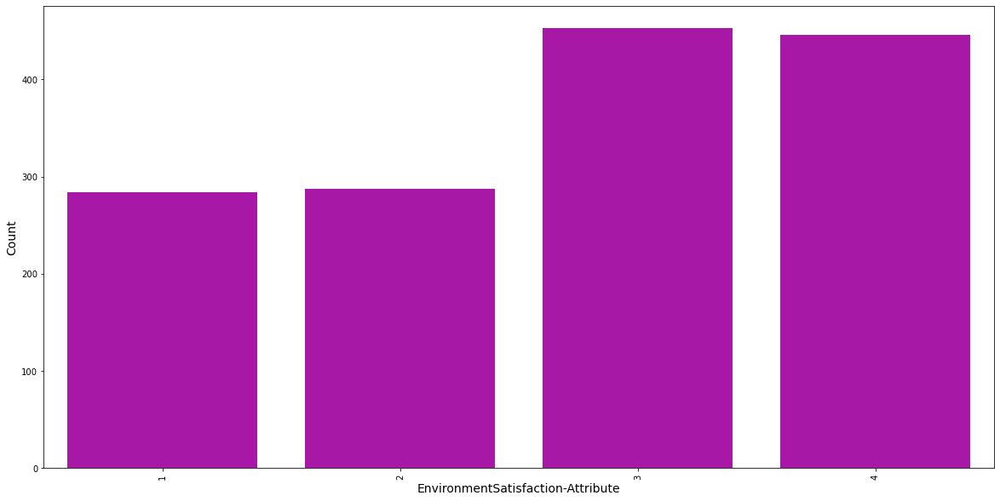



This is the Countplot diagram for--- Gender
AxesSubplot(0.125,0.125;0.775x0.755)


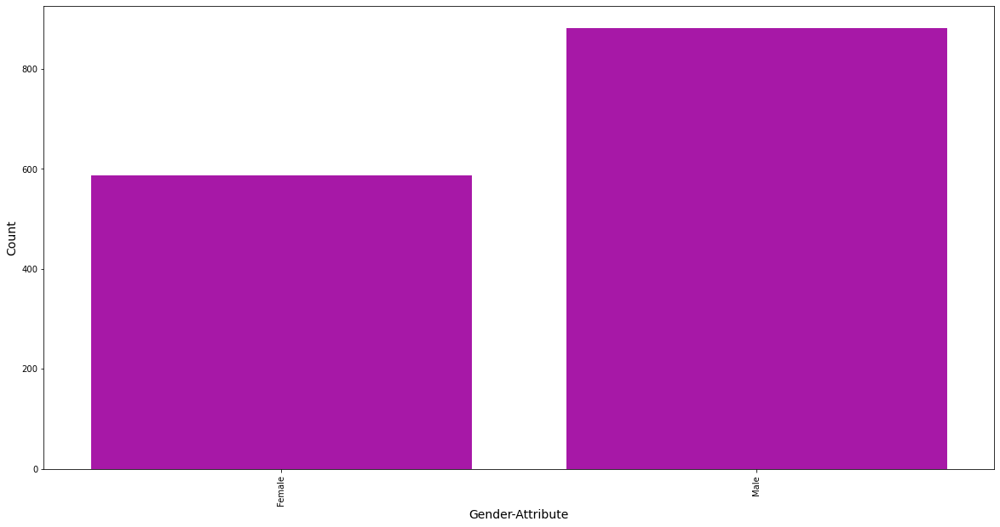



This is the Countplot diagram for--- HourlyRate
AxesSubplot(0.125,0.125;0.775x0.755)


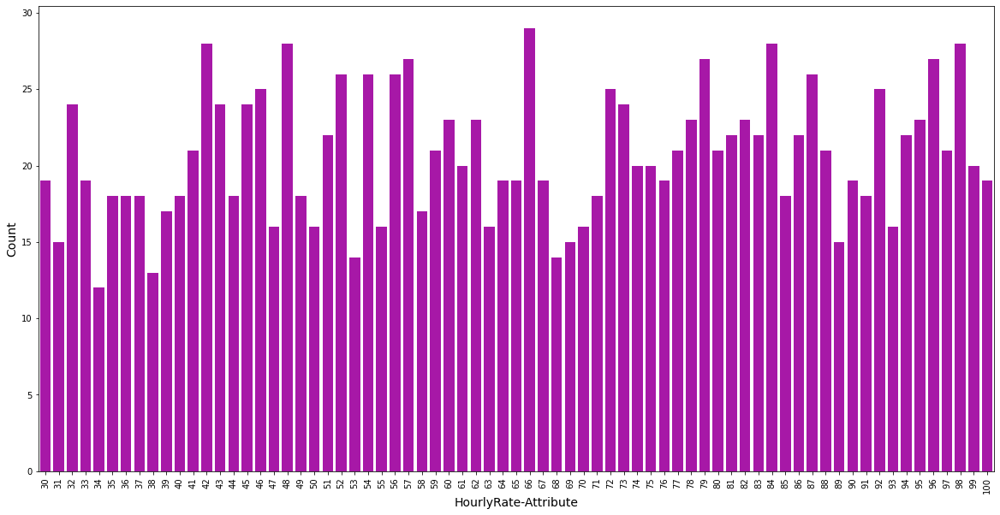



This is the Countplot diagram for--- JobInvolvement
AxesSubplot(0.125,0.125;0.775x0.755)


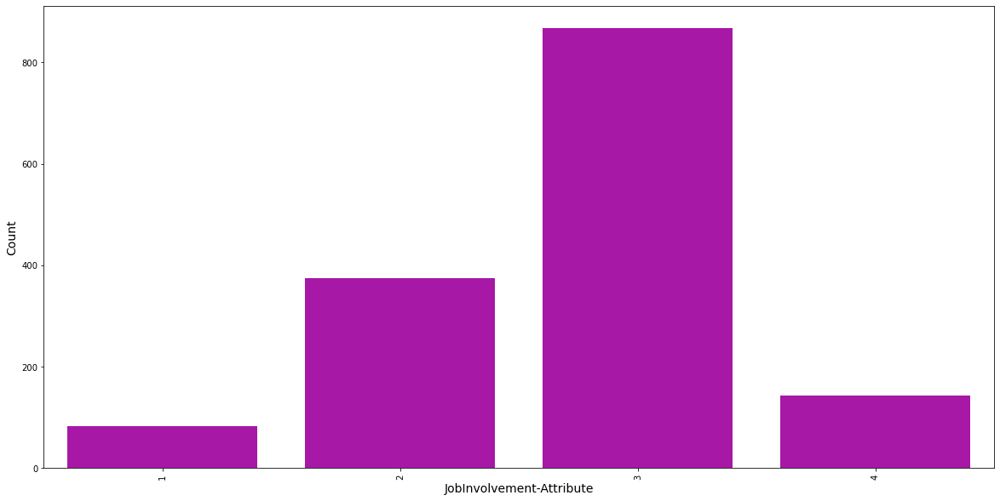



This is the Countplot diagram for--- JobLevel
AxesSubplot(0.125,0.125;0.775x0.755)


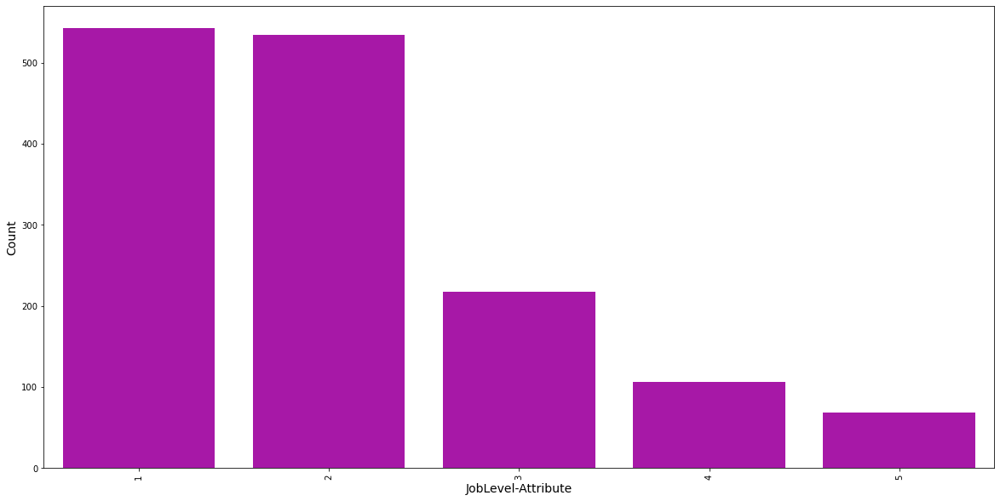



This is the Countplot diagram for--- JobRole
AxesSubplot(0.125,0.125;0.775x0.755)


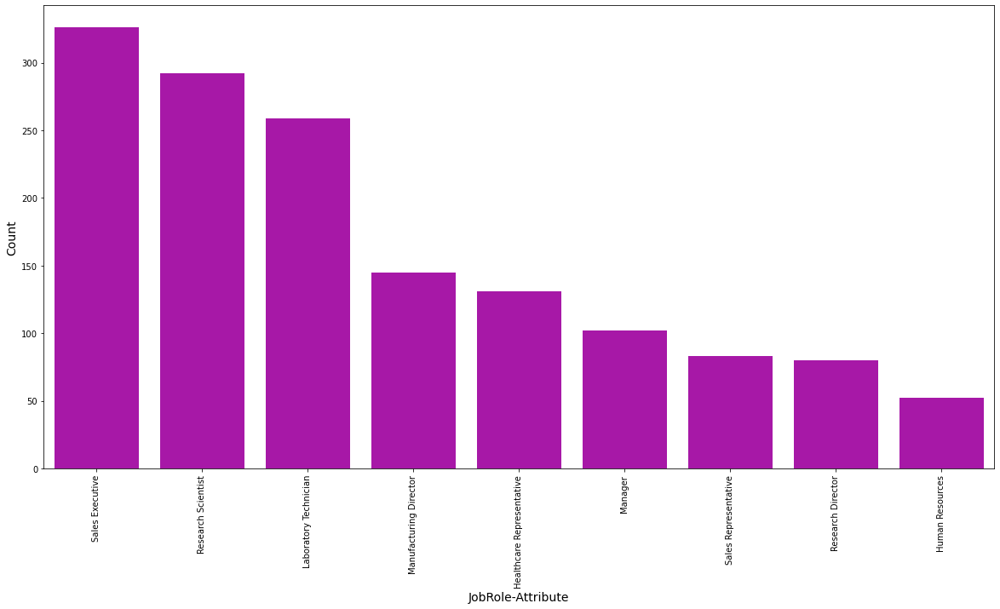



This is the Countplot diagram for--- JobSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


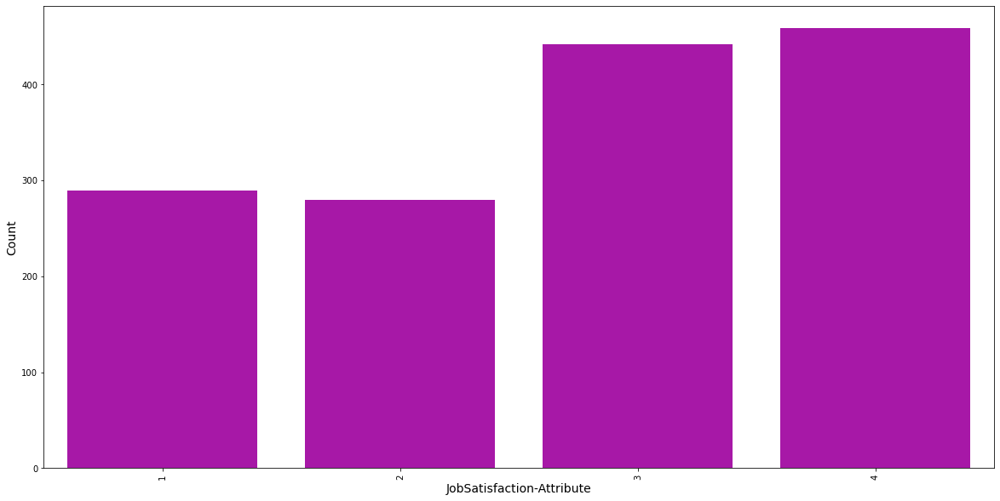



This is the Countplot diagram for--- MaritalStatus
AxesSubplot(0.125,0.125;0.775x0.755)


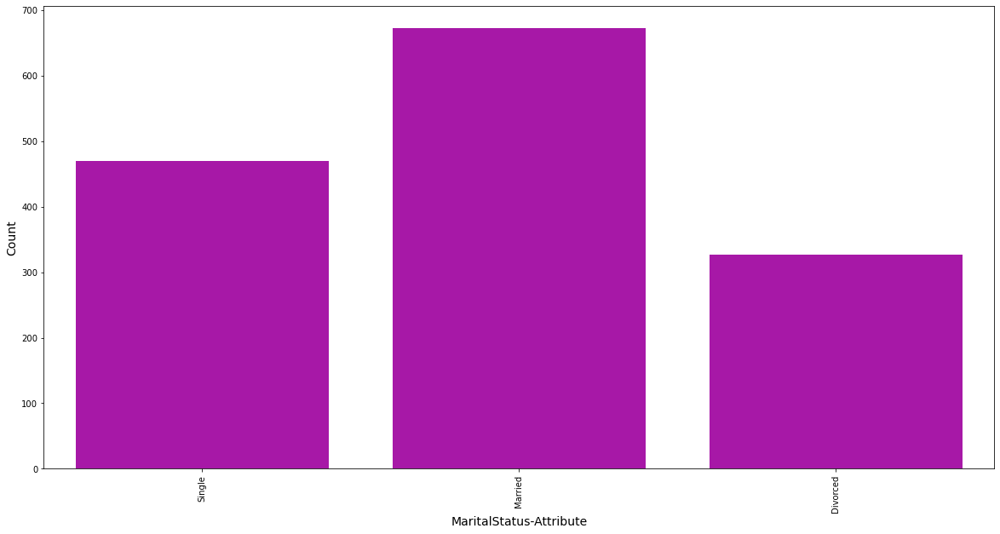



This is the Countplot diagram for--- NumCompaniesWorked
AxesSubplot(0.125,0.125;0.775x0.755)


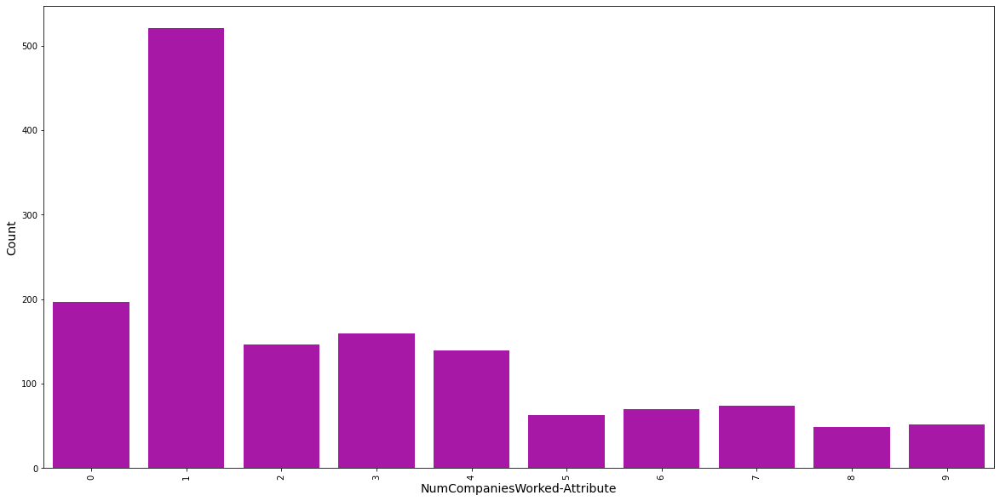



This is the Countplot diagram for--- Over18
AxesSubplot(0.125,0.125;0.775x0.755)


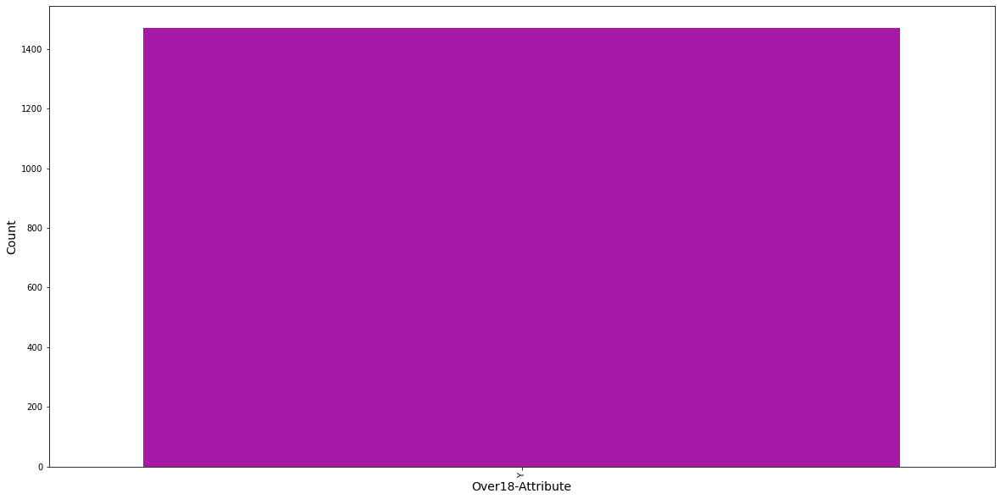



This is the Countplot diagram for--- OverTime
AxesSubplot(0.125,0.125;0.775x0.755)


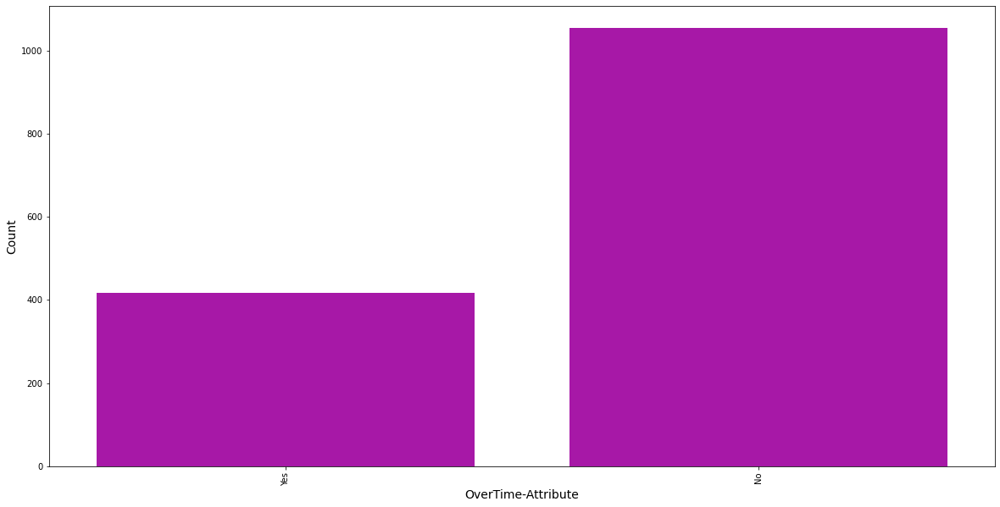



This is the Countplot diagram for--- PercentSalaryHike
AxesSubplot(0.125,0.125;0.775x0.755)


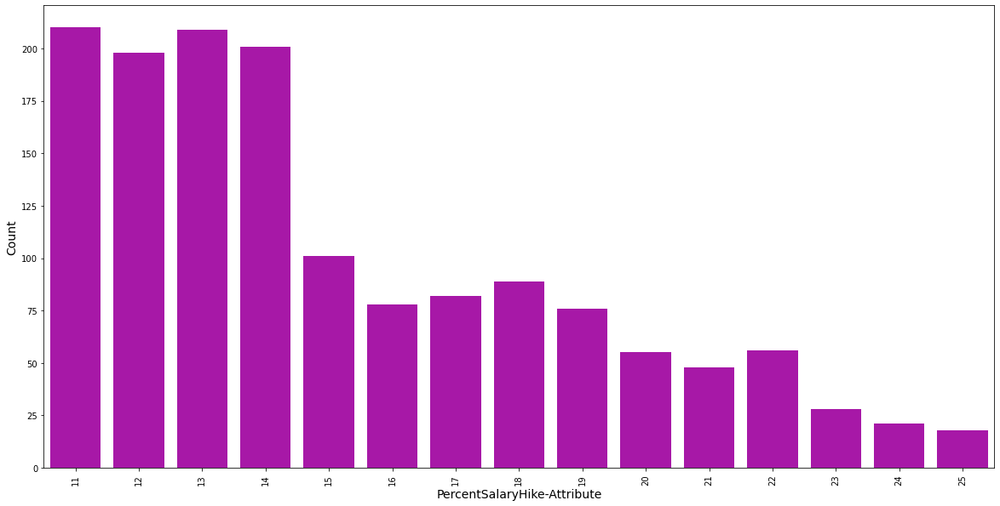



This is the Countplot diagram for--- PerformanceRating
AxesSubplot(0.125,0.125;0.775x0.755)


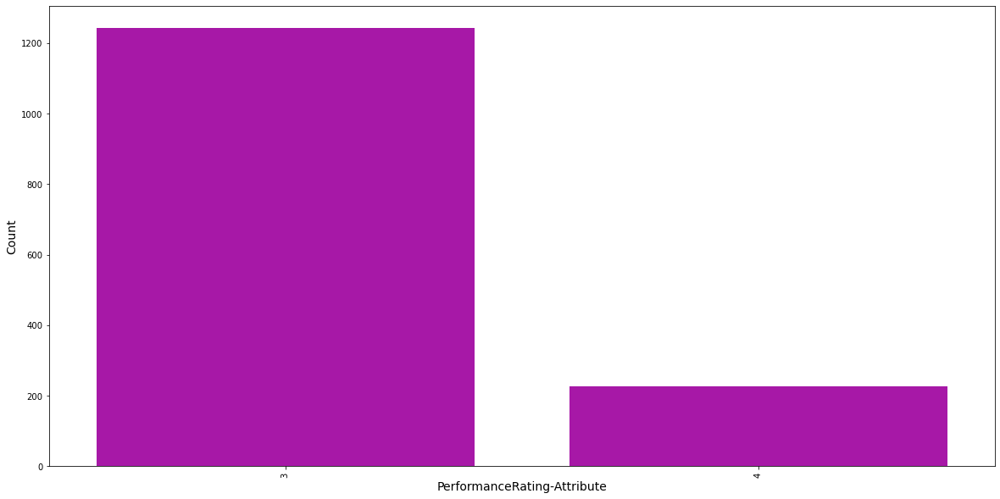



This is the Countplot diagram for--- RelationshipSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


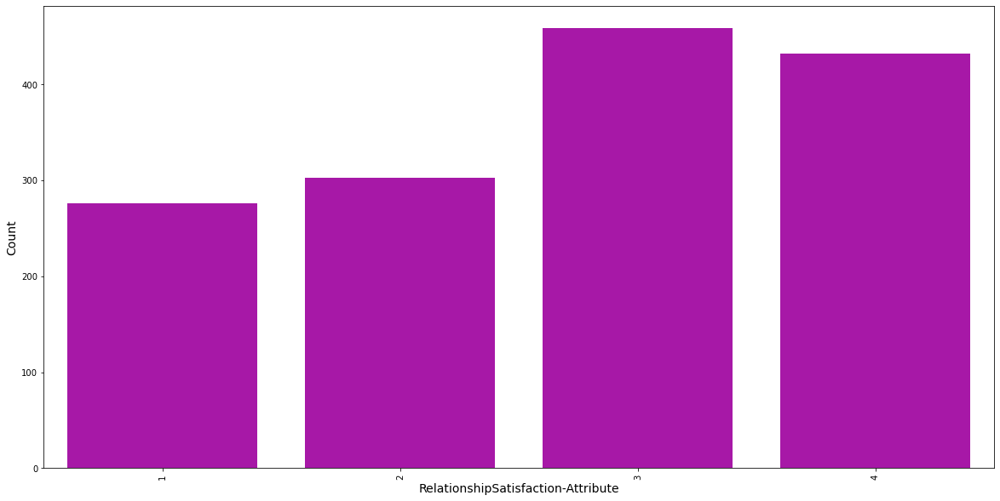



This is the Countplot diagram for--- StandardHours
AxesSubplot(0.125,0.125;0.775x0.755)


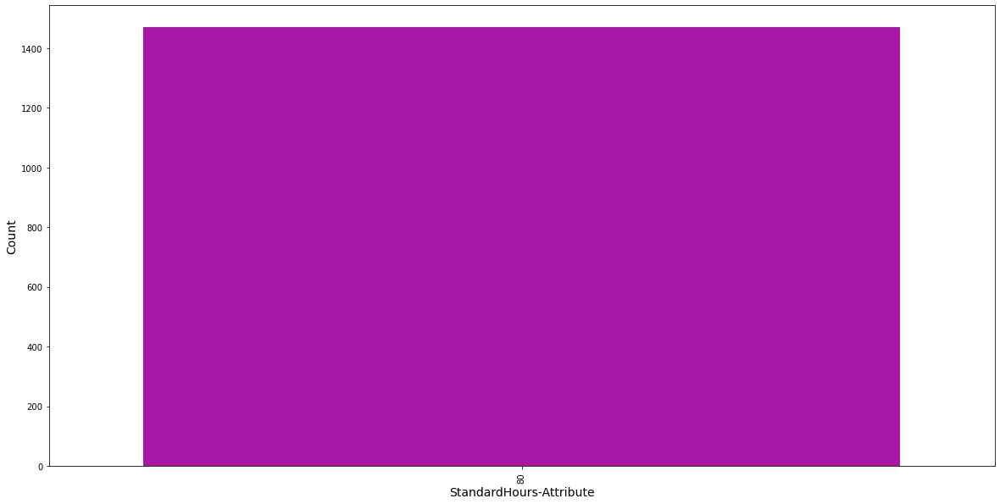



This is the Countplot diagram for--- StockOptionLevel
AxesSubplot(0.125,0.125;0.775x0.755)


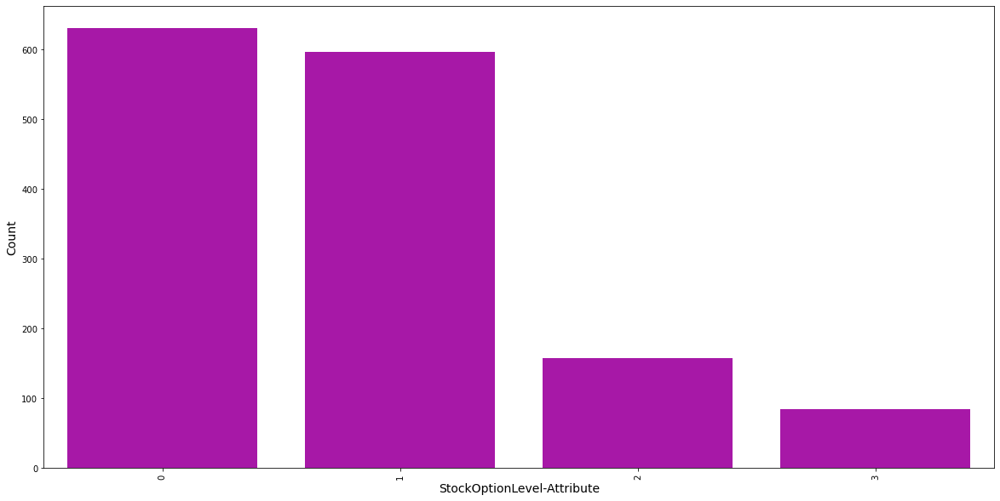



This is the Countplot diagram for--- TotalWorkingYears
AxesSubplot(0.125,0.125;0.775x0.755)


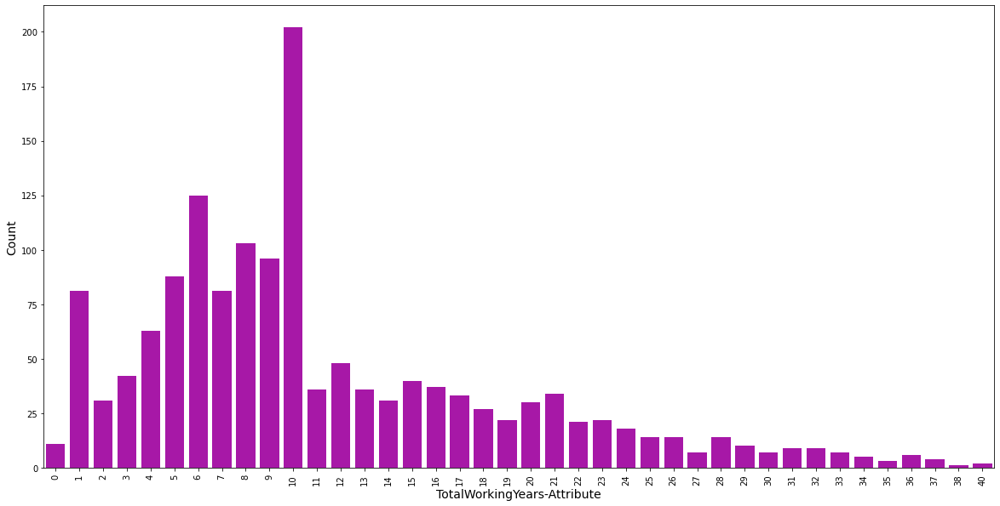



This is the Countplot diagram for--- TrainingTimesLastYear
AxesSubplot(0.125,0.125;0.775x0.755)


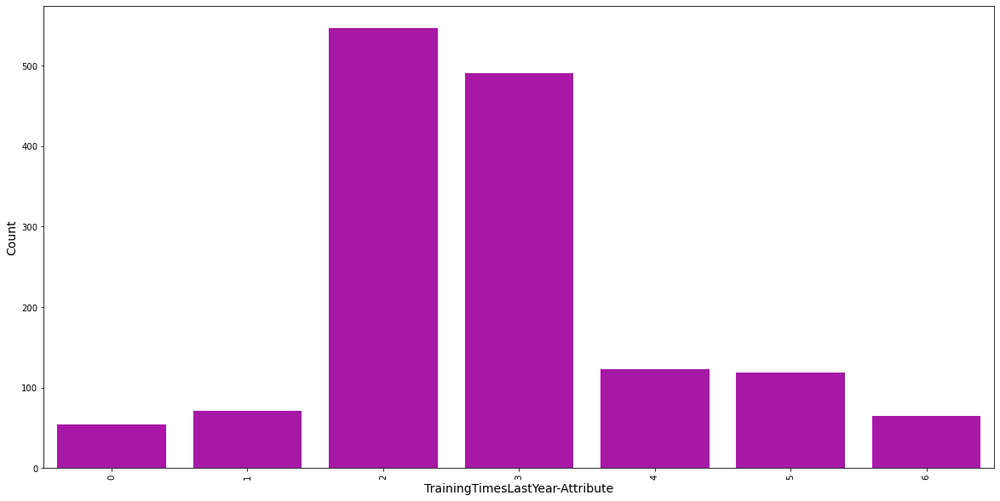



This is the Countplot diagram for--- WorkLifeBalance
AxesSubplot(0.125,0.125;0.775x0.755)


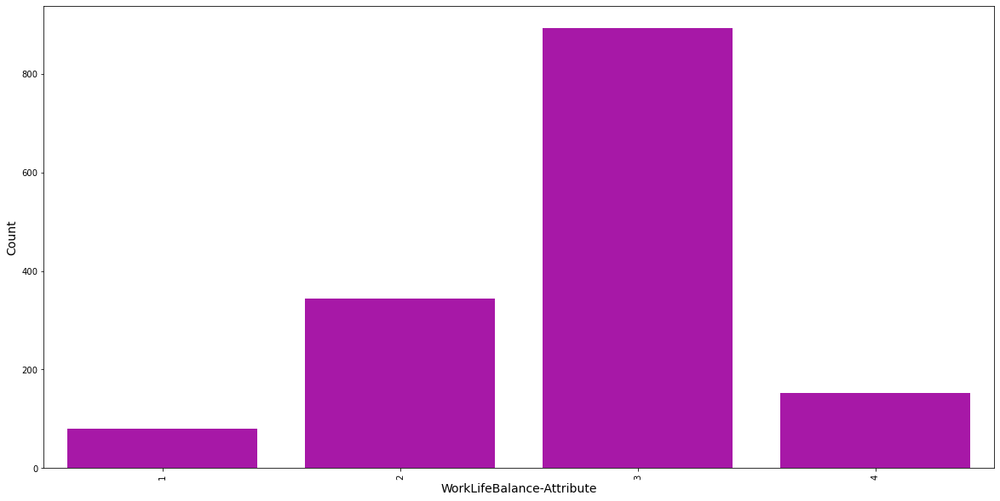



This is the Countplot diagram for--- YearsAtCompany
AxesSubplot(0.125,0.125;0.775x0.755)


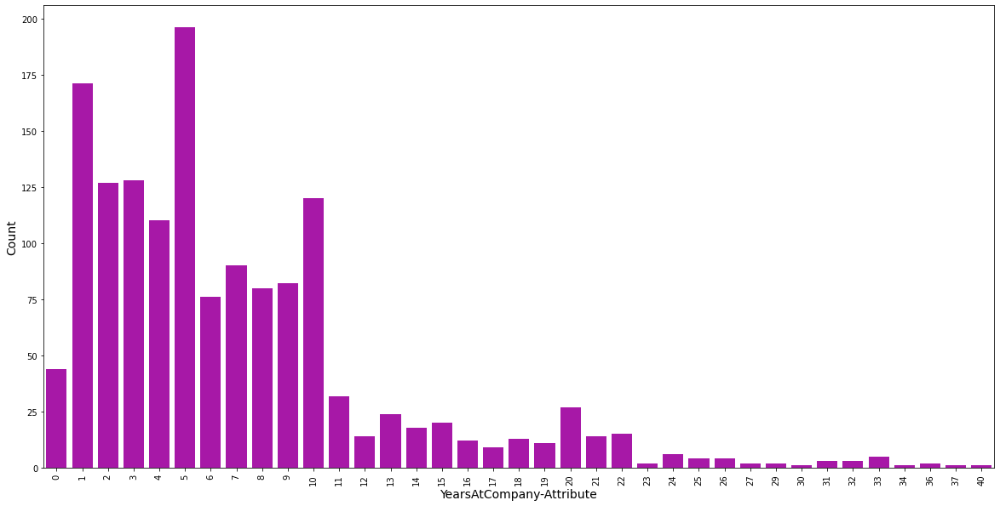



This is the Countplot diagram for--- YearsInCurrentRole
AxesSubplot(0.125,0.125;0.775x0.755)


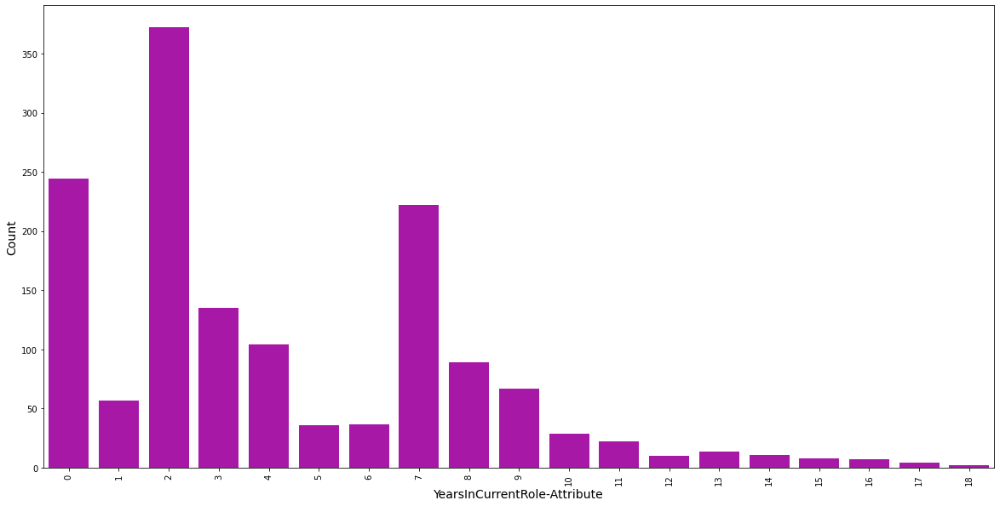



This is the Countplot diagram for--- YearsSinceLastPromotion
AxesSubplot(0.125,0.125;0.775x0.755)


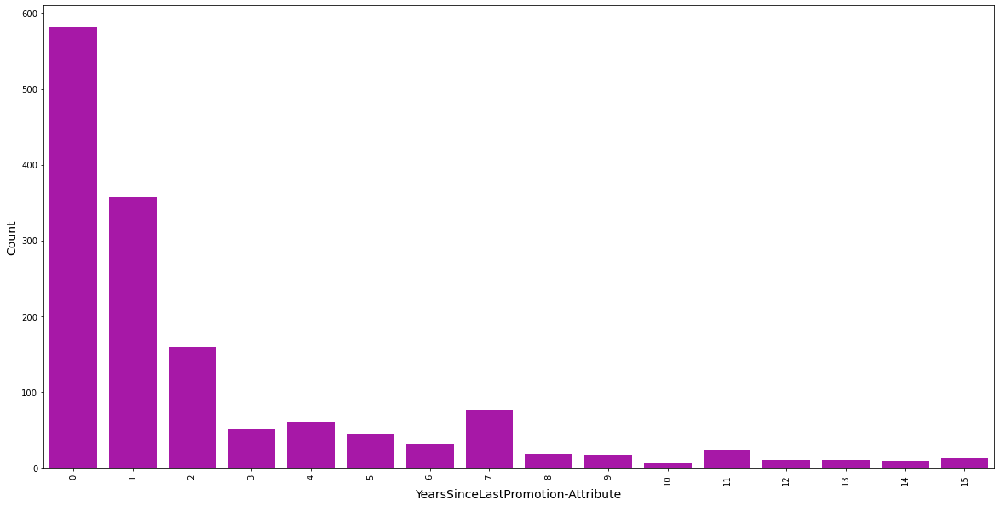



This is the Countplot diagram for--- YearsWithCurrManager
AxesSubplot(0.125,0.125;0.775x0.755)


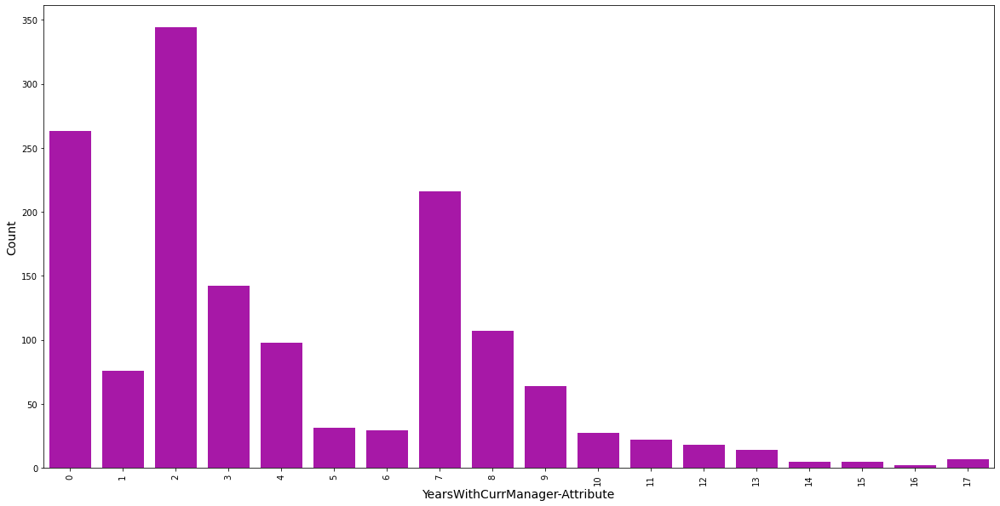

In [19]:
l=['Age', 'Attrition', 'BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    plt.figure(figsize=(20,10))
    print(f'This is the Countplot diagram for--- {i}')
    print(sns.countplot(df[i],color='m'))
    plt.xlabel(f'{i}-Attribute',fontsize=14)
    plt.ylabel('Count',fontsize=14)
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

###### This plot basically do the comparision of their counts with respect to given attributes.
1.Most employee are having age b/w 34-35

2.More than 1000 employees travels rarely

3.More than 950 employees are doing their jobs in Research and Development Department,more than 400 people in sales and very less employee are working in the Human Resource department

4.Employees having Education attribute 3 have maximum presence in the industry,i.e. there are approx 600 employee having Education attribute 3

5.More than 600 employee have their education field as Life Sciences then comes Medical having more than 400 employee.Human Resource is least favorable education Field among them

6.Male employees are more than Female employees.

7.More than 300 employee are having jobrole as Sales Executive and which is highest among all jobrole there in industry

8.Married employees(approx 700) presence are more than single and divorced

9.More than 500 employees has worked for atleast 1 company before

10.all the employees are over 18 age

11.More than 400 employees are doing overtime

12.More than 200 employees are getting salary hike b/w (11-14%)

13.More than 1200 employees are getting rating 3

14.Approx 200 employees are having work experiece of 10Yrs

15.More than 800 employees gives rating of 3 for work lifeBalance

16.Approx 200 employees are working at the present company from last 5Yrs
17.More than 350 employees are working since last 2 years in a same role

18.Approx 600 employees got promted in the same year which is highest from the last year promotion numbers and which was approx 350 previously.

19.Approx 350 employee are working with same manager since last 2 years

2. Histogram

This is the Histogram diagram for--- Age
AxesSubplot(0.125,0.125;0.775x0.755)


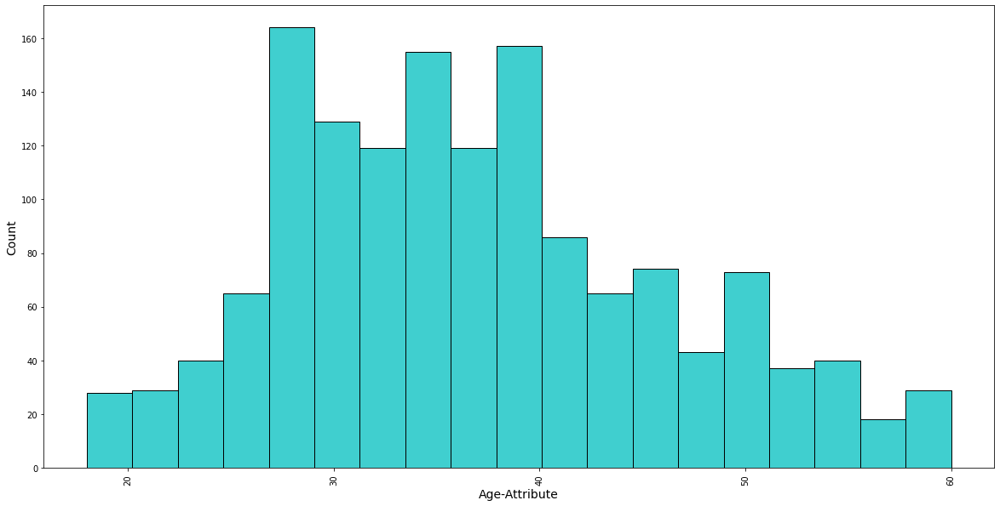



This is the Histogram diagram for--- Attrition
AxesSubplot(0.125,0.125;0.775x0.755)


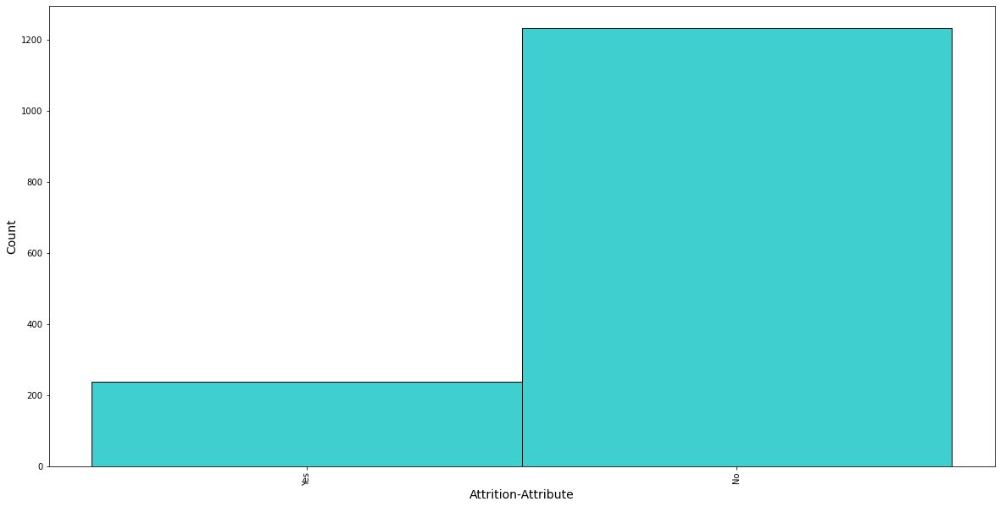



This is the Histogram diagram for--- BusinessTravel
AxesSubplot(0.125,0.125;0.775x0.755)


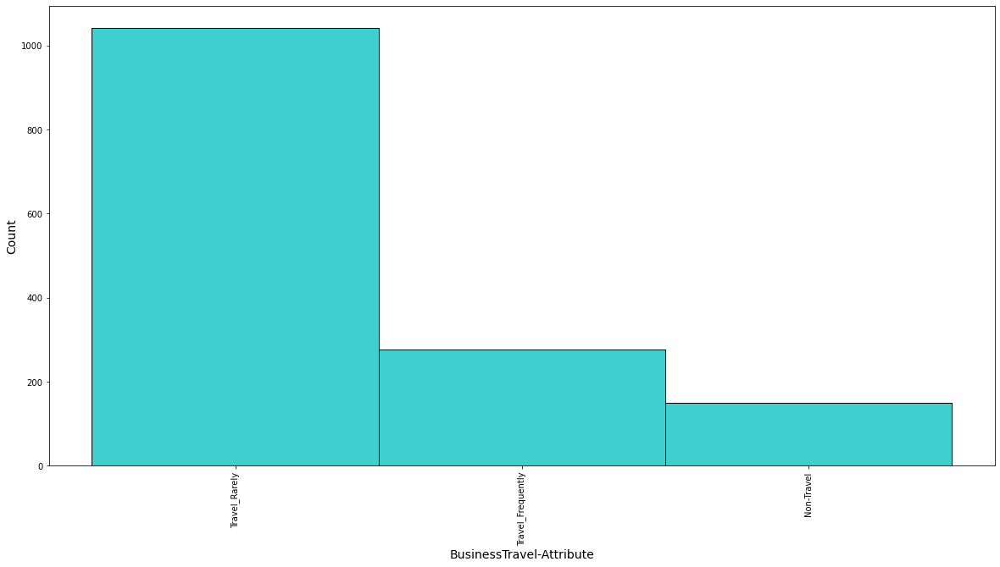



This is the Histogram diagram for--- Department
AxesSubplot(0.125,0.125;0.775x0.755)


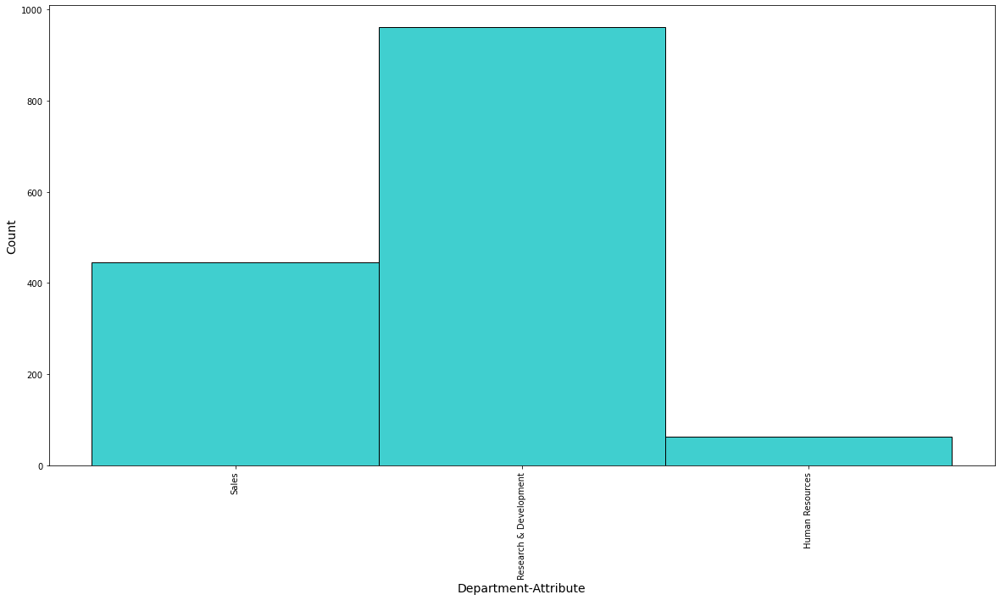



This is the Histogram diagram for--- DistanceFromHome
AxesSubplot(0.125,0.125;0.775x0.755)


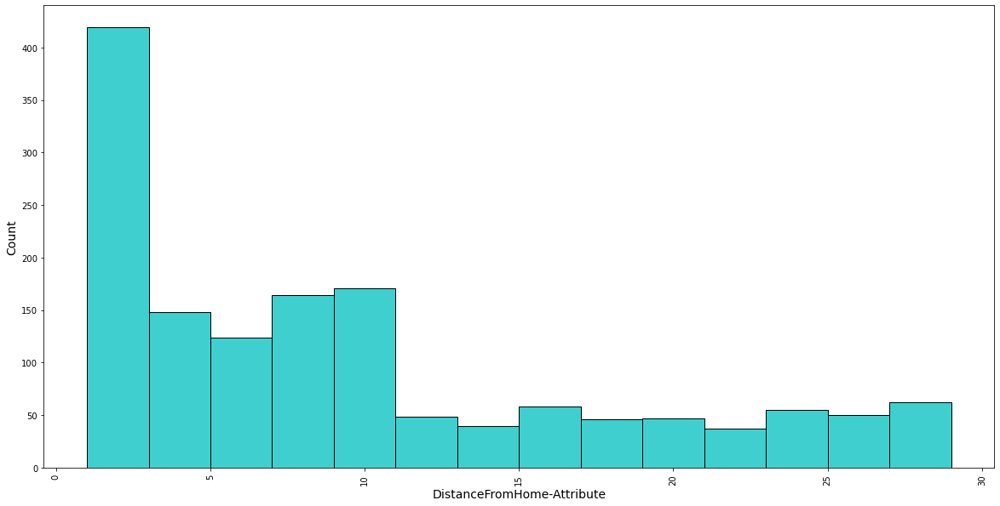



This is the Histogram diagram for--- Education
AxesSubplot(0.125,0.125;0.775x0.755)


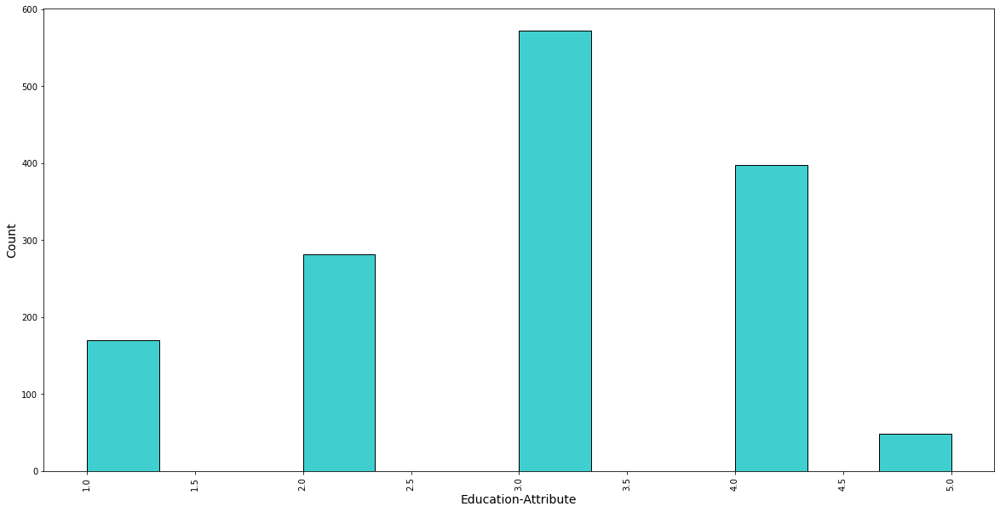



This is the Histogram diagram for--- EducationField
AxesSubplot(0.125,0.125;0.775x0.755)


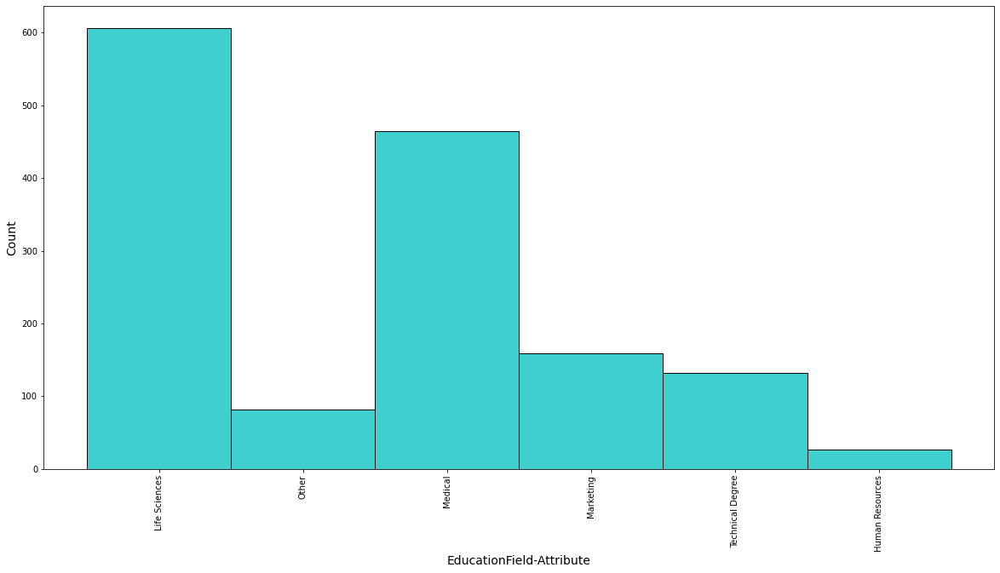



This is the Histogram diagram for--- EmployeeCount
AxesSubplot(0.125,0.125;0.775x0.755)


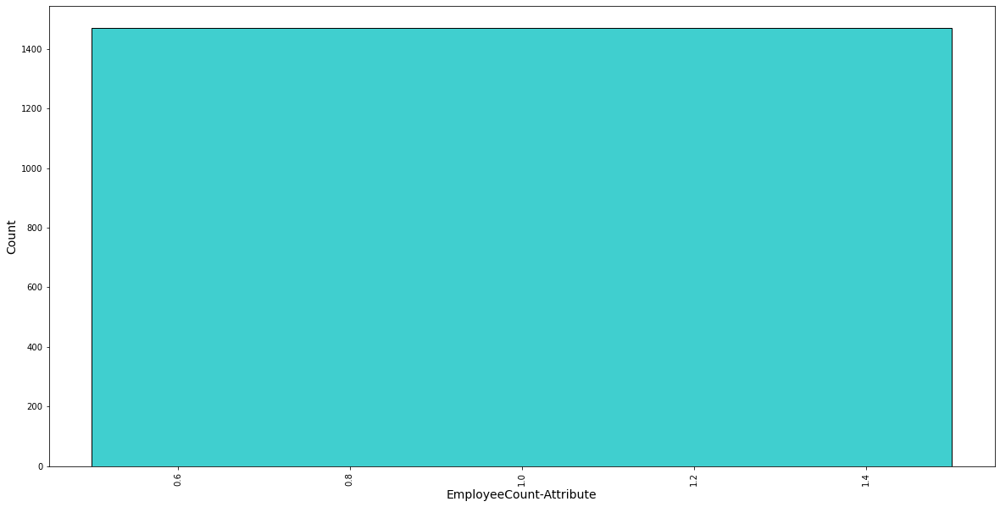



This is the Histogram diagram for--- EnvironmentSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


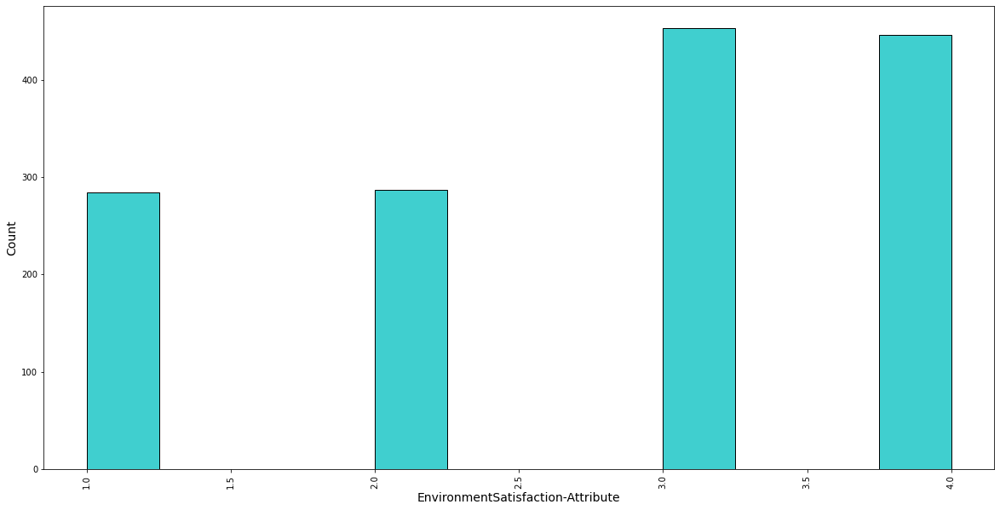



This is the Histogram diagram for--- Gender
AxesSubplot(0.125,0.125;0.775x0.755)


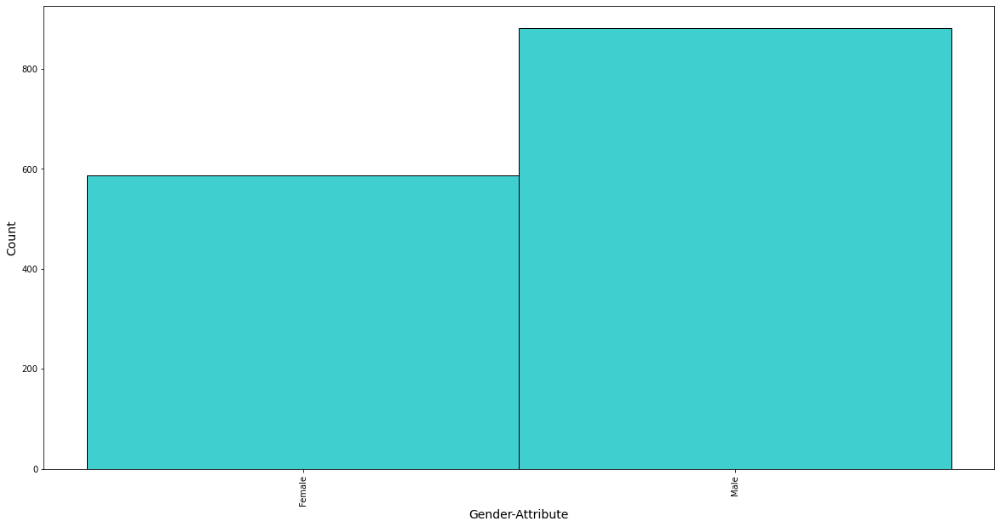



This is the Histogram diagram for--- HourlyRate
AxesSubplot(0.125,0.125;0.775x0.755)


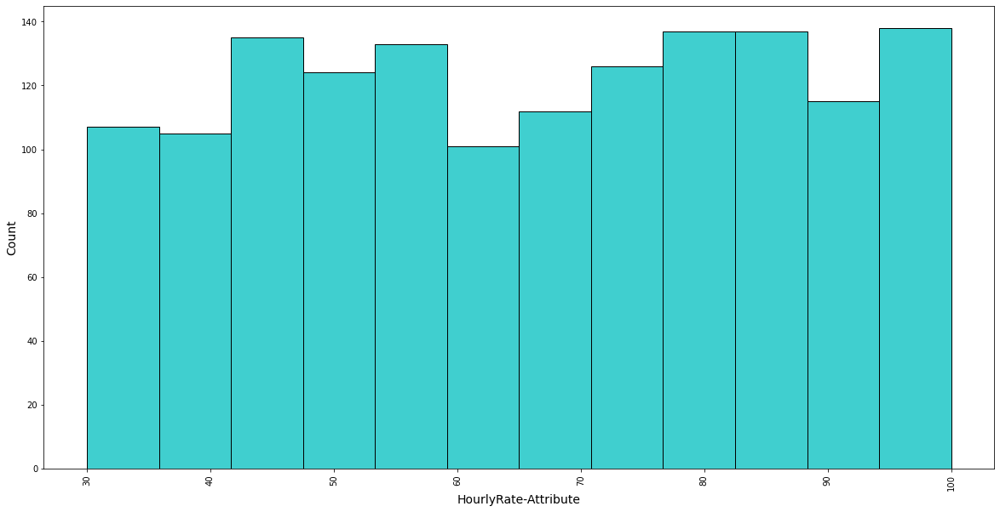



This is the Histogram diagram for--- JobInvolvement
AxesSubplot(0.125,0.125;0.775x0.755)


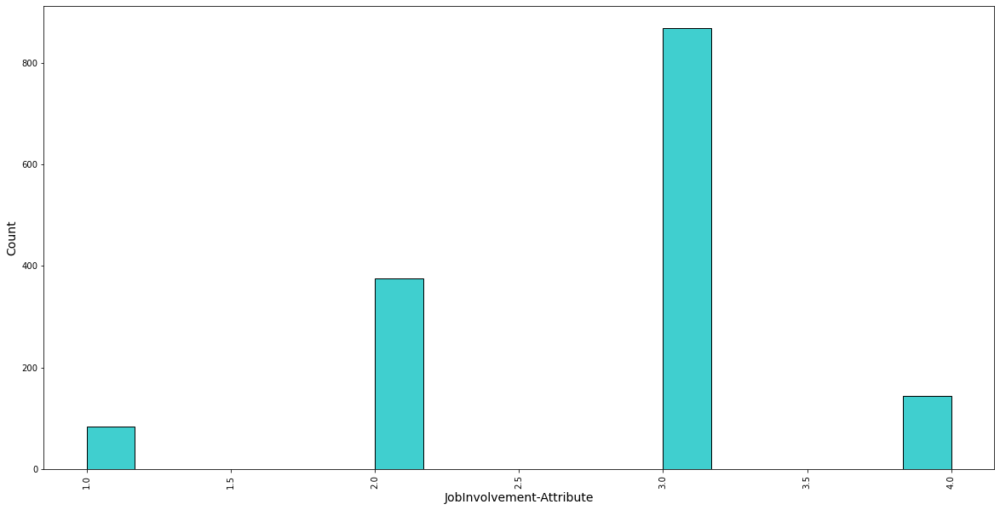



This is the Histogram diagram for--- JobLevel
AxesSubplot(0.125,0.125;0.775x0.755)


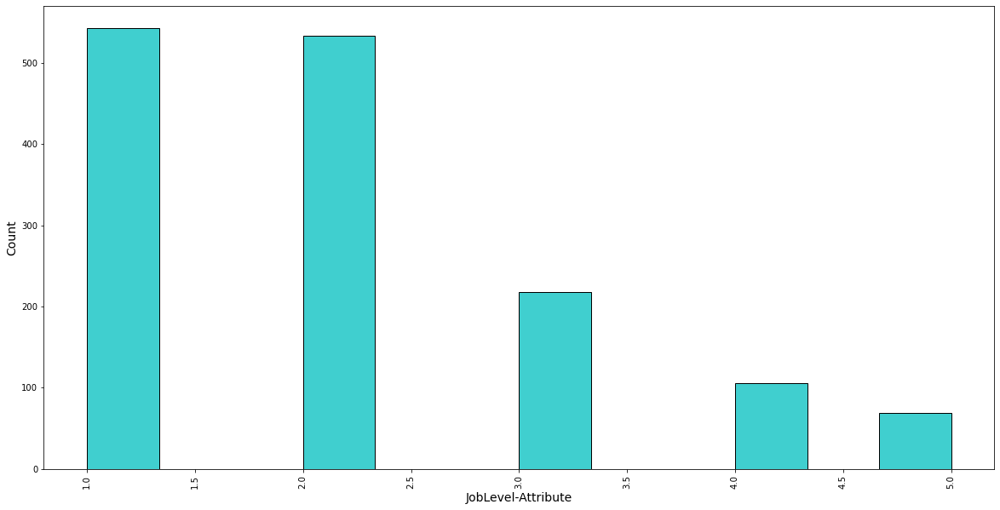



This is the Histogram diagram for--- JobRole
AxesSubplot(0.125,0.125;0.775x0.755)


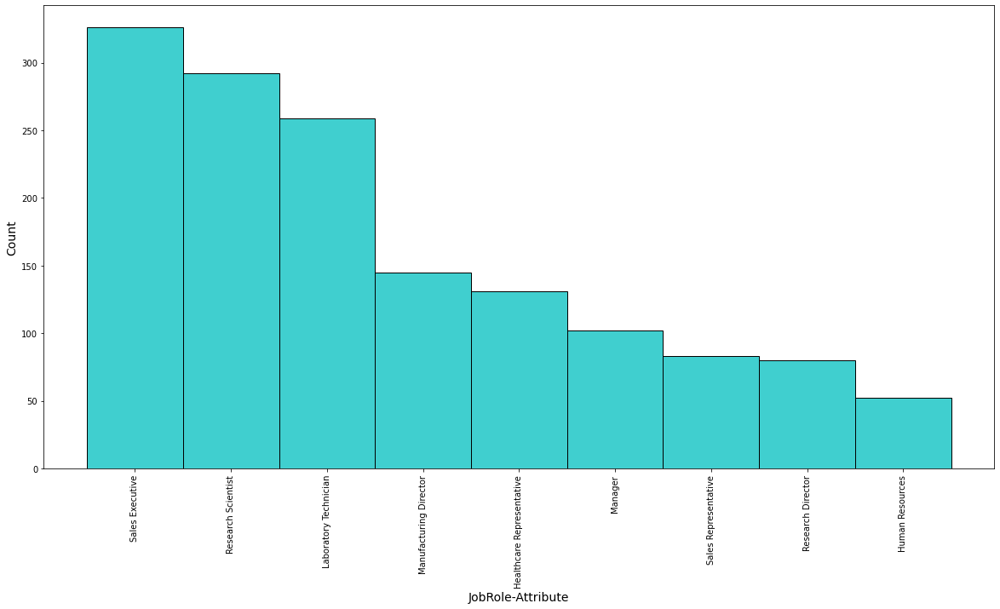



This is the Histogram diagram for--- JobSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


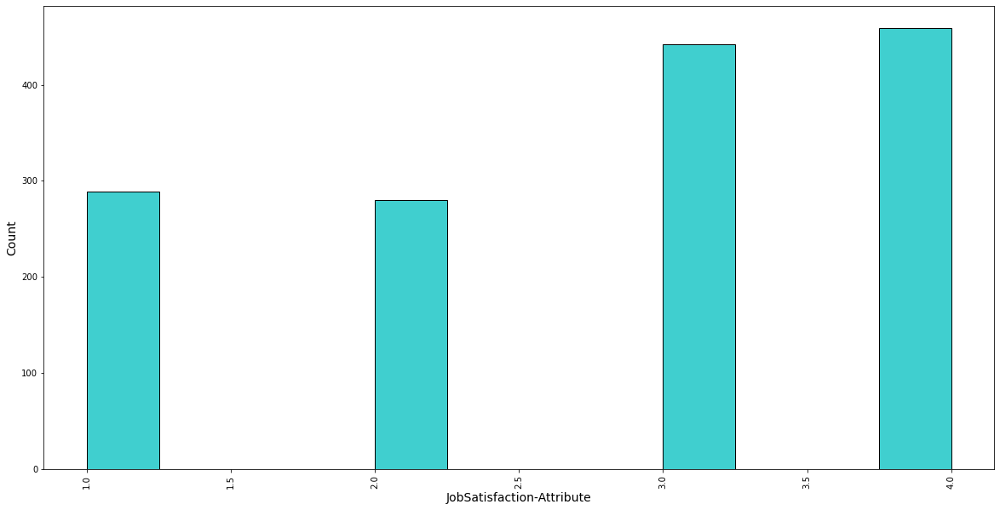



This is the Histogram diagram for--- MaritalStatus
AxesSubplot(0.125,0.125;0.775x0.755)


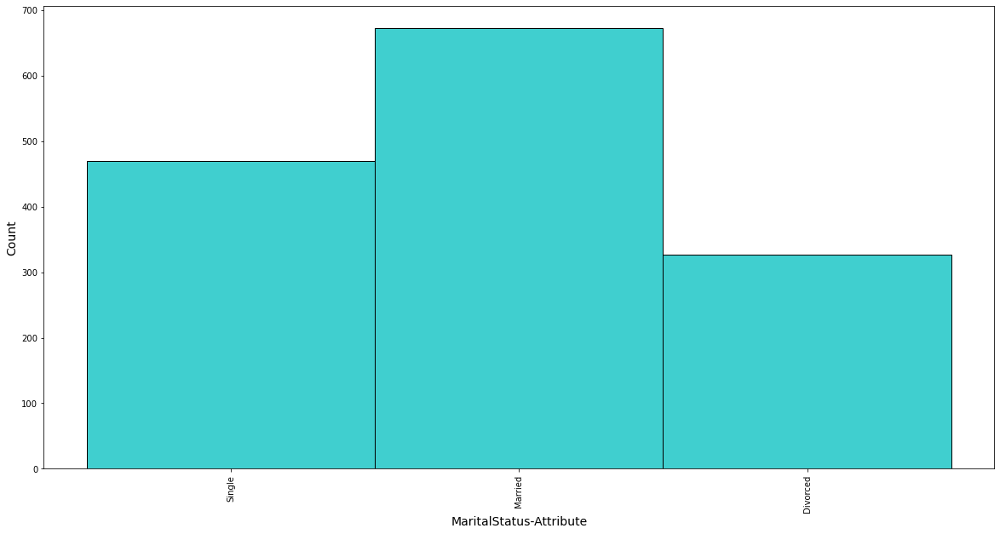



This is the Histogram diagram for--- NumCompaniesWorked
AxesSubplot(0.125,0.125;0.775x0.755)


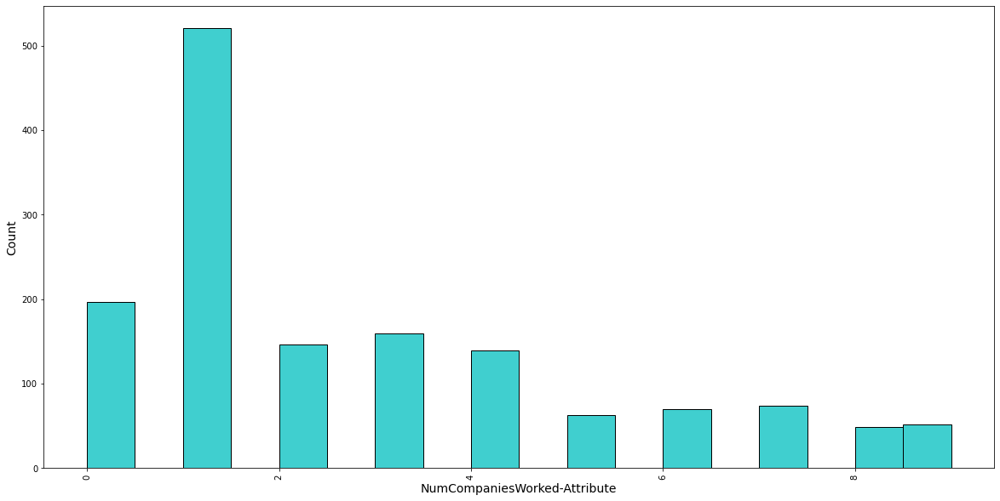



This is the Histogram diagram for--- Over18
AxesSubplot(0.125,0.125;0.775x0.755)


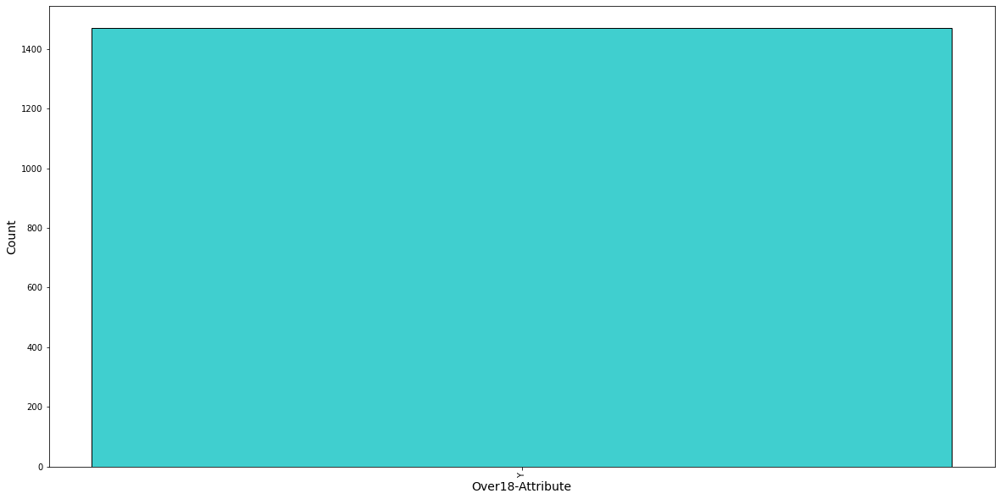



This is the Histogram diagram for--- OverTime
AxesSubplot(0.125,0.125;0.775x0.755)


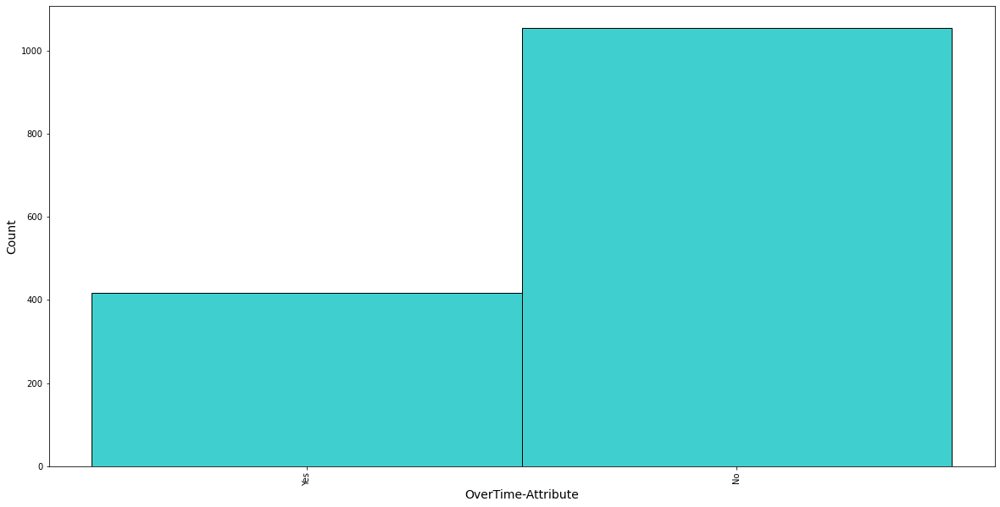



This is the Histogram diagram for--- PercentSalaryHike
AxesSubplot(0.125,0.125;0.775x0.755)


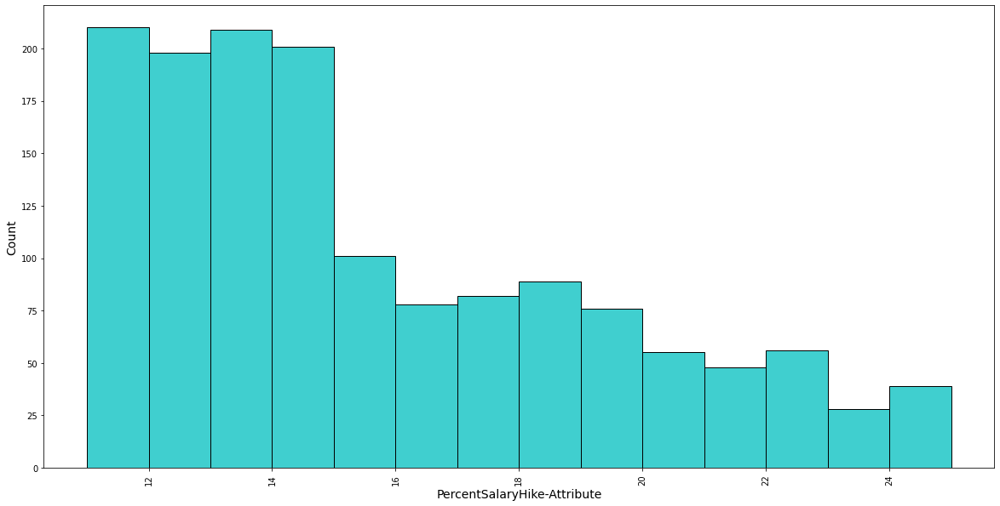



This is the Histogram diagram for--- PerformanceRating
AxesSubplot(0.125,0.125;0.775x0.755)


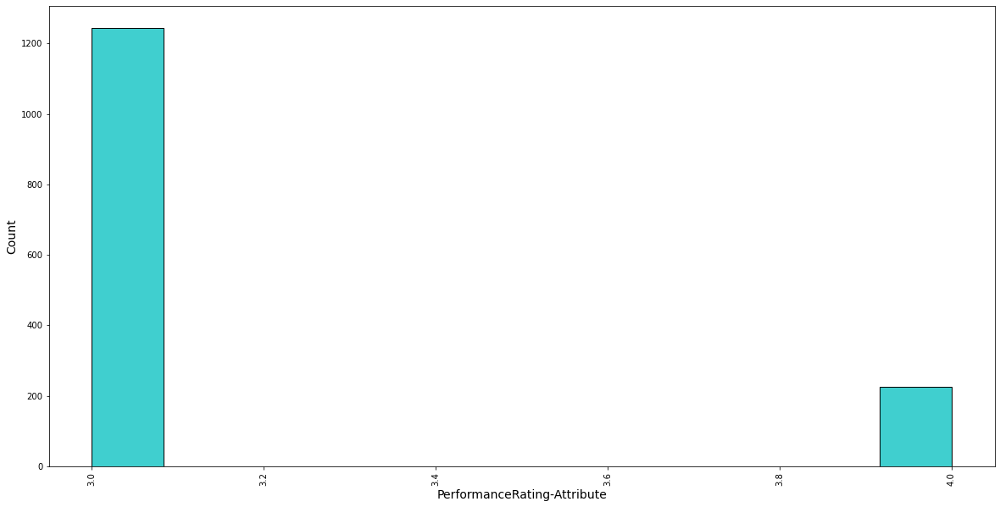



This is the Histogram diagram for--- RelationshipSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


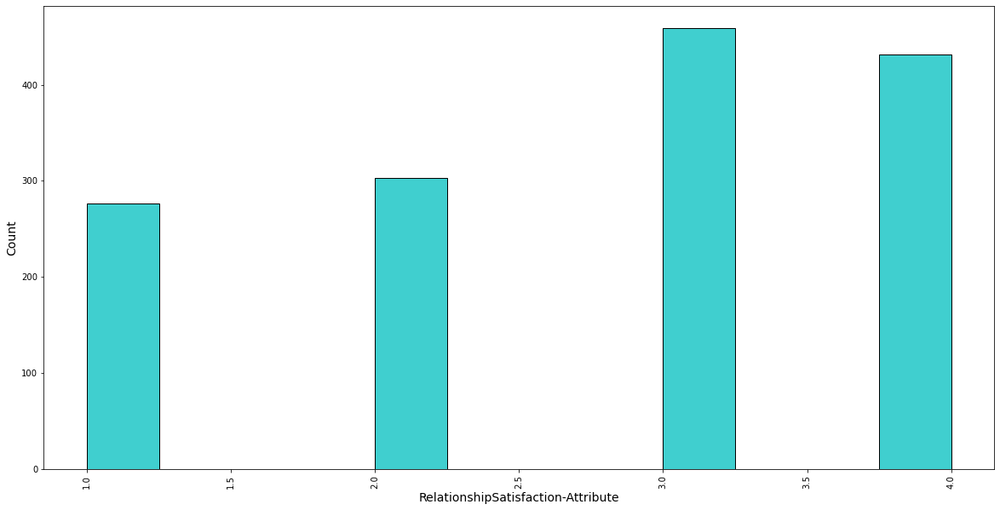



This is the Histogram diagram for--- StandardHours
AxesSubplot(0.125,0.125;0.775x0.755)


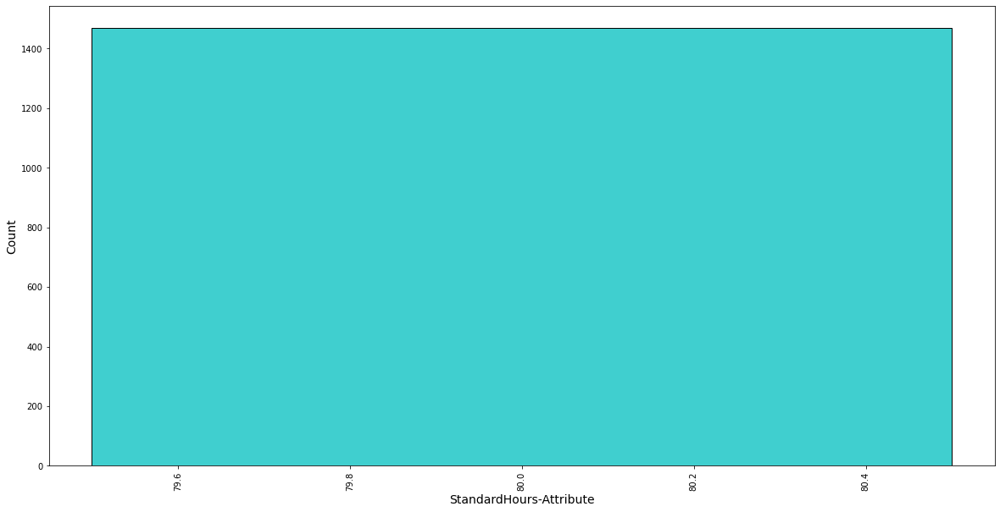



This is the Histogram diagram for--- StockOptionLevel
AxesSubplot(0.125,0.125;0.775x0.755)


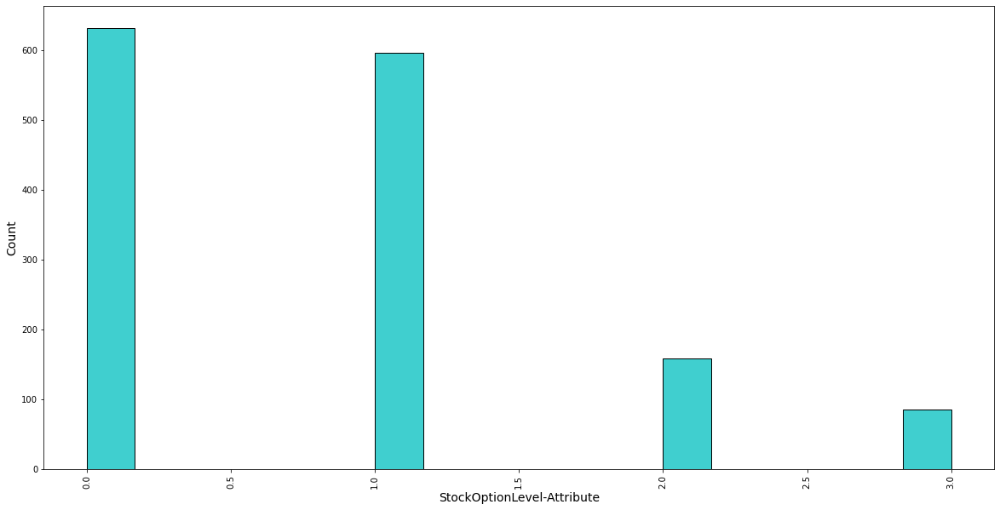



This is the Histogram diagram for--- TotalWorkingYears
AxesSubplot(0.125,0.125;0.775x0.755)


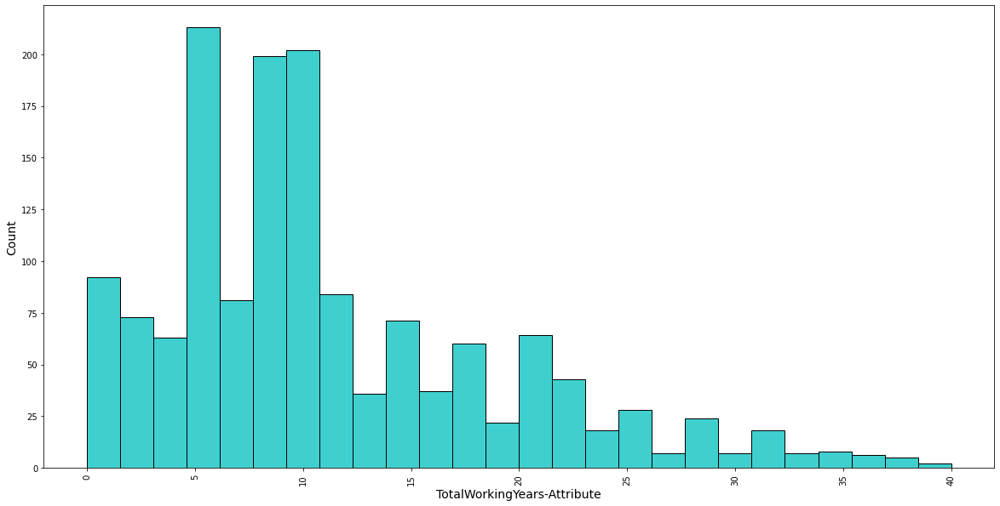



This is the Histogram diagram for--- TrainingTimesLastYear
AxesSubplot(0.125,0.125;0.775x0.755)


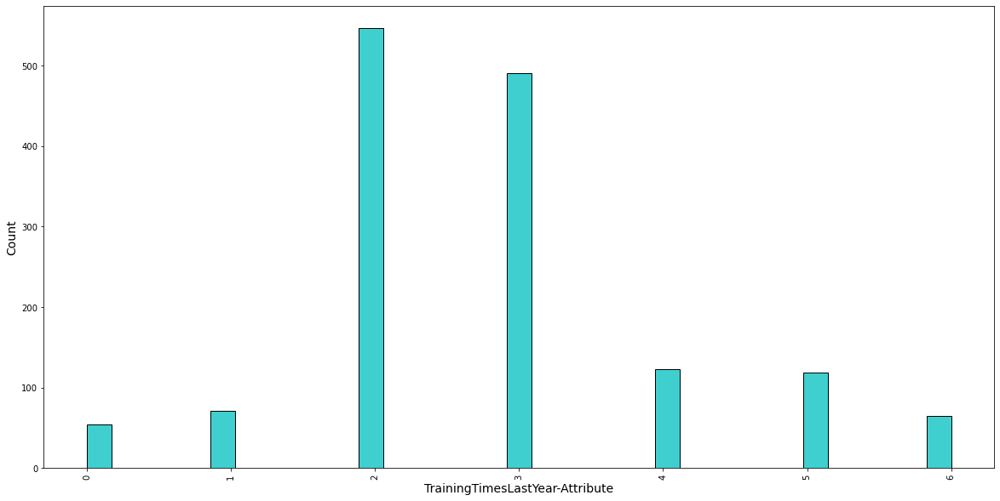



This is the Histogram diagram for--- WorkLifeBalance
AxesSubplot(0.125,0.125;0.775x0.755)


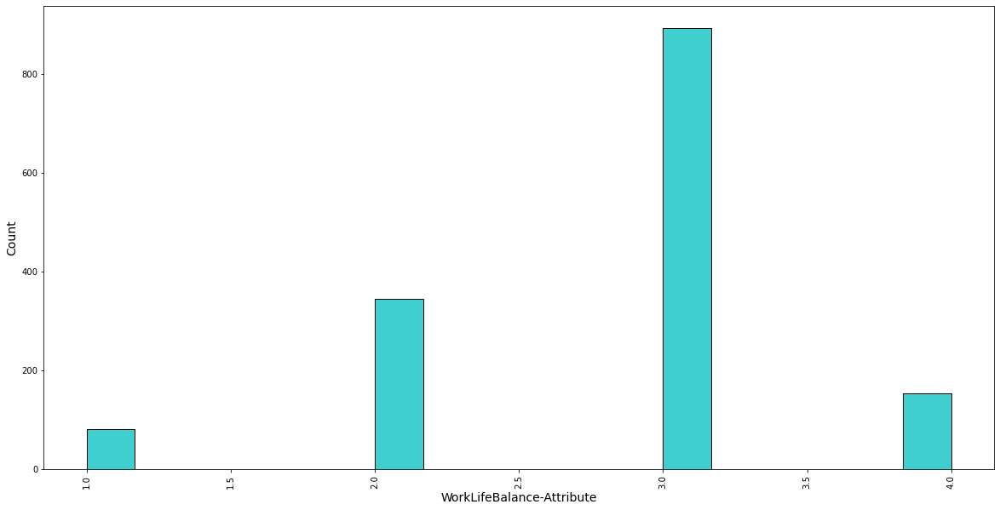



This is the Histogram diagram for--- YearsAtCompany
AxesSubplot(0.125,0.125;0.775x0.755)


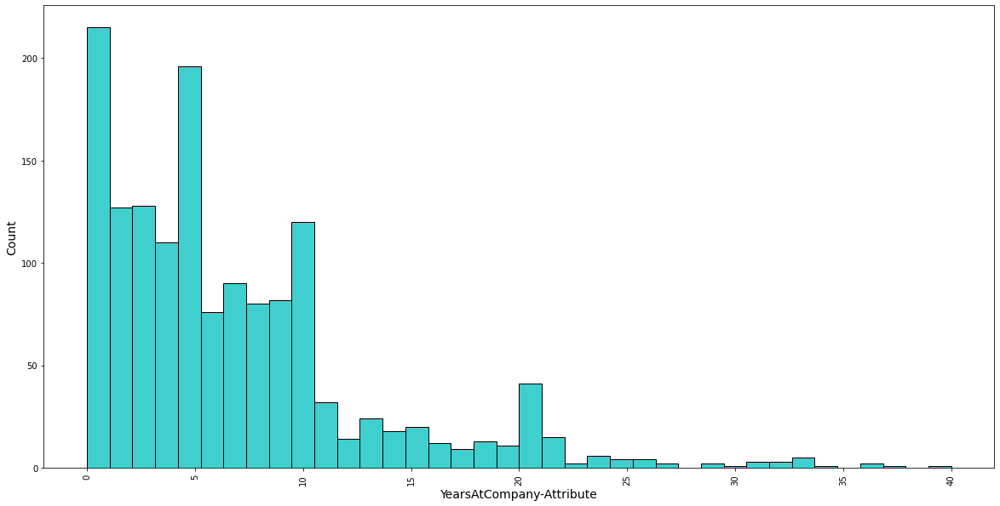



This is the Histogram diagram for--- YearsInCurrentRole
AxesSubplot(0.125,0.125;0.775x0.755)


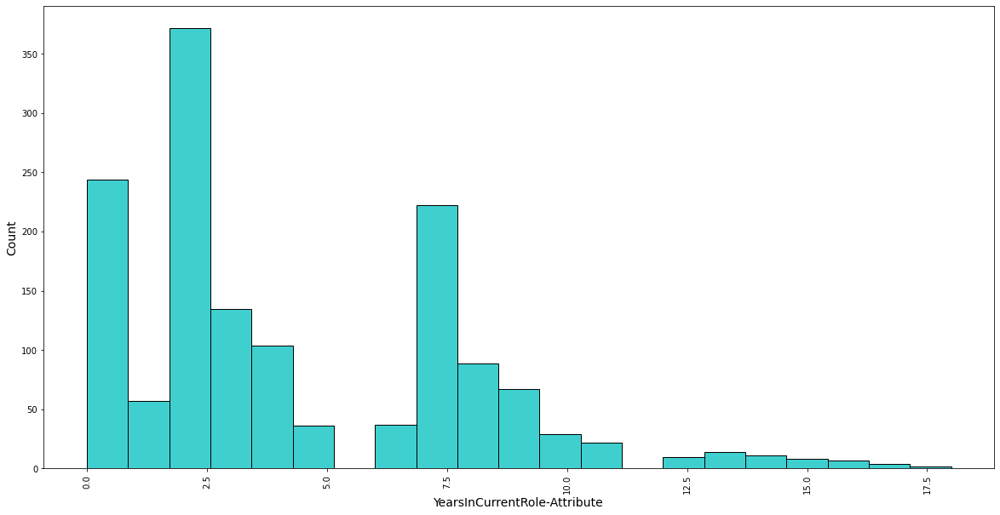



This is the Histogram diagram for--- YearsSinceLastPromotion
AxesSubplot(0.125,0.125;0.775x0.755)


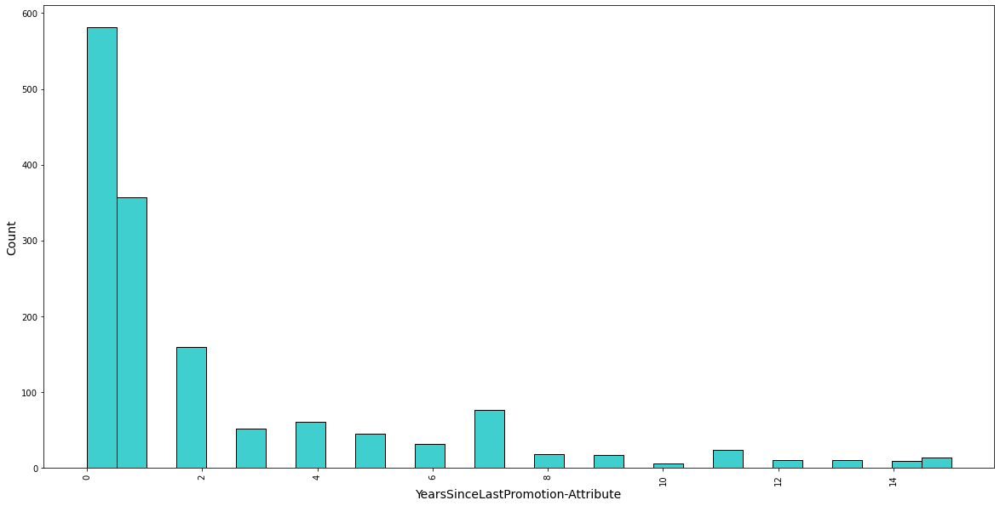



This is the Histogram diagram for--- YearsWithCurrManager
AxesSubplot(0.125,0.125;0.775x0.755)


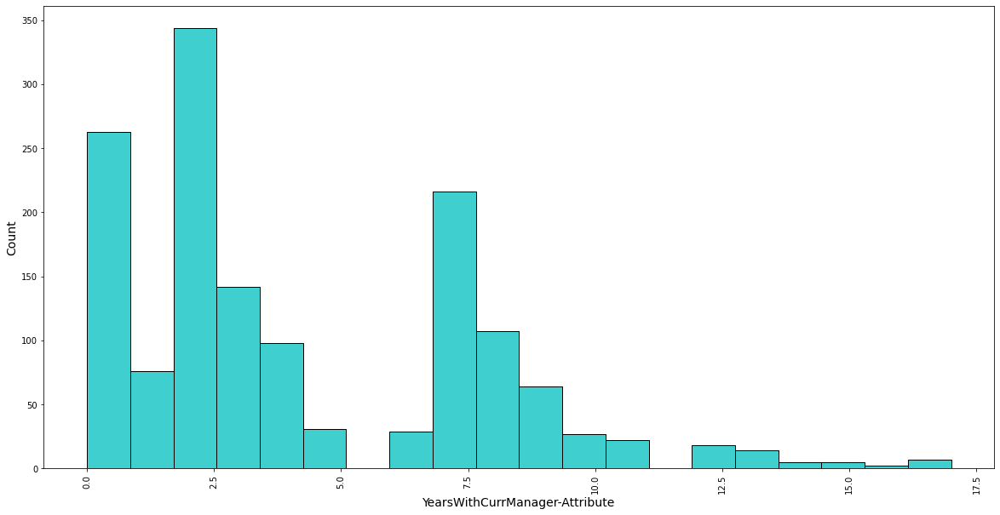

In [20]:
l=['Age', 'Attrition', 'BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    plt.figure(figsize=(20,10))
    print(f'This is the Histogram diagram for--- {i}')
    print(sns.histplot(df[i],color='c'))
    plt.xlabel(f'{i}-Attribute',fontsize=14)
    plt.ylabel('Count',fontsize=14)    
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

###### 3. Violinplot

This is the Violinplot diagram for--- Age
AxesSubplot(0.125,0.125;0.775x0.755)


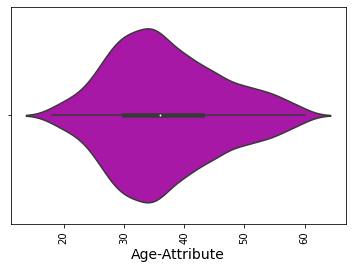



This is the Violinplot diagram for--- DistanceFromHome
AxesSubplot(0.125,0.125;0.775x0.755)


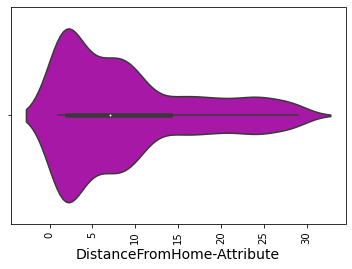



This is the Violinplot diagram for--- Education
AxesSubplot(0.125,0.125;0.775x0.755)


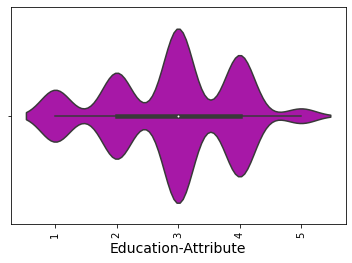



This is the Violinplot diagram for--- EmployeeCount
AxesSubplot(0.125,0.125;0.775x0.755)


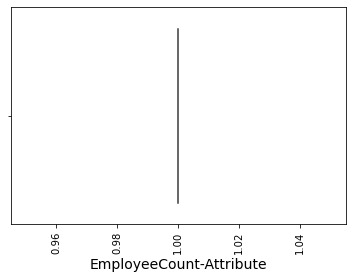



This is the Violinplot diagram for--- EnvironmentSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


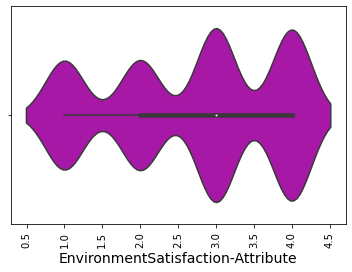



This is the Violinplot diagram for--- HourlyRate
AxesSubplot(0.125,0.125;0.775x0.755)


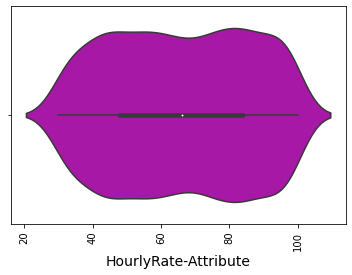



This is the Violinplot diagram for--- JobInvolvement
AxesSubplot(0.125,0.125;0.775x0.755)


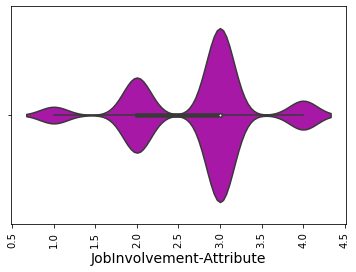



This is the Violinplot diagram for--- JobLevel
AxesSubplot(0.125,0.125;0.775x0.755)


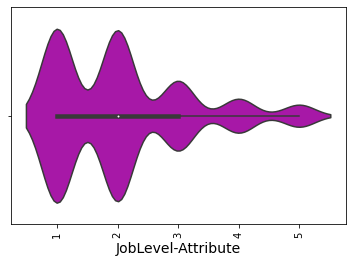



This is the Violinplot diagram for--- JobSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


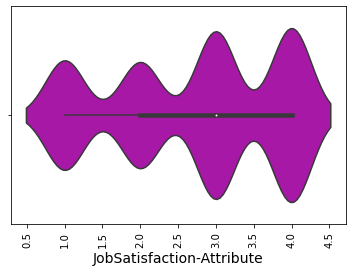



This is the Violinplot diagram for--- NumCompaniesWorked
AxesSubplot(0.125,0.125;0.775x0.755)


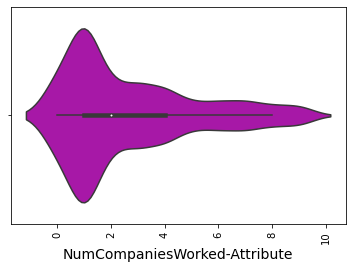



This is the Violinplot diagram for--- PercentSalaryHike
AxesSubplot(0.125,0.125;0.775x0.755)


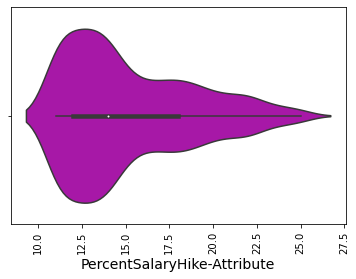



This is the Violinplot diagram for--- PerformanceRating
AxesSubplot(0.125,0.125;0.775x0.755)


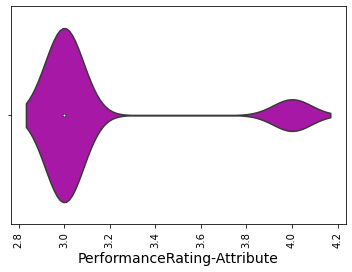



This is the Violinplot diagram for--- RelationshipSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


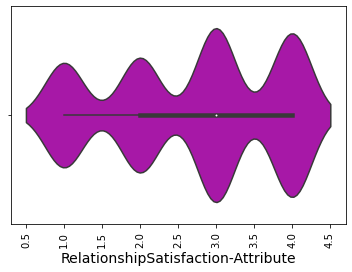



This is the Violinplot diagram for--- StandardHours
AxesSubplot(0.125,0.125;0.775x0.755)


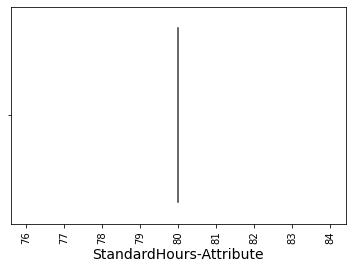



This is the Violinplot diagram for--- StockOptionLevel
AxesSubplot(0.125,0.125;0.775x0.755)


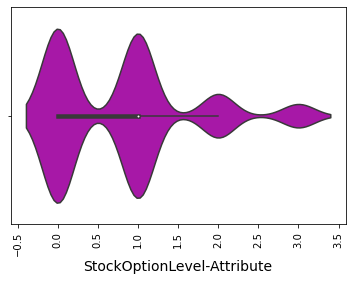



This is the Violinplot diagram for--- TotalWorkingYears
AxesSubplot(0.125,0.125;0.775x0.755)


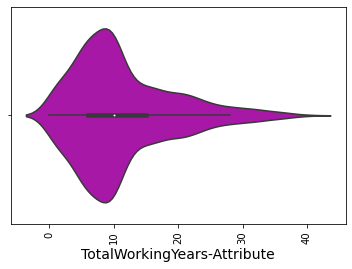



This is the Violinplot diagram for--- TrainingTimesLastYear
AxesSubplot(0.125,0.125;0.775x0.755)


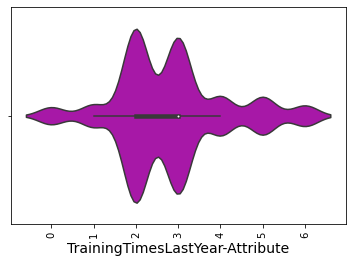



This is the Violinplot diagram for--- WorkLifeBalance
AxesSubplot(0.125,0.125;0.775x0.755)


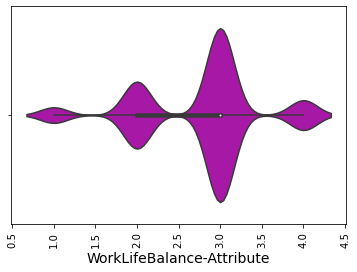



This is the Violinplot diagram for--- YearsAtCompany
AxesSubplot(0.125,0.125;0.775x0.755)


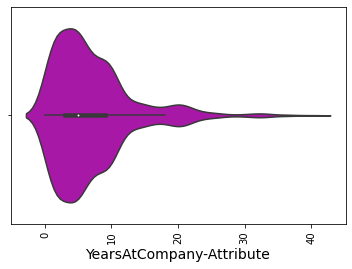



This is the Violinplot diagram for--- YearsInCurrentRole
AxesSubplot(0.125,0.125;0.775x0.755)


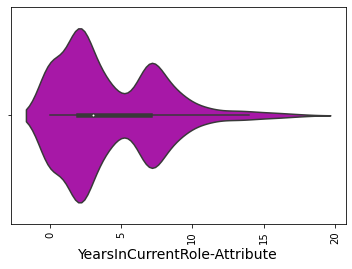



This is the Violinplot diagram for--- YearsSinceLastPromotion
AxesSubplot(0.125,0.125;0.775x0.755)


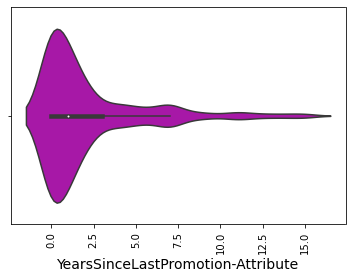



This is the Violinplot diagram for--- YearsWithCurrManager
AxesSubplot(0.125,0.125;0.775x0.755)


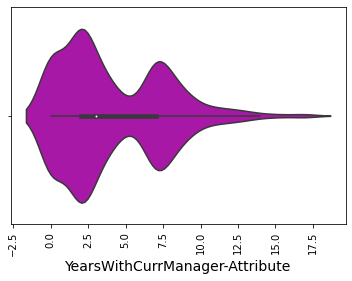

In [21]:
#only numeric columns are there
l=['Age','DistanceFromHome', 'Education', 'EmployeeCount','EnvironmentSatisfaction', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobSatisfaction', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    print(f'This is the Violinplot diagram for--- {i}')
    print(sns.violinplot(df[i],color='m'))
    plt.xlabel(f'{i}-Attribute',fontsize=14)
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

## We can plot Violinplot diagram only for numeric columns as it doesn't support Categorical Columns.
Age of the employees in b/w 30-40

Education Attribute 3 has highest data

Environment Satisfactio is b/w 3-4

Hourly rate is in b/w Rs.40-80

Jobsatisfaction is in b/w 3-4

More Employees are getting performance rating as 3 and very few are getting 4 and above

Training provided last year was in b/w- 2times to 3 times and 2times training was happend more than 3 times training.

Most employee are working with the same manager since last 2 years

###### Scatterplot

This is a Scatterplot diagram b/w attributes- Attrition & Age
AxesSubplot(0.125,0.125;0.775x0.755)


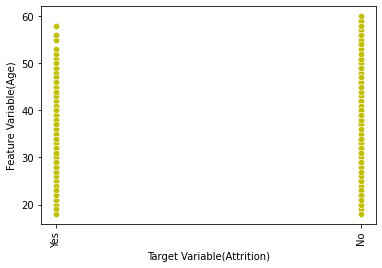



This is a Scatterplot diagram b/w attributes- Attrition & BusinessTravel
AxesSubplot(0.125,0.125;0.775x0.755)


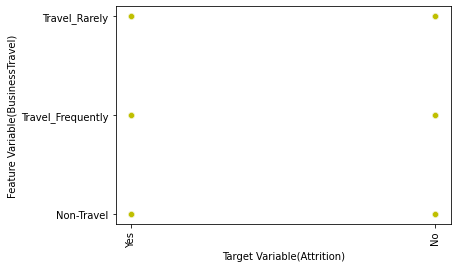



This is a Scatterplot diagram b/w attributes- Attrition & Department
AxesSubplot(0.125,0.125;0.775x0.755)


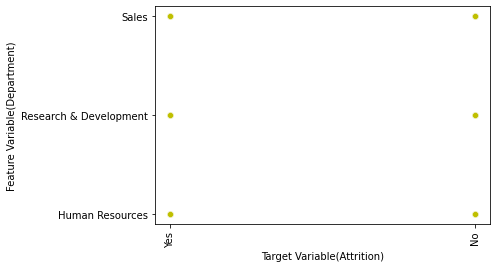



This is a Scatterplot diagram b/w attributes- Attrition & DistanceFromHome
AxesSubplot(0.125,0.125;0.775x0.755)


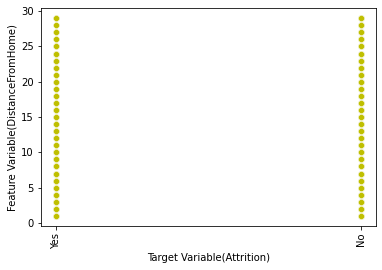



This is a Scatterplot diagram b/w attributes- Attrition & Education
AxesSubplot(0.125,0.125;0.775x0.755)


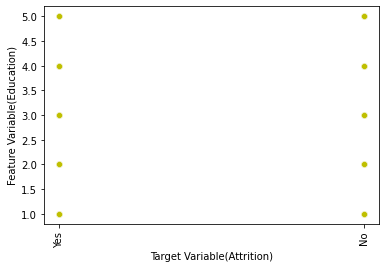



This is a Scatterplot diagram b/w attributes- Attrition & EducationField
AxesSubplot(0.125,0.125;0.775x0.755)


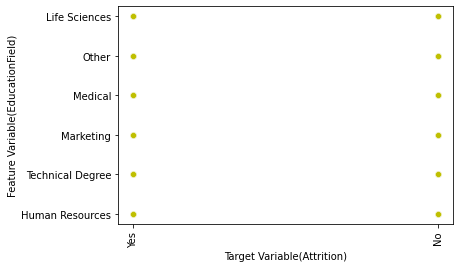



This is a Scatterplot diagram b/w attributes- Attrition & EmployeeCount
AxesSubplot(0.125,0.125;0.775x0.755)


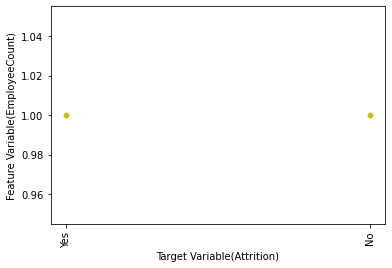



This is a Scatterplot diagram b/w attributes- Attrition & EnvironmentSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


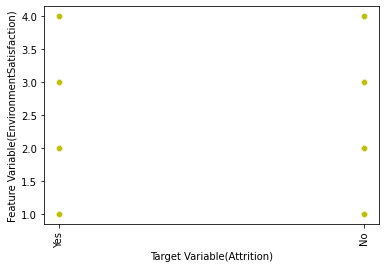



This is a Scatterplot diagram b/w attributes- Attrition & Gender
AxesSubplot(0.125,0.125;0.775x0.755)


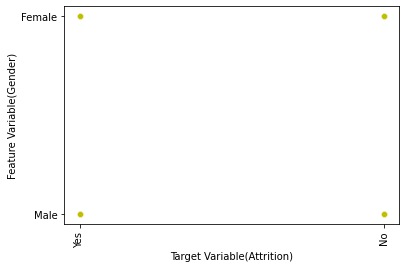



This is a Scatterplot diagram b/w attributes- Attrition & HourlyRate
AxesSubplot(0.125,0.125;0.775x0.755)


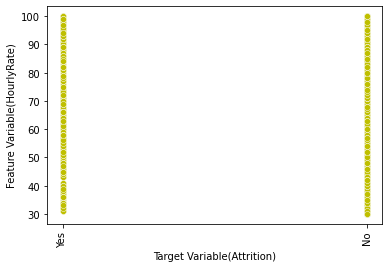



This is a Scatterplot diagram b/w attributes- Attrition & JobInvolvement
AxesSubplot(0.125,0.125;0.775x0.755)


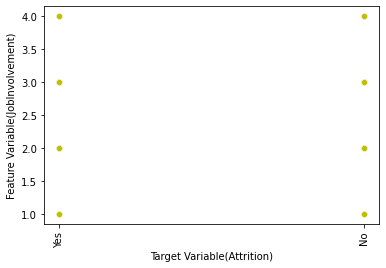



This is a Scatterplot diagram b/w attributes- Attrition & JobLevel
AxesSubplot(0.125,0.125;0.775x0.755)


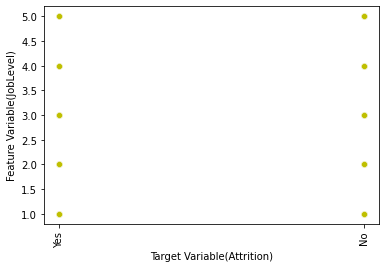



This is a Scatterplot diagram b/w attributes- Attrition & JobRole
AxesSubplot(0.125,0.125;0.775x0.755)


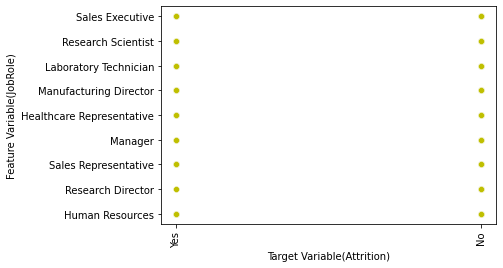



This is a Scatterplot diagram b/w attributes- Attrition & JobSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


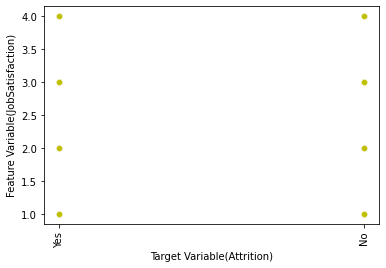



This is a Scatterplot diagram b/w attributes- Attrition & MaritalStatus
AxesSubplot(0.125,0.125;0.775x0.755)


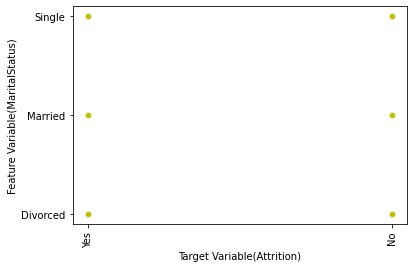



This is a Scatterplot diagram b/w attributes- Attrition & NumCompaniesWorked
AxesSubplot(0.125,0.125;0.775x0.755)


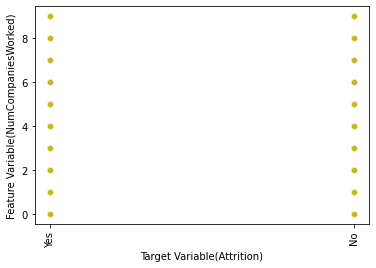



This is a Scatterplot diagram b/w attributes- Attrition & Over18
AxesSubplot(0.125,0.125;0.775x0.755)


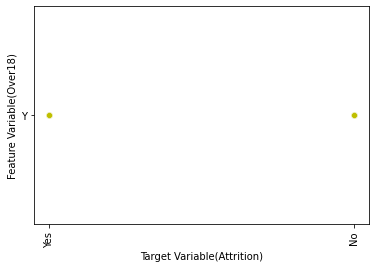



This is a Scatterplot diagram b/w attributes- Attrition & OverTime
AxesSubplot(0.125,0.125;0.775x0.755)


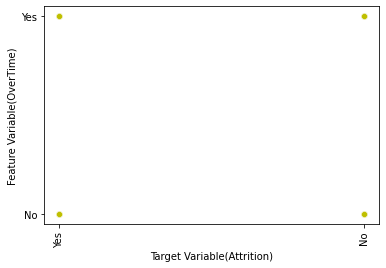



This is a Scatterplot diagram b/w attributes- Attrition & PercentSalaryHike
AxesSubplot(0.125,0.125;0.775x0.755)


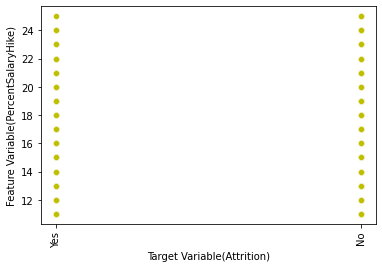



This is a Scatterplot diagram b/w attributes- Attrition & PerformanceRating
AxesSubplot(0.125,0.125;0.775x0.755)


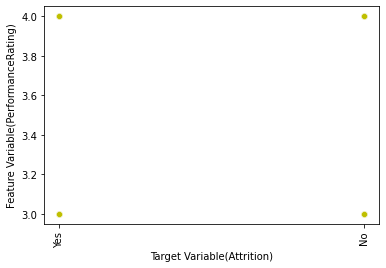



This is a Scatterplot diagram b/w attributes- Attrition & RelationshipSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


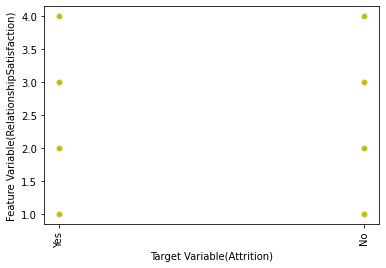



This is a Scatterplot diagram b/w attributes- Attrition & StandardHours
AxesSubplot(0.125,0.125;0.775x0.755)


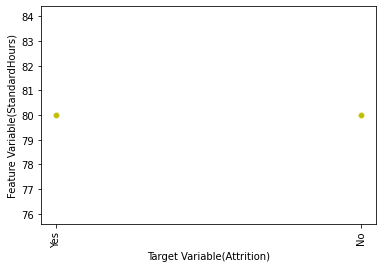



This is a Scatterplot diagram b/w attributes- Attrition & StockOptionLevel
AxesSubplot(0.125,0.125;0.775x0.755)


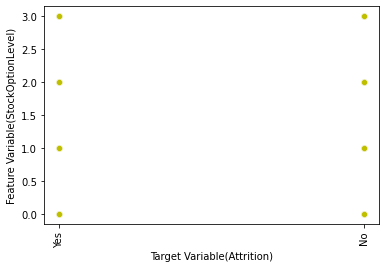



This is a Scatterplot diagram b/w attributes- Attrition & TotalWorkingYears
AxesSubplot(0.125,0.125;0.775x0.755)


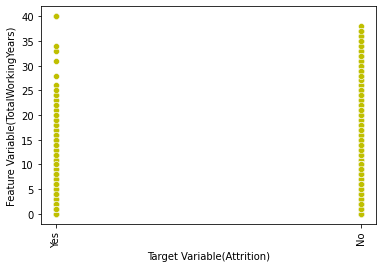



This is a Scatterplot diagram b/w attributes- Attrition & TrainingTimesLastYear
AxesSubplot(0.125,0.125;0.775x0.755)


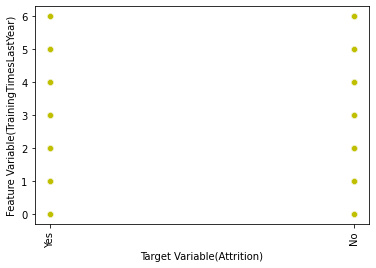



This is a Scatterplot diagram b/w attributes- Attrition & WorkLifeBalance
AxesSubplot(0.125,0.125;0.775x0.755)


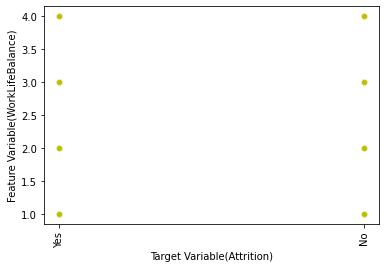



This is a Scatterplot diagram b/w attributes- Attrition & YearsAtCompany
AxesSubplot(0.125,0.125;0.775x0.755)


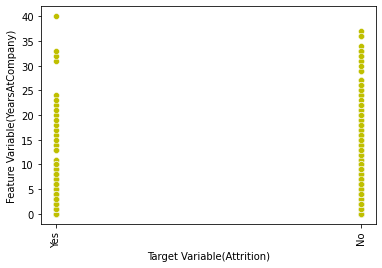



This is a Scatterplot diagram b/w attributes- Attrition & YearsInCurrentRole
AxesSubplot(0.125,0.125;0.775x0.755)


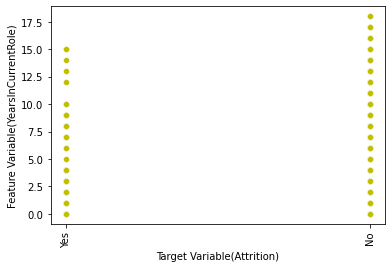



This is a Scatterplot diagram b/w attributes- Attrition & YearsSinceLastPromotion
AxesSubplot(0.125,0.125;0.775x0.755)


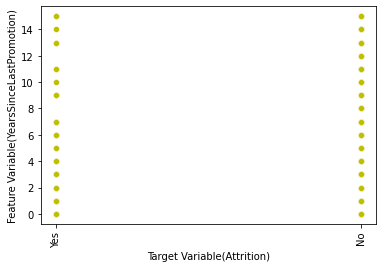



This is a Scatterplot diagram b/w attributes- Attrition & YearsWithCurrManager
AxesSubplot(0.125,0.125;0.775x0.755)


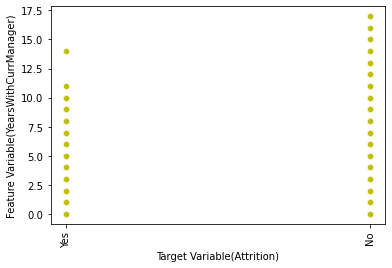

In [22]:
l=['Age','BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    print(f'This is a Scatterplot diagram b/w attributes- Attrition & {i}')
    print(sns.scatterplot(x=df.Attrition,y=df[i],color='y'))
    plt.xlabel('Target Variable(Attrition)')
    plt.ylabel(f'Feature Variable({i})')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

###### Lineplot

This is a Lineplot diagram b/w attributes- Attrition & Age
AxesSubplot(0.125,0.125;0.775x0.755)


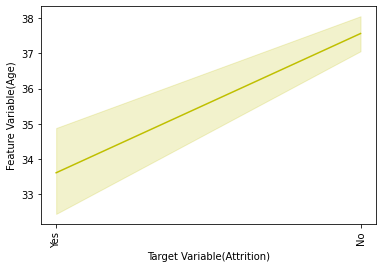



This is a Lineplot diagram b/w attributes- Attrition & BusinessTravel
AxesSubplot(0.125,0.125;0.775x0.755)


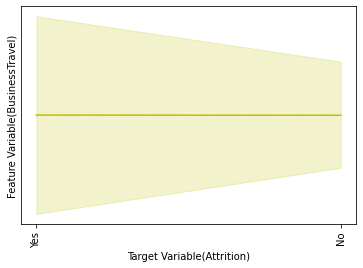



This is a Lineplot diagram b/w attributes- Attrition & Department
AxesSubplot(0.125,0.125;0.775x0.755)


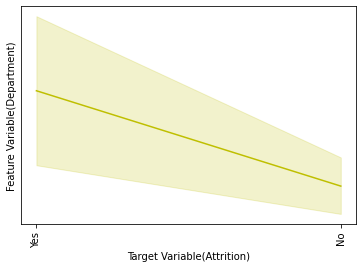



This is a Lineplot diagram b/w attributes- Attrition & DistanceFromHome
AxesSubplot(0.125,0.125;0.775x0.755)


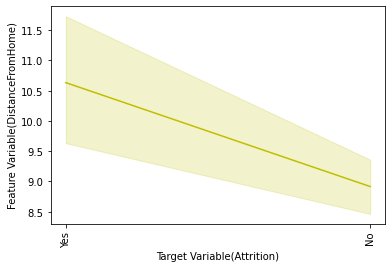



This is a Lineplot diagram b/w attributes- Attrition & Education
AxesSubplot(0.125,0.125;0.775x0.755)


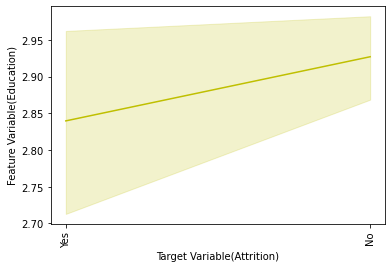



This is a Lineplot diagram b/w attributes- Attrition & EducationField
AxesSubplot(0.125,0.125;0.775x0.755)


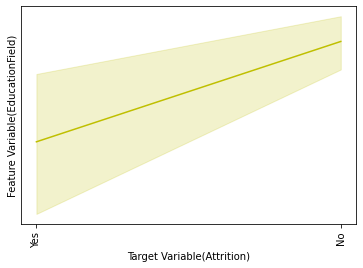



This is a Lineplot diagram b/w attributes- Attrition & EmployeeCount
AxesSubplot(0.125,0.125;0.775x0.755)


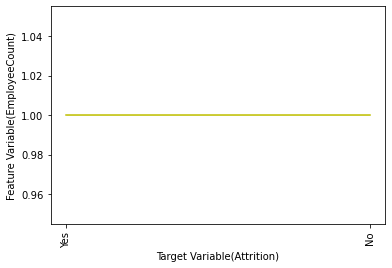



This is a Lineplot diagram b/w attributes- Attrition & EnvironmentSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


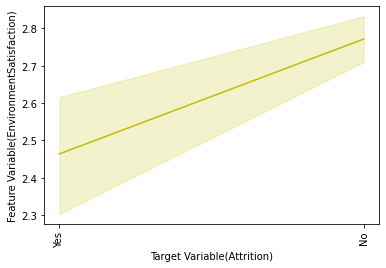



This is a Lineplot diagram b/w attributes- Attrition & Gender
AxesSubplot(0.125,0.125;0.775x0.755)


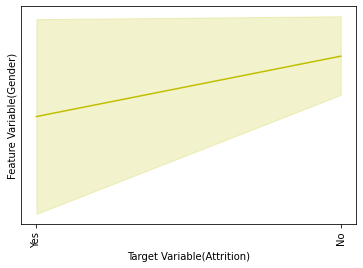



This is a Lineplot diagram b/w attributes- Attrition & HourlyRate
AxesSubplot(0.125,0.125;0.775x0.755)


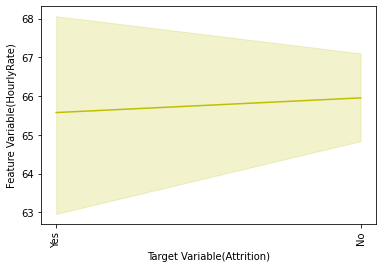



This is a Lineplot diagram b/w attributes- Attrition & JobInvolvement
AxesSubplot(0.125,0.125;0.775x0.755)


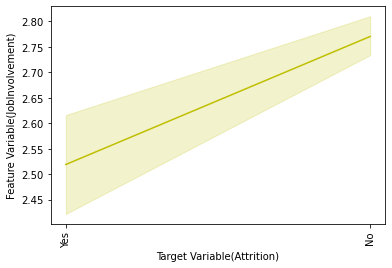



This is a Lineplot diagram b/w attributes- Attrition & JobLevel
AxesSubplot(0.125,0.125;0.775x0.755)


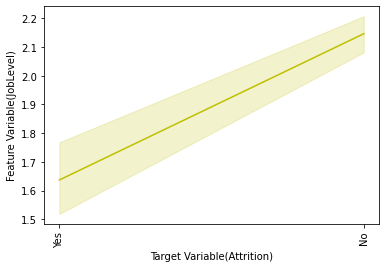



This is a Lineplot diagram b/w attributes- Attrition & JobRole
AxesSubplot(0.125,0.125;0.775x0.755)


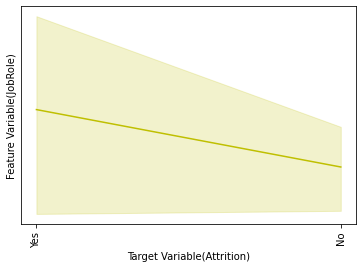



This is a Lineplot diagram b/w attributes- Attrition & JobSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


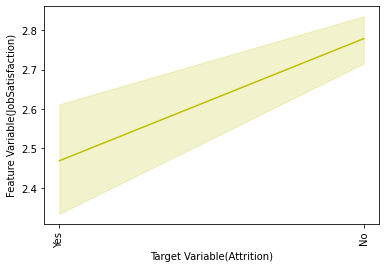



This is a Lineplot diagram b/w attributes- Attrition & MaritalStatus
AxesSubplot(0.125,0.125;0.775x0.755)


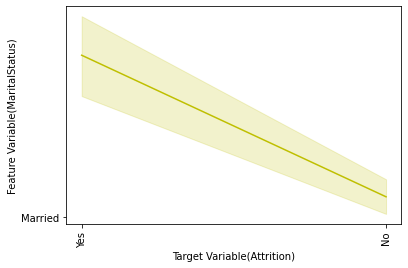



This is a Lineplot diagram b/w attributes- Attrition & NumCompaniesWorked
AxesSubplot(0.125,0.125;0.775x0.755)


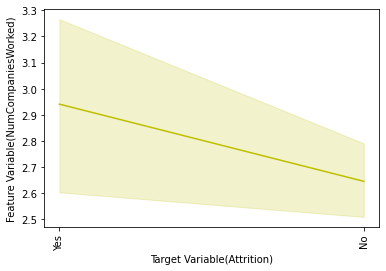



This is a Lineplot diagram b/w attributes- Attrition & Over18
AxesSubplot(0.125,0.125;0.775x0.755)


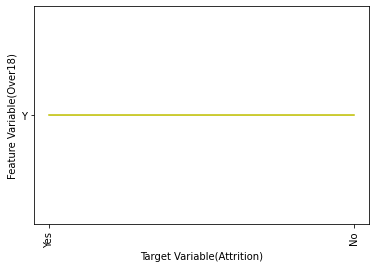



This is a Lineplot diagram b/w attributes- Attrition & OverTime
AxesSubplot(0.125,0.125;0.775x0.755)


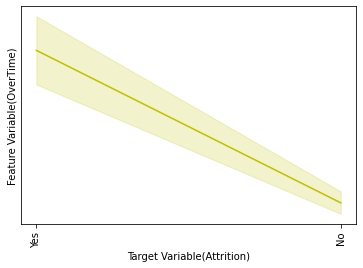



This is a Lineplot diagram b/w attributes- Attrition & PercentSalaryHike
AxesSubplot(0.125,0.125;0.775x0.755)


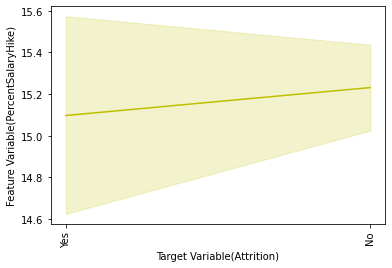



This is a Lineplot diagram b/w attributes- Attrition & PerformanceRating
AxesSubplot(0.125,0.125;0.775x0.755)


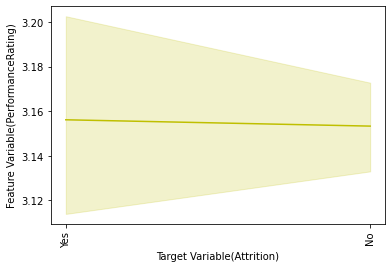



This is a Lineplot diagram b/w attributes- Attrition & RelationshipSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


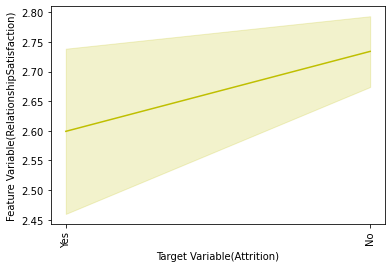



This is a Lineplot diagram b/w attributes- Attrition & StandardHours
AxesSubplot(0.125,0.125;0.775x0.755)


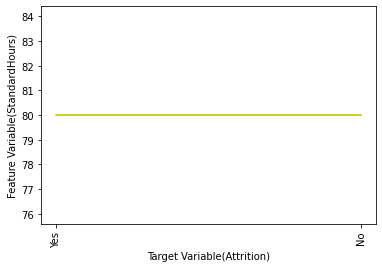



This is a Lineplot diagram b/w attributes- Attrition & StockOptionLevel
AxesSubplot(0.125,0.125;0.775x0.755)


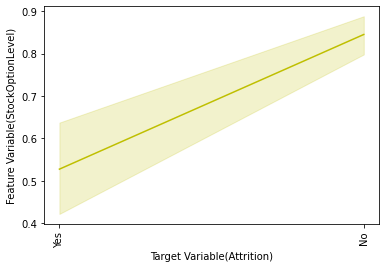



This is a Lineplot diagram b/w attributes- Attrition & TotalWorkingYears
AxesSubplot(0.125,0.125;0.775x0.755)


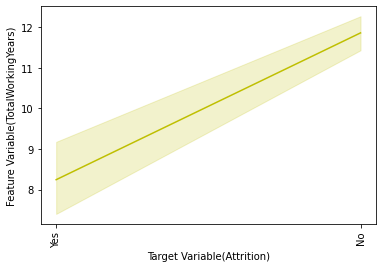



This is a Lineplot diagram b/w attributes- Attrition & TrainingTimesLastYear
AxesSubplot(0.125,0.125;0.775x0.755)


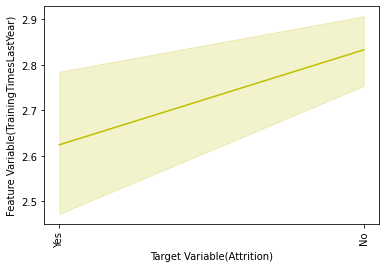



This is a Lineplot diagram b/w attributes- Attrition & WorkLifeBalance
AxesSubplot(0.125,0.125;0.775x0.755)


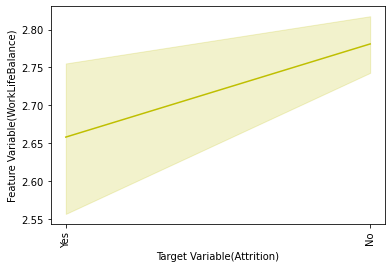



This is a Lineplot diagram b/w attributes- Attrition & YearsAtCompany
AxesSubplot(0.125,0.125;0.775x0.755)


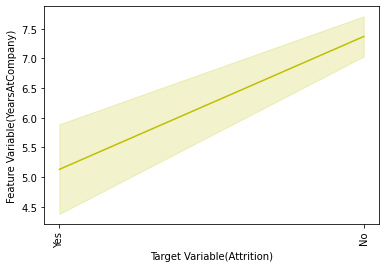



This is a Lineplot diagram b/w attributes- Attrition & YearsInCurrentRole
AxesSubplot(0.125,0.125;0.775x0.755)


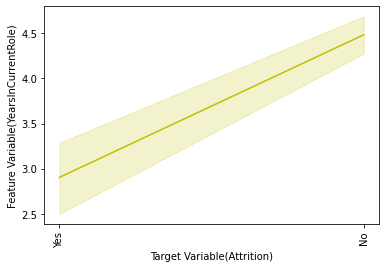



This is a Lineplot diagram b/w attributes- Attrition & YearsSinceLastPromotion
AxesSubplot(0.125,0.125;0.775x0.755)


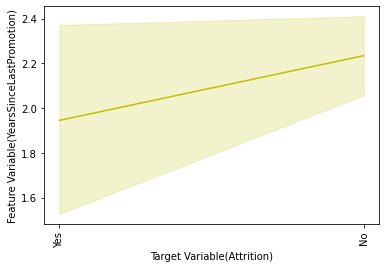



This is a Lineplot diagram b/w attributes- Attrition & YearsWithCurrManager
AxesSubplot(0.125,0.125;0.775x0.755)


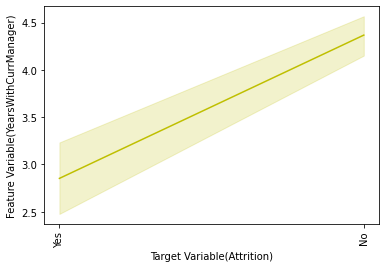

In [23]:
l=['Age','BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    print(f'This is a Lineplot diagram b/w attributes- Attrition & {i}')
    print(sns.lineplot(x=df.Attrition,y=df[i],color='y'))
    plt.xlabel('Target Variable(Attrition)')
    plt.ylabel(f'Feature Variable({i})')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

###### There is a strong positive correlation b/w Attrition and Age,Education Field,Environment Satisfaction,Job Environment,job level,years in current role,years at company,Years with current Manager

There is a positive correlation b/w Attrition and Education,Gender,Years since last promotion

There is a negative correlation b/w Attrition and Department,Distance From Home

There is a constant correlation b/w Attrition and Business Travel,Employee Count,Hourly Rate

##### Relational Plot

This is a Relational plot diagram b/w attributes- Attrition & Age


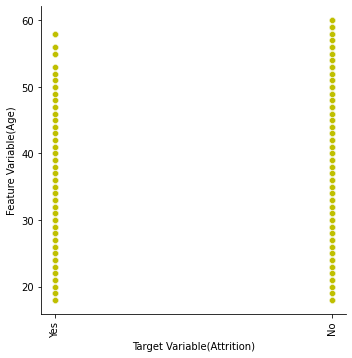



This is a Relational plot diagram b/w attributes- Attrition & BusinessTravel


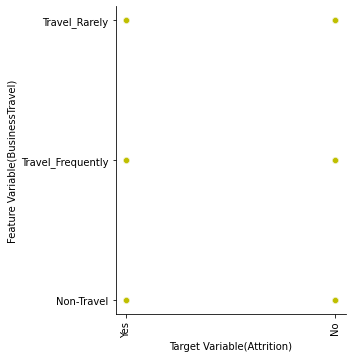



This is a Relational plot diagram b/w attributes- Attrition & Department


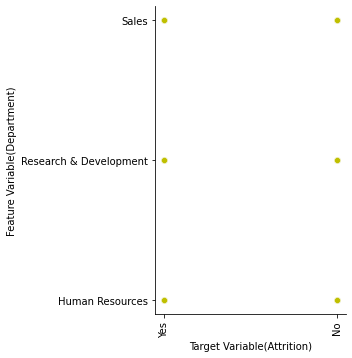



This is a Relational plot diagram b/w attributes- Attrition & DistanceFromHome


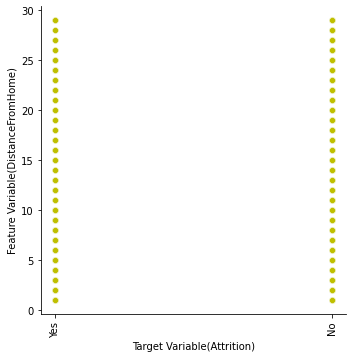



This is a Relational plot diagram b/w attributes- Attrition & Education


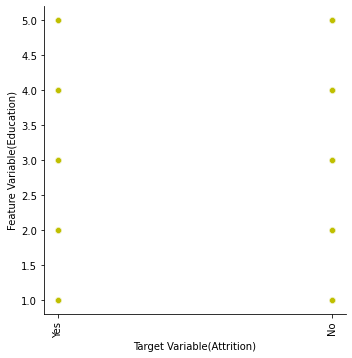



This is a Relational plot diagram b/w attributes- Attrition & EducationField


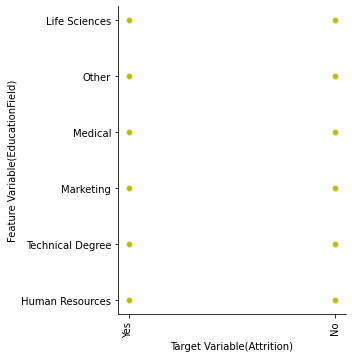



This is a Relational plot diagram b/w attributes- Attrition & EmployeeCount


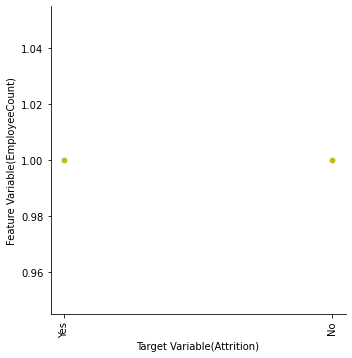



This is a Relational plot diagram b/w attributes- Attrition & EnvironmentSatisfaction


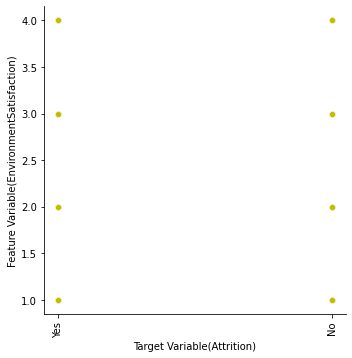



This is a Relational plot diagram b/w attributes- Attrition & Gender


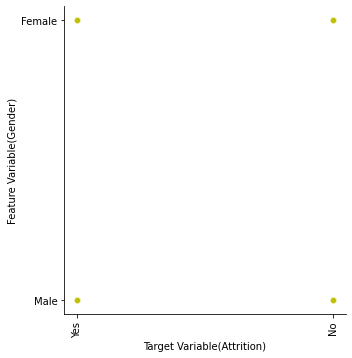



This is a Relational plot diagram b/w attributes- Attrition & HourlyRate


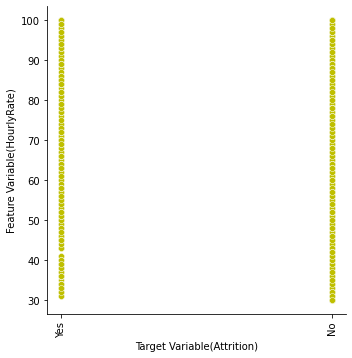



This is a Relational plot diagram b/w attributes- Attrition & JobInvolvement


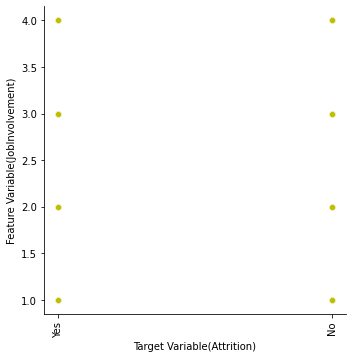



This is a Relational plot diagram b/w attributes- Attrition & JobLevel


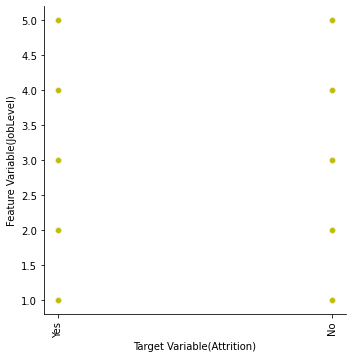



This is a Relational plot diagram b/w attributes- Attrition & JobRole


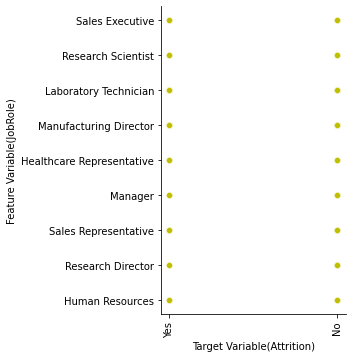



This is a Relational plot diagram b/w attributes- Attrition & JobSatisfaction


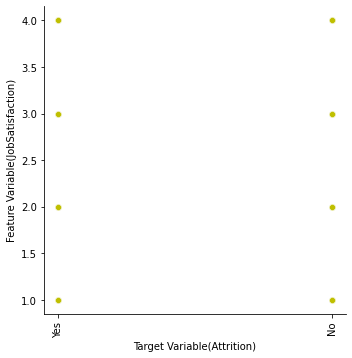



This is a Relational plot diagram b/w attributes- Attrition & MaritalStatus


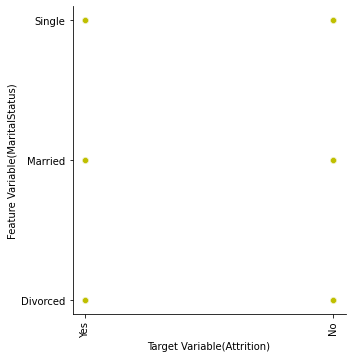



This is a Relational plot diagram b/w attributes- Attrition & NumCompaniesWorked


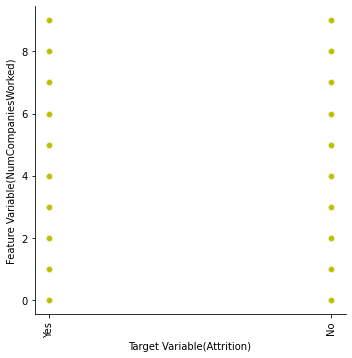



This is a Relational plot diagram b/w attributes- Attrition & Over18


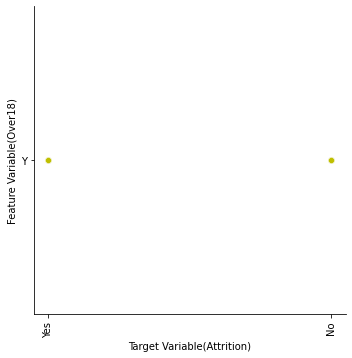



This is a Relational plot diagram b/w attributes- Attrition & OverTime


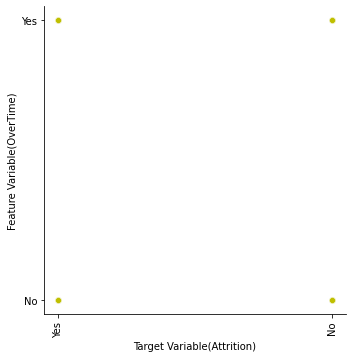



This is a Relational plot diagram b/w attributes- Attrition & PercentSalaryHike


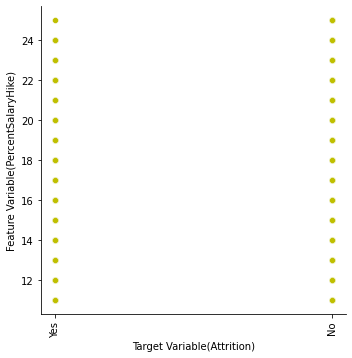



This is a Relational plot diagram b/w attributes- Attrition & PerformanceRating


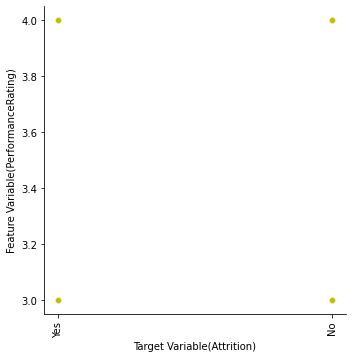



This is a Relational plot diagram b/w attributes- Attrition & RelationshipSatisfaction


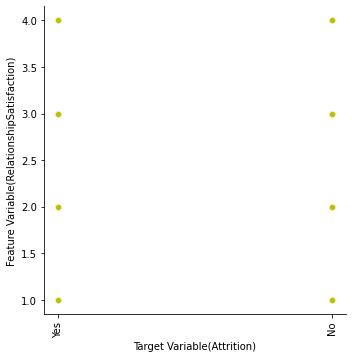



This is a Relational plot diagram b/w attributes- Attrition & StandardHours


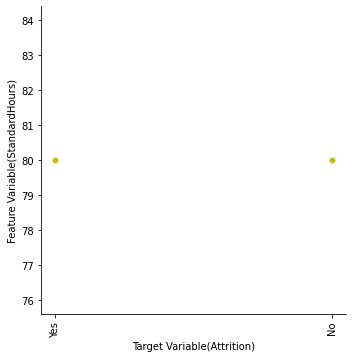



This is a Relational plot diagram b/w attributes- Attrition & StockOptionLevel


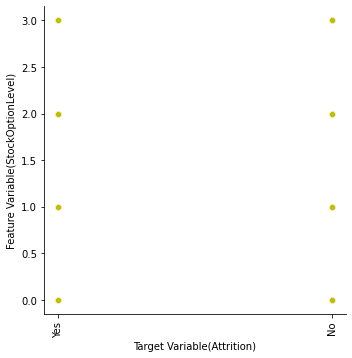



This is a Relational plot diagram b/w attributes- Attrition & TotalWorkingYears


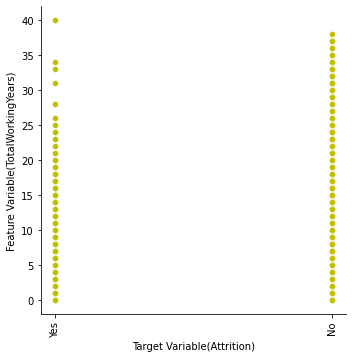



This is a Relational plot diagram b/w attributes- Attrition & TrainingTimesLastYear


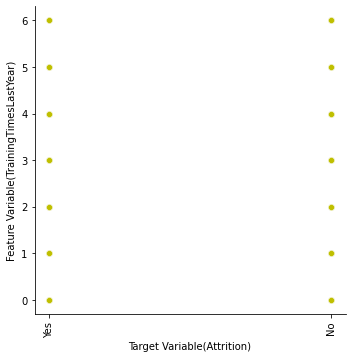



This is a Relational plot diagram b/w attributes- Attrition & WorkLifeBalance


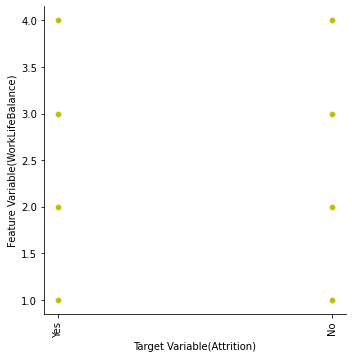



This is a Relational plot diagram b/w attributes- Attrition & YearsAtCompany


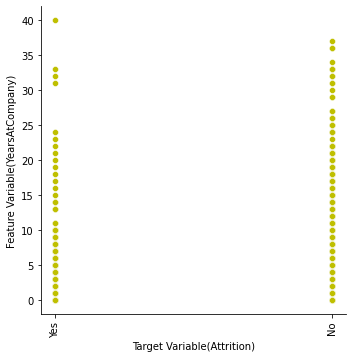



This is a Relational plot diagram b/w attributes- Attrition & YearsInCurrentRole


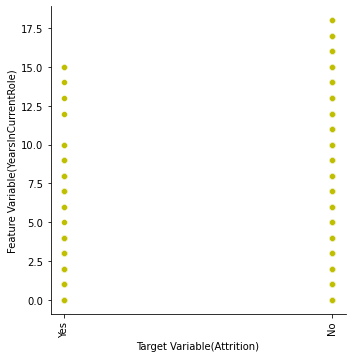



This is a Relational plot diagram b/w attributes- Attrition & YearsSinceLastPromotion


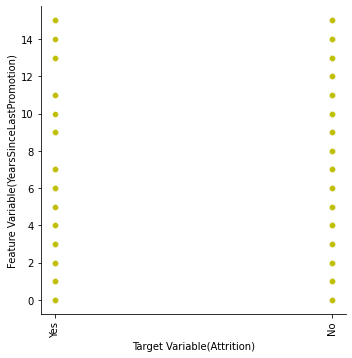



This is a Relational plot diagram b/w attributes- Attrition & YearsWithCurrManager


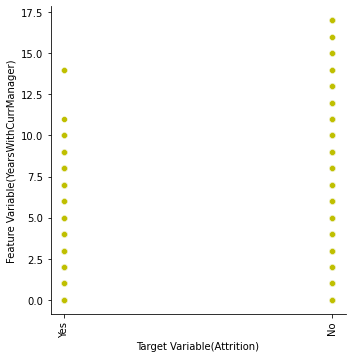

In [24]:
l=['Age','BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    print(f'This is a Relational plot diagram b/w attributes- Attrition & {i}')
    print(sns.relplot(x=df.Attrition,y=df[i],color='y'))
    plt.xlabel('Target Variable(Attrition)')
    plt.ylabel(f'Feature Variable({i})')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

###### Stripplot

This is a Stripplot diagram b/w attributes- Attrition & Age
AxesSubplot(0.125,0.125;0.775x0.755)


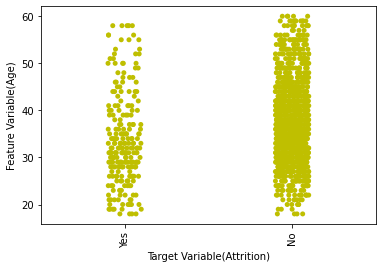



This is a Stripplot diagram b/w attributes- Attrition & BusinessTravel
AxesSubplot(0.125,0.125;0.775x0.755)


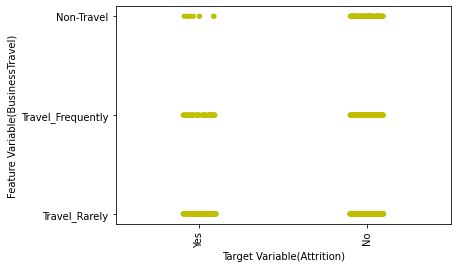



This is a Stripplot diagram b/w attributes- Attrition & Department
AxesSubplot(0.125,0.125;0.775x0.755)


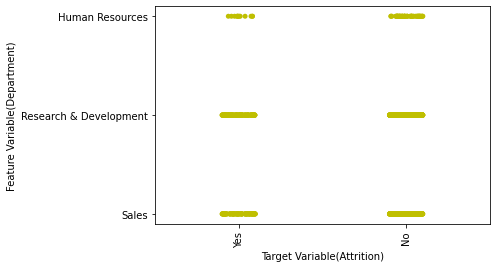



This is a Stripplot diagram b/w attributes- Attrition & DistanceFromHome
AxesSubplot(0.125,0.125;0.775x0.755)


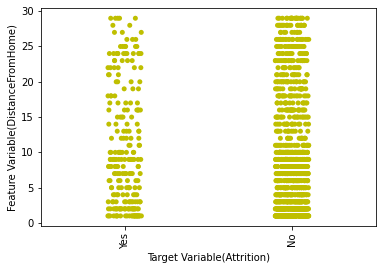



This is a Stripplot diagram b/w attributes- Attrition & Education
AxesSubplot(0.125,0.125;0.775x0.755)


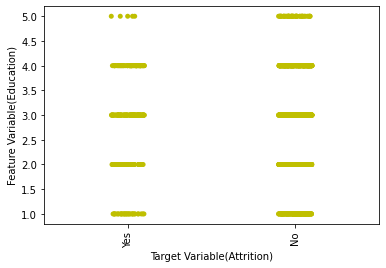



This is a Stripplot diagram b/w attributes- Attrition & EducationField
AxesSubplot(0.125,0.125;0.775x0.755)


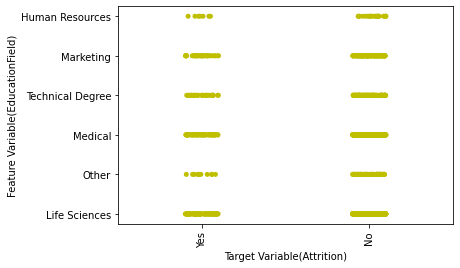



This is a Stripplot diagram b/w attributes- Attrition & EmployeeCount
AxesSubplot(0.125,0.125;0.775x0.755)


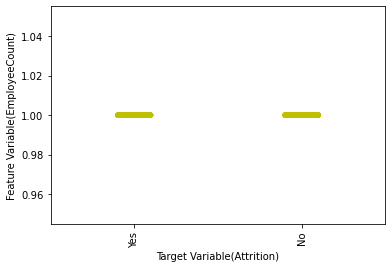



This is a Stripplot diagram b/w attributes- Attrition & EnvironmentSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


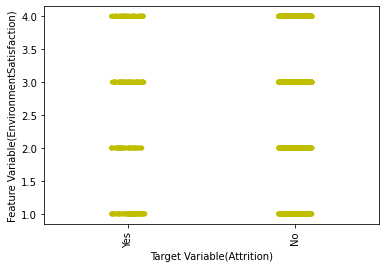



This is a Stripplot diagram b/w attributes- Attrition & Gender
AxesSubplot(0.125,0.125;0.775x0.755)


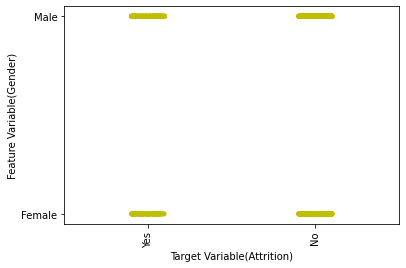



This is a Stripplot diagram b/w attributes- Attrition & HourlyRate
AxesSubplot(0.125,0.125;0.775x0.755)


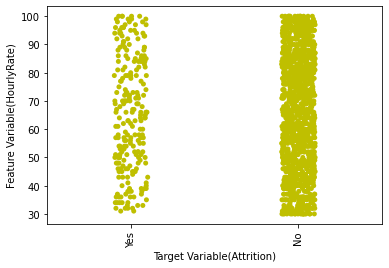



This is a Stripplot diagram b/w attributes- Attrition & JobInvolvement
AxesSubplot(0.125,0.125;0.775x0.755)


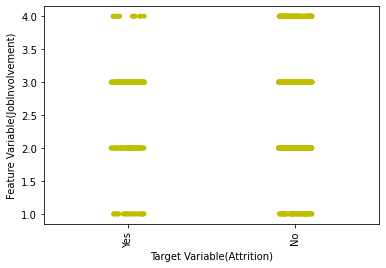



This is a Stripplot diagram b/w attributes- Attrition & JobLevel
AxesSubplot(0.125,0.125;0.775x0.755)


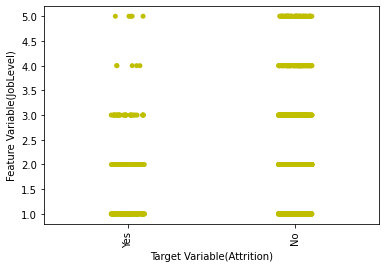



This is a Stripplot diagram b/w attributes- Attrition & JobRole
AxesSubplot(0.125,0.125;0.775x0.755)


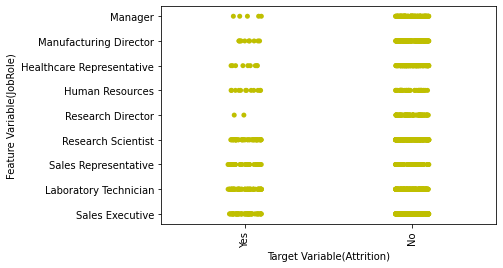



This is a Stripplot diagram b/w attributes- Attrition & JobSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


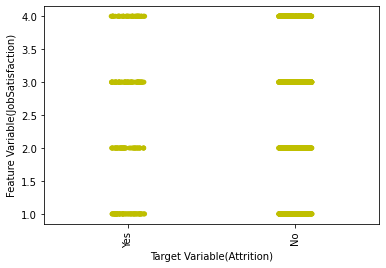



This is a Stripplot diagram b/w attributes- Attrition & MaritalStatus
AxesSubplot(0.125,0.125;0.775x0.755)


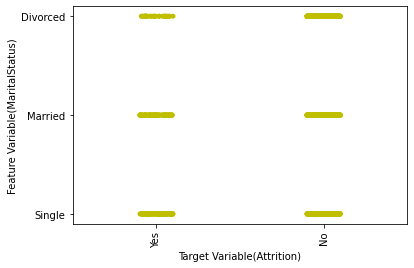



This is a Stripplot diagram b/w attributes- Attrition & NumCompaniesWorked
AxesSubplot(0.125,0.125;0.775x0.755)


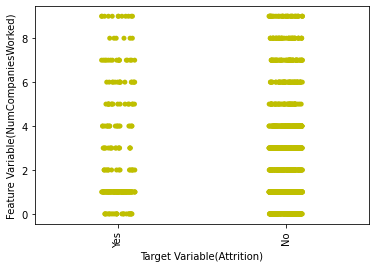



This is a Stripplot diagram b/w attributes- Attrition & Over18
AxesSubplot(0.125,0.125;0.775x0.755)


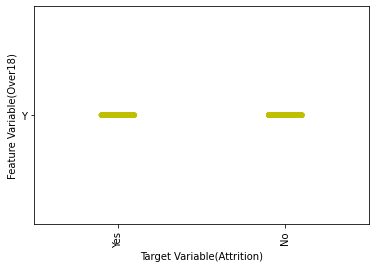



This is a Stripplot diagram b/w attributes- Attrition & OverTime
AxesSubplot(0.125,0.125;0.775x0.755)


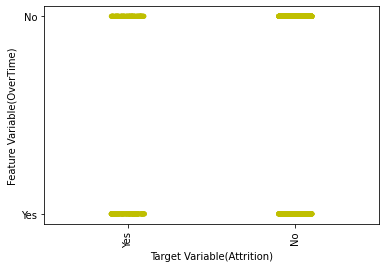



This is a Stripplot diagram b/w attributes- Attrition & PercentSalaryHike
AxesSubplot(0.125,0.125;0.775x0.755)


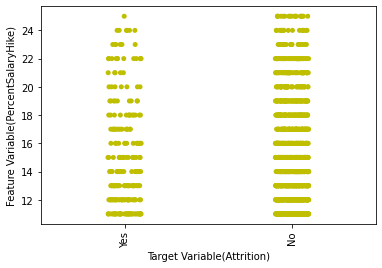



This is a Stripplot diagram b/w attributes- Attrition & PerformanceRating
AxesSubplot(0.125,0.125;0.775x0.755)


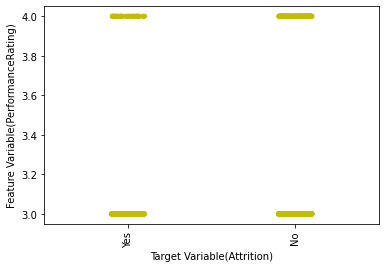



This is a Stripplot diagram b/w attributes- Attrition & RelationshipSatisfaction
AxesSubplot(0.125,0.125;0.775x0.755)


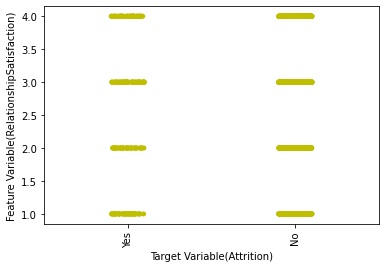



This is a Stripplot diagram b/w attributes- Attrition & StandardHours
AxesSubplot(0.125,0.125;0.775x0.755)


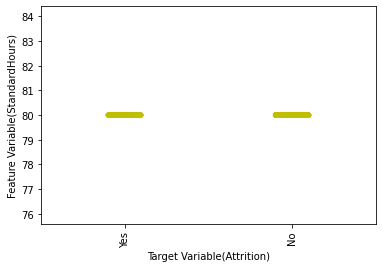



This is a Stripplot diagram b/w attributes- Attrition & StockOptionLevel
AxesSubplot(0.125,0.125;0.775x0.755)


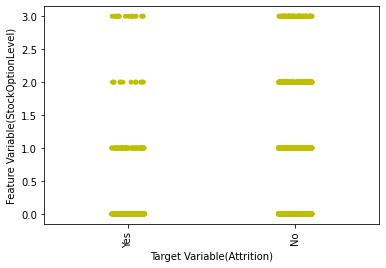



This is a Stripplot diagram b/w attributes- Attrition & TotalWorkingYears
AxesSubplot(0.125,0.125;0.775x0.755)


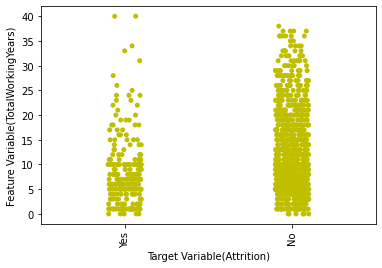



This is a Stripplot diagram b/w attributes- Attrition & TrainingTimesLastYear
AxesSubplot(0.125,0.125;0.775x0.755)


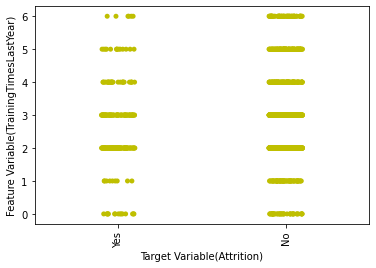



This is a Stripplot diagram b/w attributes- Attrition & WorkLifeBalance
AxesSubplot(0.125,0.125;0.775x0.755)


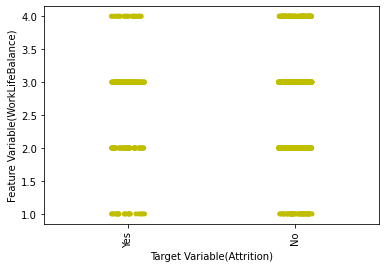



This is a Stripplot diagram b/w attributes- Attrition & YearsAtCompany
AxesSubplot(0.125,0.125;0.775x0.755)


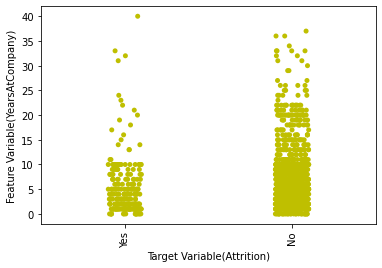



This is a Stripplot diagram b/w attributes- Attrition & YearsInCurrentRole
AxesSubplot(0.125,0.125;0.775x0.755)


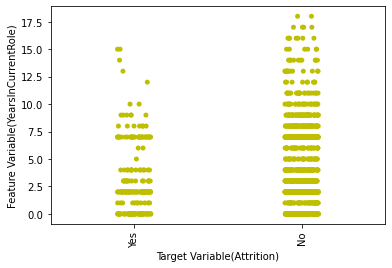



This is a Stripplot diagram b/w attributes- Attrition & YearsSinceLastPromotion
AxesSubplot(0.125,0.125;0.775x0.755)


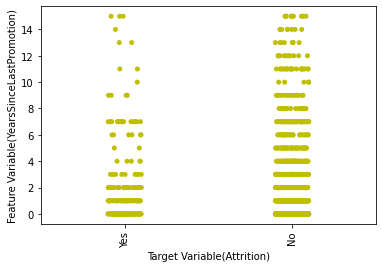



This is a Stripplot diagram b/w attributes- Attrition & YearsWithCurrManager
AxesSubplot(0.125,0.125;0.775x0.755)


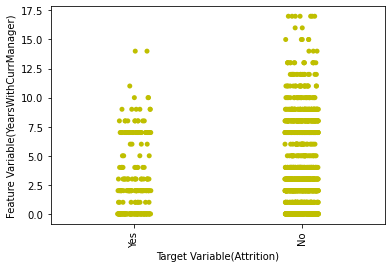

In [25]:
l=['Age','BusinessTravel', 'Department','DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount','EnvironmentSatisfaction', 'Gender', 'HourlyRate','JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction','MaritalStatus', 'NumCompaniesWorked','Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating','RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel','TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance','YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']
for i in l:
    print(f'This is a Stripplot diagram b/w attributes- Attrition & {i}')
    print(sns.stripplot(x=df.Attrition,y=df[i],color='y'))
    plt.xlabel('Target Variable(Attrition)')
    plt.ylabel(f'Feature Variable({i})')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

##### 8.Categorical Plot
Categorical Columns = Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime

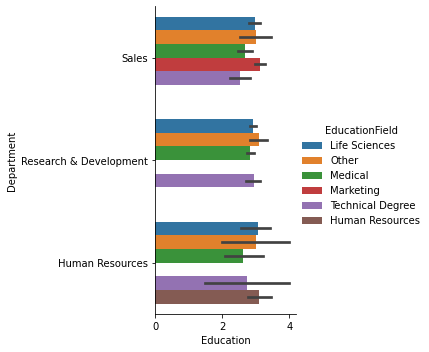

In [26]:
sns.catplot(x='Education',y='Department',hue='EducationField',kind='bar',data=df)
plt.show()

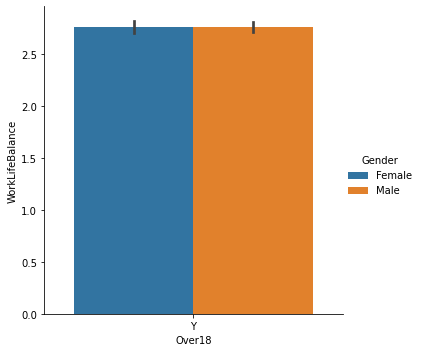

In [27]:
sns.catplot(x='Over18',y='WorkLifeBalance',hue='Gender',kind='bar',data=df)
plt.show()

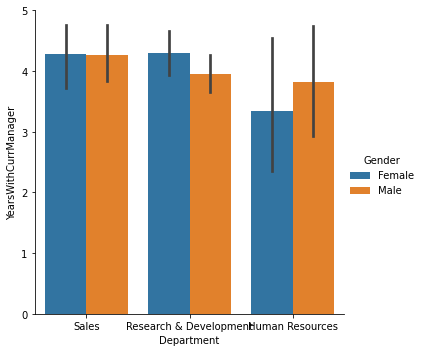

In [28]:
sns.catplot(x='Department',y='YearsWithCurrManager',hue='Gender',kind='bar',data=df)
plt.show()

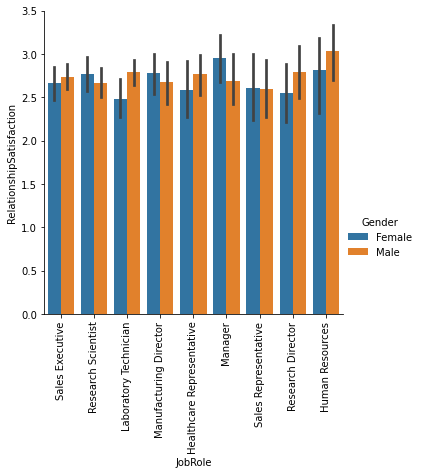

In [29]:
sns.catplot(x='JobRole',y='RelationshipSatisfaction',hue='Gender',kind='bar',data=df)
plt.xticks(rotation=90)
plt.show()

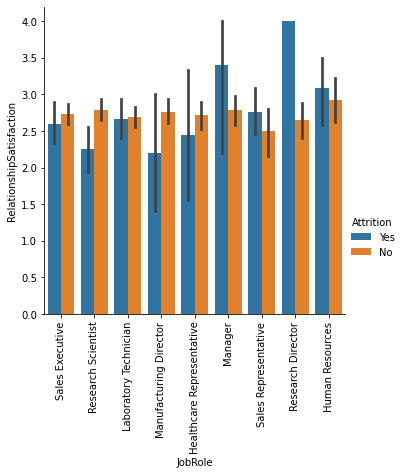

In [30]:
sns.catplot(x='JobRole',y='RelationshipSatisfaction',hue='Attrition',kind='bar',data=df)
plt.xticks(rotation=90)
plt.show()

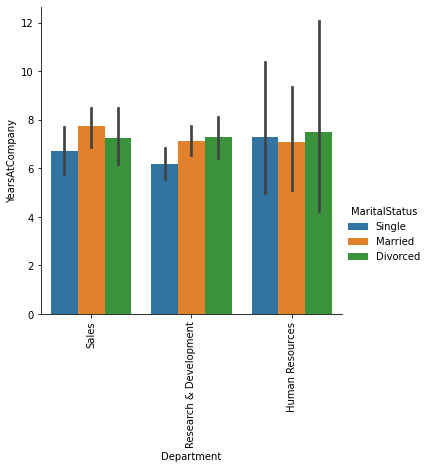

In [31]:
sns.catplot(x='Department',y='YearsAtCompany',hue='MaritalStatus',kind='bar',data=df)
plt.xticks(rotation=90)
plt.show()

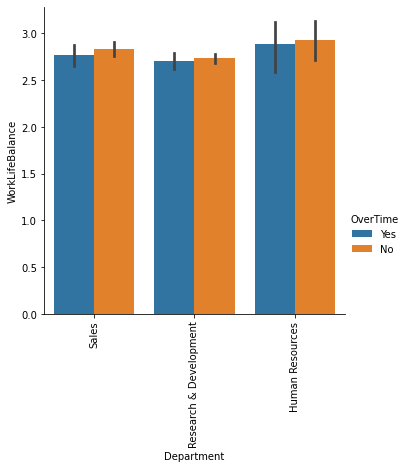

In [32]:
sns.catplot(x='Department',y='WorkLifeBalance',hue='OverTime',kind='bar',data=df)
plt.xticks(rotation=90)
plt.show()

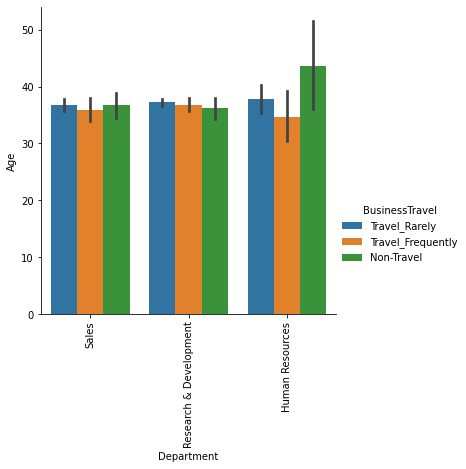

In [33]:
sns.catplot(x='Department',y='Age',hue='BusinessTravel',kind='bar',data=df)
plt.xticks(rotation=90)
plt.show()

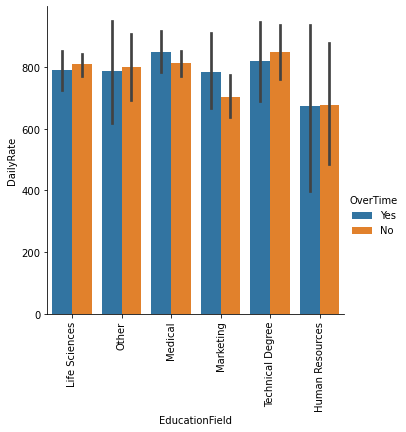

In [34]:
sns.catplot(x='EducationField',y='DailyRate',hue='OverTime',kind='bar',data=df)
plt.xticks(rotation=90)
plt.show()


###### Pairplot

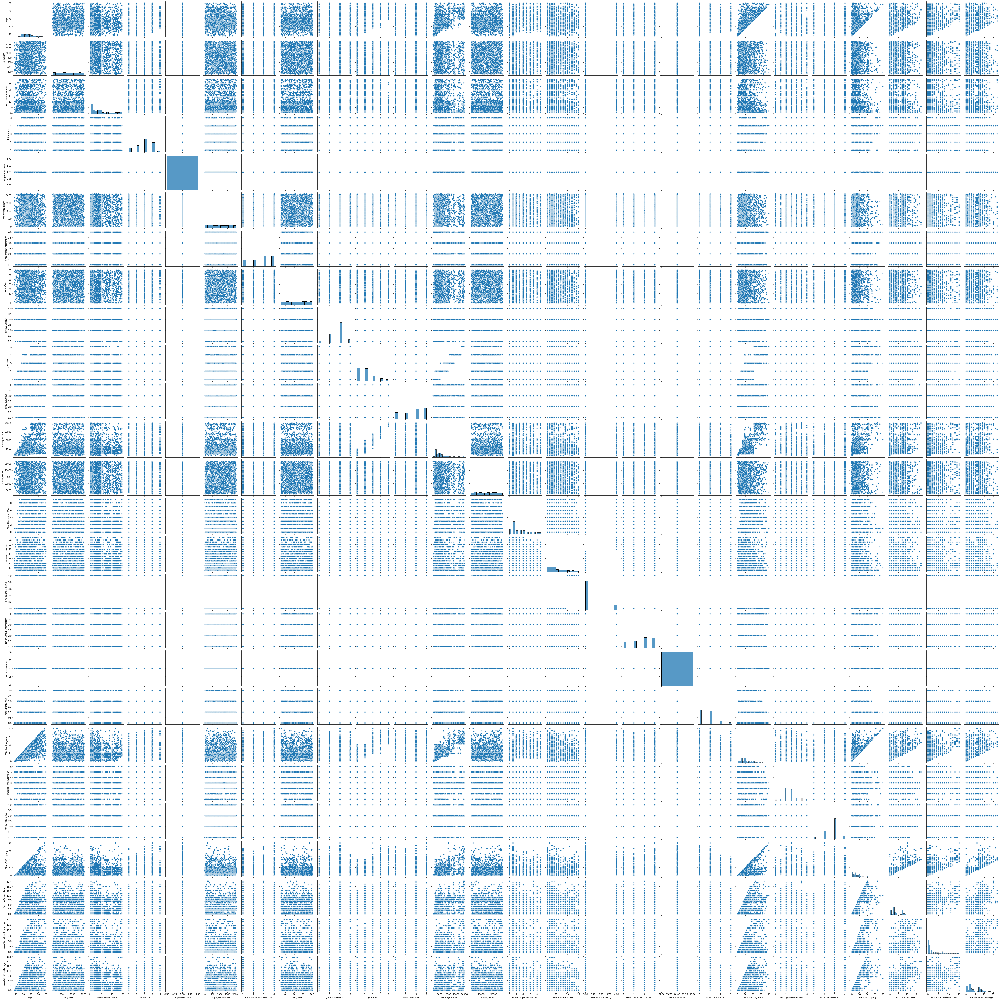

In [35]:
sns.pairplot(df)

##### Encoding
Now I'll convert all the categorical columns into numeric one by applying label encoder technique

##### Label Encoder

In [36]:
import sklearn
from sklearn.preprocessing import LabelEncoder

In [37]:
#l is the list of all the categorical columns
l=['Attrition','BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus','Over18','OverTime']
for i in l:
    df[i]=LabelEncoder().fit_transform(df[i].astype(str))

In [38]:
#Encoded dataframe
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,1,2065,...,4,80,0,17,3,2,9,6,0,8


In [39]:
#replaced all the zeros values of each column to their respective mean
l=['YearsWithCurrManager','YearsSinceLastPromotion','YearsInCurrentRole','YearsAtCompany','TrainingTimesLastYear','TotalWorkingYears','StockOptionLevel','NumCompaniesWorked']
for i in l:
    a=df[i].mean()
    df[i]=df[i].replace(0,a)

In [40]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,1,...,1,80,0.793878,8.0,2.79932,1,6.000000,4.000000,2.187755,5.000000
1,49,0,1,279,1,8,1,1,1,2,...,4,80,1.000000,10.0,3.00000,3,10.000000,7.000000,1.000000,7.000000
2,37,1,2,1373,1,2,2,4,1,4,...,2,80,0.793878,7.0,3.00000,3,7.008163,4.229252,2.187755,4.123129
3,33,0,1,1392,1,3,4,1,1,5,...,3,80,0.793878,8.0,3.00000,3,8.000000,7.000000,3.000000,4.123129
4,27,0,2,591,1,2,1,3,1,7,...,4,80,1.000000,6.0,3.00000,3,2.000000,2.000000,2.000000,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,1,2061,...,3,80,1.000000,17.0,3.00000,3,5.000000,2.000000,2.187755,3.000000
1466,39,0,2,613,1,6,1,3,1,2062,...,1,80,1.000000,9.0,5.00000,3,7.000000,7.000000,1.000000,7.000000
1467,27,0,2,155,1,4,3,1,1,2064,...,2,80,1.000000,6.0,2.79932,3,6.000000,2.000000,2.187755,3.000000
1468,49,0,1,1023,2,2,3,3,1,2065,...,4,80,0.793878,17.0,3.00000,2,9.000000,6.000000,2.187755,8.000000


In [41]:
#will delete this column as each entry are same and which might not be that meaningful
df.EmployeeCount

0       1
1       1
2       1
3       1
4       1
       ..
1465    1
1466    1
1467    1
1468    1
1469    1
Name: EmployeeCount, Length: 1470, dtype: int64

In [42]:
#will delete this column as each entry are same and which might not be that meaningful
df.Over18

0       0
1       0
2       0
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Over18, Length: 1470, dtype: int32

In [43]:
#will delete this column as each entry are same and which might not be that meaningful
df.StandardHours

0       80
1       80
2       80
3       80
4       80
        ..
1465    80
1466    80
1467    80
1468    80
1469    80
Name: StandardHours, Length: 1470, dtype: int64

In [44]:
df.drop(['EmployeeCount','Over18','StandardHours'],axis=1,inplace=True)

In [45]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.000000,30.000000,36.000000,43.00,60.0
Attrition,1470.0,0.161224,0.367863,0.000000,0.000000,0.000000,0.00,1.0
BusinessTravel,1470.0,1.607483,0.665455,0.000000,1.000000,2.000000,2.00,2.0
DailyRate,1470.0,802.485714,403.509100,102.000000,465.000000,802.000000,1157.00,1499.0
Department,1470.0,1.260544,0.527792,0.000000,1.000000,1.000000,2.00,2.0
DistanceFromHome,1470.0,9.192517,8.106864,1.000000,2.000000,7.000000,14.00,29.0
Education,1470.0,2.912925,1.024165,1.000000,2.000000,3.000000,4.00,5.0
EducationField,1470.0,2.247619,1.331369,0.000000,1.000000,2.000000,3.00,5.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.000000,491.250000,1020.500000,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.000000,2.000000,3.000000,4.00,4.0


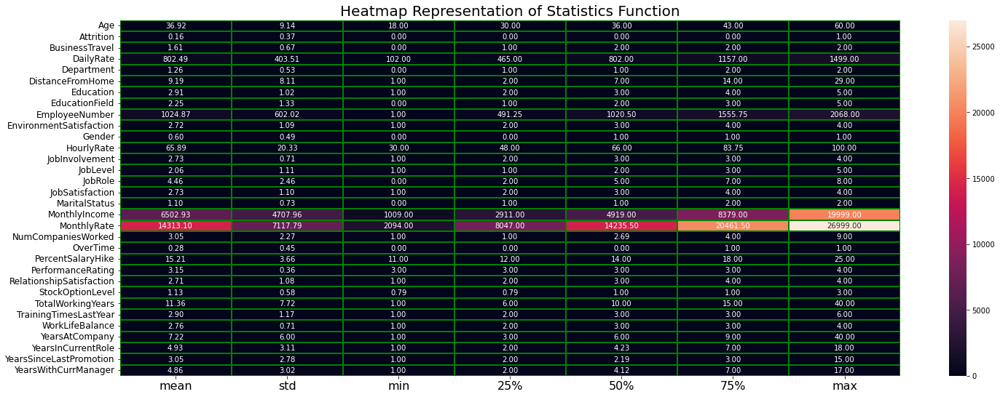

In [46]:
plt.figure(figsize=(24,9))
sns.heatmap(df.describe()[1:].T,annot=True,linecolor='green',linewidth='0.1',fmt='0.2f')
plt.yticks(rotation=0,fontsize=12)
plt.xticks(rotation=0,fontsize=16)
plt.title('Heatmap Representation of Statistics Function',fontsize=20)
plt.show()

###### Correlation

In [47]:
df.corr()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,-0.010145,0.010146,...,0.001904,0.053535,-0.003520,0.664588,-0.021821,-0.021490,0.295979,0.202178,0.207105,0.195796
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,-0.010577,-0.103369,...,0.002889,-0.045872,-0.068815,-0.163711,-0.037748,-0.063939,-0.117945,-0.102374,-0.014481,-0.076831
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,-0.015578,0.004174,...,-0.026341,-0.035986,-0.015162,0.023016,0.009950,-0.011256,-0.024111,-0.002581,-0.028853,-0.033361
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,-0.050990,0.018355,...,0.000473,0.007846,0.037203,0.010972,-0.008637,-0.037848,-0.037522,0.002130,-0.024574,-0.051878
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.010895,-0.019395,...,-0.024604,-0.022414,-0.008000,-0.013751,0.028131,0.026383,0.031735,0.064633,0.049054,0.043051
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,0.032916,-0.016075,...,0.027110,0.006557,0.046142,0.003179,-0.039659,-0.026556,0.006620,0.010657,0.006540,0.019904
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,0.042070,-0.027128,...,-0.024539,-0.009118,0.018750,0.143601,-0.026594,0.009819,0.068093,0.051439,0.062093,0.069626
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,-0.002516,0.043163,...,-0.005614,-0.004378,-0.011307,-0.029359,0.047732,0.041191,-0.017227,-0.031319,-0.002077,-0.023086
EmployeeNumber,-0.010145,-0.010577,-0.015578,-0.050990,-0.010895,0.032916,0.042070,-0.002516,1.000000,0.017621,...,-0.020359,-0.069861,0.058975,-0.017451,0.025234,0.010309,-0.013418,-0.019031,-0.019444,-0.018738
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,0.017621,1.000000,...,-0.029548,0.007665,-0.010630,0.000071,-0.012380,0.027627,0.003846,0.023436,0.003894,-0.004052


In [48]:
df.corr().Attrition.sort_values()

JobLevel                   -0.169105
TotalWorkingYears          -0.163711
MonthlyIncome              -0.159840
Age                        -0.159205
JobInvolvement             -0.130016
YearsAtCompany             -0.117945
JobSatisfaction            -0.103481
EnvironmentSatisfaction    -0.103369
YearsInCurrentRole         -0.102374
YearsWithCurrManager       -0.076831
StockOptionLevel           -0.068815
WorkLifeBalance            -0.063939
DailyRate                  -0.056652
RelationshipSatisfaction   -0.045872
TrainingTimesLastYear      -0.037748
Education                  -0.031373
YearsSinceLastPromotion    -0.014481
PercentSalaryHike          -0.013478
EmployeeNumber             -0.010577
HourlyRate                 -0.006846
BusinessTravel              0.000074
PerformanceRating           0.002889
MonthlyRate                 0.015170
EducationField              0.026846
NumCompaniesWorked          0.028671
Gender                      0.029453
Department                  0.063991
J

###### See, there are 20 attributes having negative values and its showing us that there is negative correlation b/w attrition (which is our target variable) and other respective Negative attributes.Hence will remove all the negative correlated columns later in data cleaning phase.Negative correlation means if input is +ve then output is -ve and vice-versa whereas, Positive correlation means if input is +ve then output would also be +ve and vice-versa. Also we'll not remove any categorical columns in this process
The attributes those are giving negative correlation are given below---'JobLevel','TotalWorkingYears','MonthlyIncome','Age','JobInvolvement','YearsAtCompany','JobSatisfaction','EnvironmentSatisfaction', 'YearsInCurrentRole','YearsWithCurrManager','StockOptionLevel','WorkLifeBalance','DailyRate','RelationshipSatisfaction', 'TrainingTimesLastYear','Education','YearsSinceLastPromotion','PercentSalaryHike','EmployeeNumber','HourlyRate'

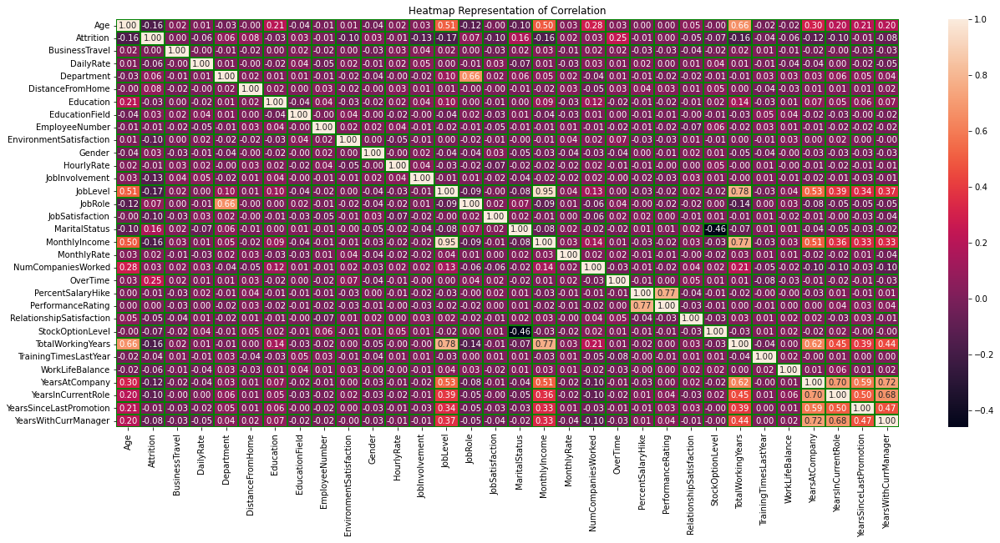

In [49]:
plt.figure(figsize=(21,9))
sns.heatmap(df.corr(),annot=True,linecolor='g',linewidth='0.1',fmt='0.2f')
plt.xticks(rotation=90)
plt.title('Heatmap Representation of Correlation')
plt.show()

###### Multicollinearity

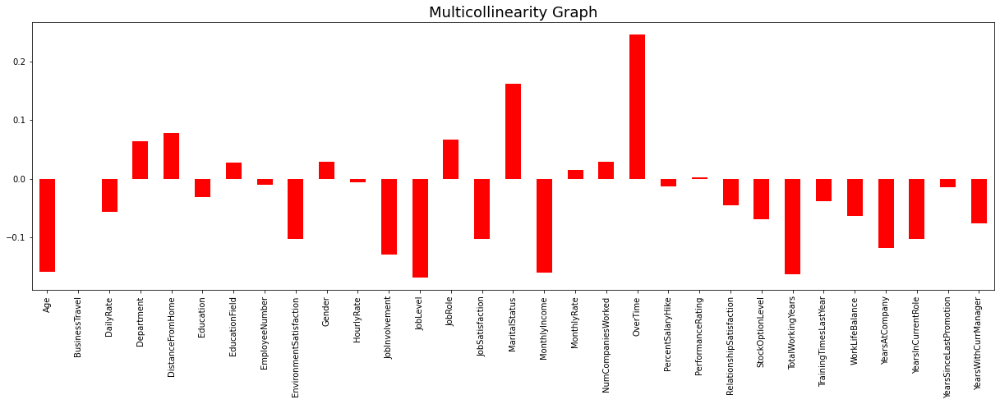

In [50]:
plt.figure(figsize=(21,6))
df.corr().Attrition.drop(['Attrition']).plot(kind='bar',color='r')
plt.xticks(rotation=90)
plt.title('Multicollinearity Graph',fontsize=18)
plt.show()


###### Skewness

In [51]:
df.skew().sort_values()

BusinessTravel             -1.439006
WorkLifeBalance            -0.552480
JobInvolvement             -0.498419
Gender                     -0.408665
JobRole                    -0.357270
JobSatisfaction            -0.329672
EnvironmentSatisfaction    -0.321654
RelationshipSatisfaction   -0.302828
Education                  -0.289681
MaritalStatus              -0.152175
HourlyRate                 -0.032311
DailyRate                  -0.003519
EmployeeNumber              0.016574
MonthlyRate                 0.018578
Department                  0.172231
Age                         0.413286
EducationField              0.550371
PercentSalaryHike           0.821128
DistanceFromHome            0.958118
OverTime                    0.964489
TrainingTimesLastYear       0.986323
JobLevel                    1.025401
YearsWithCurrManager        1.076522
NumCompaniesWorked          1.117129
TotalWorkingYears           1.134824
YearsInCurrentRole          1.181451
MonthlyIncome               1.369817
Y

#### Distributionplot

The Distribution Plot for attribute-BusinessTravel is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


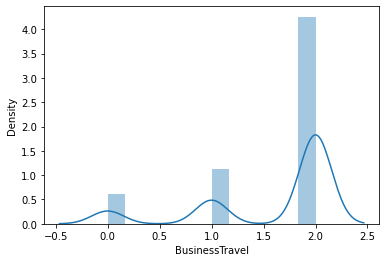



The Distribution Plot for attribute-WorkLifeBalance is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


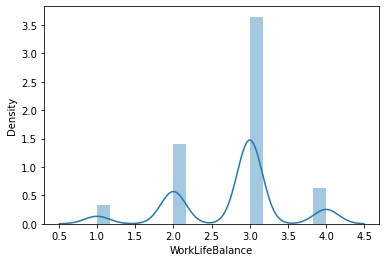



The Distribution Plot for attribute-EducationField is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


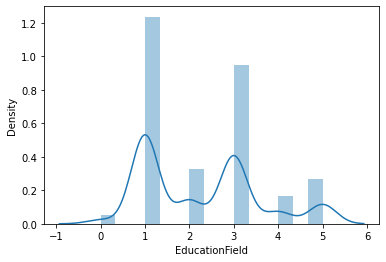



The Distribution Plot for attribute-PercentSalaryHike is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


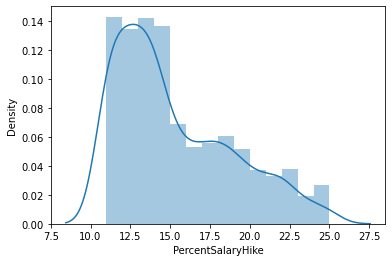



The Distribution Plot for attribute-DistanceFromHome is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


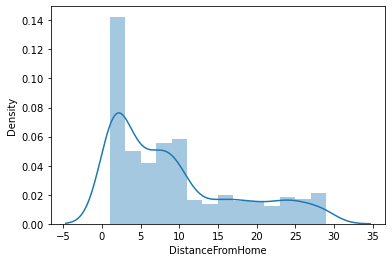



The Distribution Plot for attribute-OverTime is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


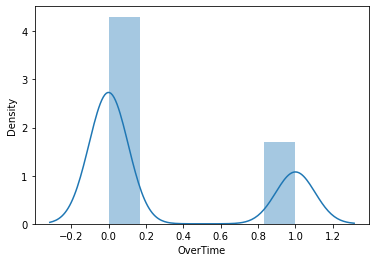



The Distribution Plot for attribute-TrainingTimesLastYear is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


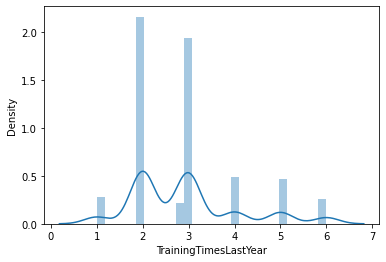



The Distribution Plot for attribute-JobLevel is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


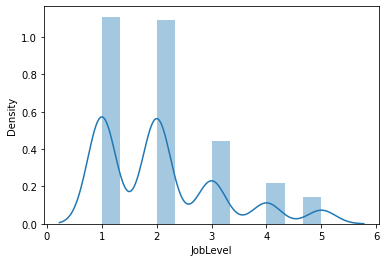



The Distribution Plot for attribute-YearsWithCurrManager is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


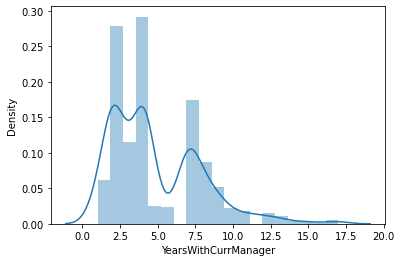



The Distribution Plot for attribute-NumCompaniesWorked is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


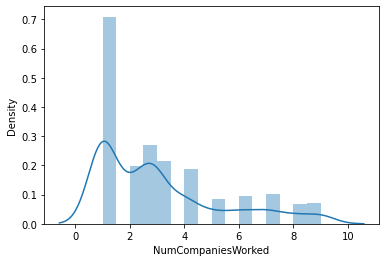



The Distribution Plot for attribute-TotalWorkingYears is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


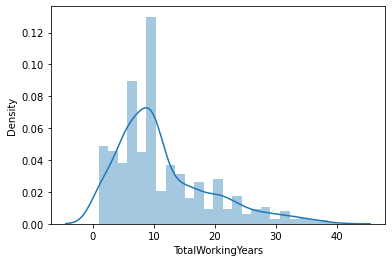



The Distribution Plot for attribute-YearsInCurrentRole is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


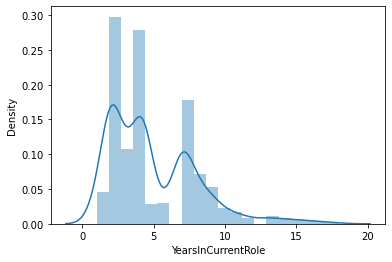



The Distribution Plot for attribute-MonthlyIncome is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


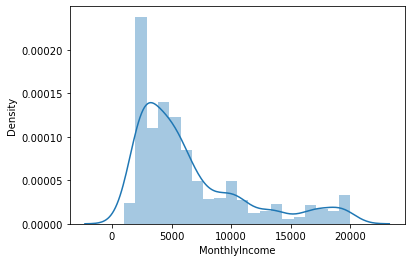



The Distribution Plot for attribute-YearsAtCompany is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


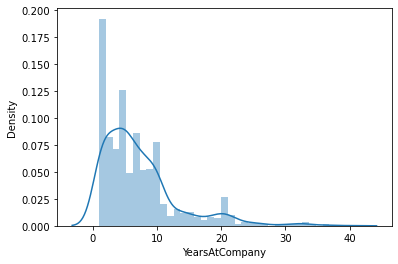



The Distribution Plot for attribute-PerformanceRating is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


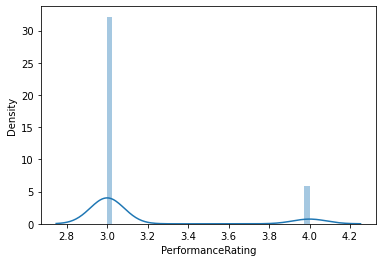



The Distribution Plot for attribute-StockOptionLevel is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


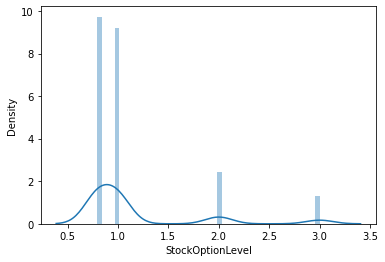



The Distribution Plot for attribute-YearsSinceLastPromotion is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


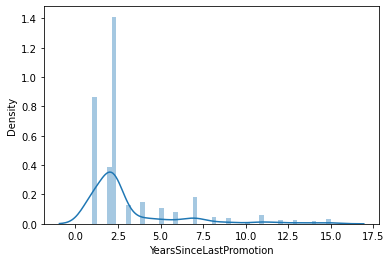



The Distribution Plot for attribute-Attrition is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


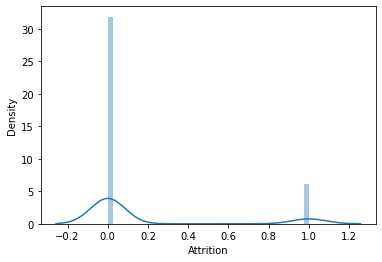

In [52]:
l=['BusinessTravel','WorkLifeBalance','EducationField','PercentSalaryHike','DistanceFromHome','OverTime','TrainingTimesLastYear','JobLevel','YearsWithCurrManager','NumCompaniesWorked','TotalWorkingYears','YearsInCurrentRole','MonthlyIncome','YearsAtCompany','PerformanceRating','StockOptionLevel','YearsSinceLastPromotion','Attrition']
for i in l:
    print(f'The Distribution Plot for attribute-{i} is given below..')
    print(sns.distplot(df[i]))
    plt.show()
    print('\n')

###### Outliers
Boxplots To check the Outliers

The BoxPlot Diagram for attribute-BusinessTravel is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


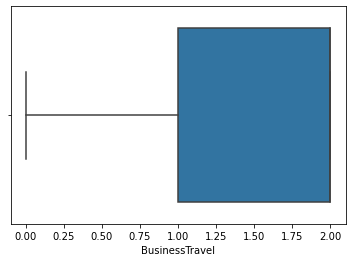



The BoxPlot Diagram for attribute-WorkLifeBalance is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


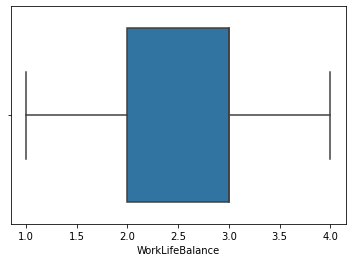



The BoxPlot Diagram for attribute-EducationField is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


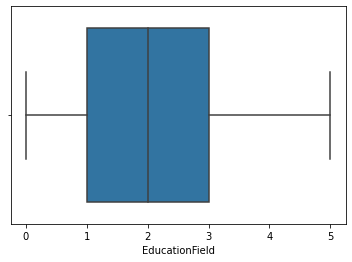



The BoxPlot Diagram for attribute-PercentSalaryHike is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


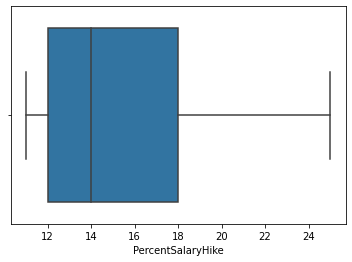



The BoxPlot Diagram for attribute-DistanceFromHome is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


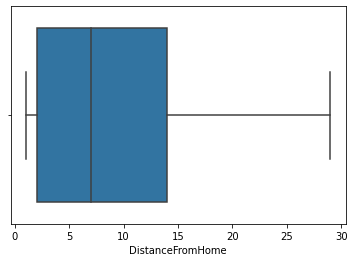



The BoxPlot Diagram for attribute-OverTime is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


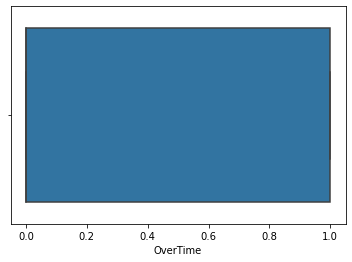



The BoxPlot Diagram for attribute-TrainingTimesLastYear is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


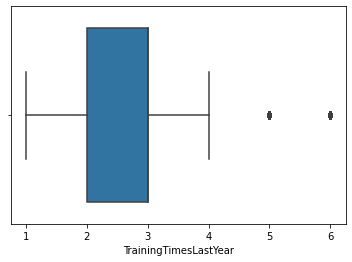



The BoxPlot Diagram for attribute-JobLevel is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


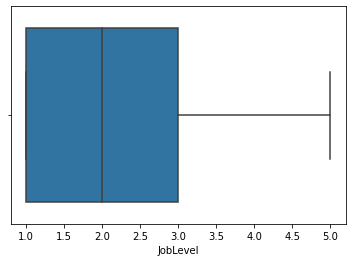



The BoxPlot Diagram for attribute-YearsWithCurrManager is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


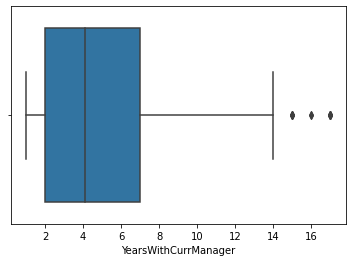



The BoxPlot Diagram for attribute-NumCompaniesWorked is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


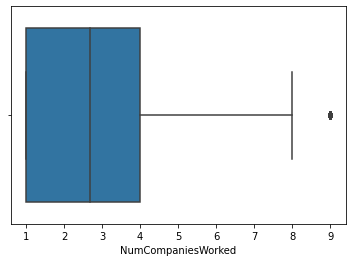



The BoxPlot Diagram for attribute-TotalWorkingYears is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


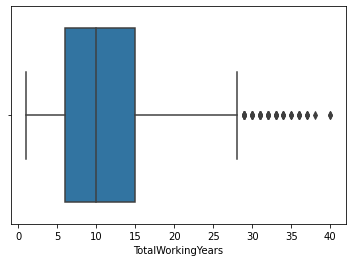



The BoxPlot Diagram for attribute-YearsInCurrentRole is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


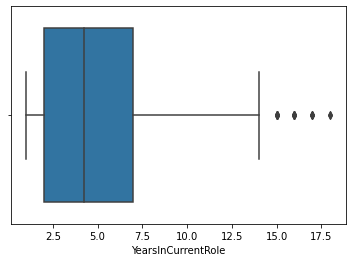



The BoxPlot Diagram for attribute-MonthlyIncome is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


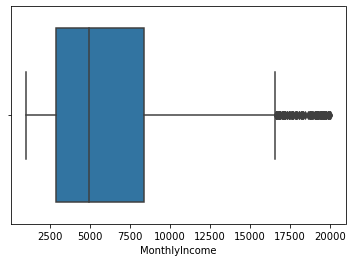



The BoxPlot Diagram for attribute-YearsAtCompany is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


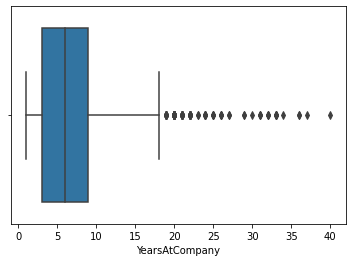



The BoxPlot Diagram for attribute-PerformanceRating is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


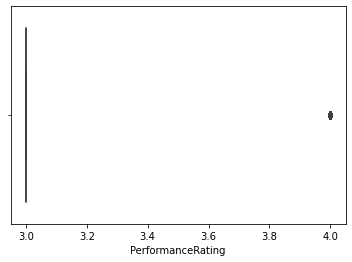



The BoxPlot Diagram for attribute-StockOptionLevel is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


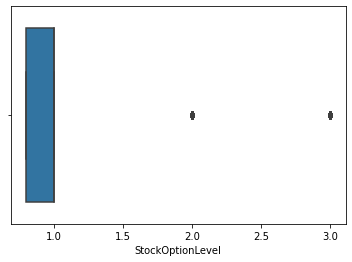



The BoxPlot Diagram for attribute-YearsSinceLastPromotion is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


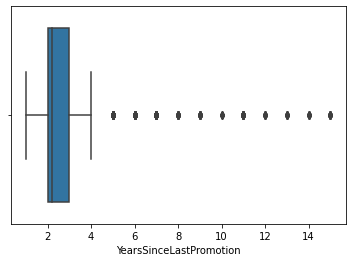



The BoxPlot Diagram for attribute-Attrition is given below..
AxesSubplot(0.125,0.125;0.775x0.755)


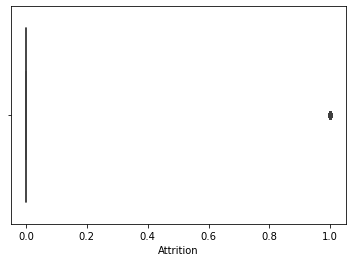

In [53]:
l=['BusinessTravel','WorkLifeBalance','EducationField','PercentSalaryHike','DistanceFromHome','OverTime','TrainingTimesLastYear','JobLevel','YearsWithCurrManager','NumCompaniesWorked','TotalWorkingYears','YearsInCurrentRole','MonthlyIncome','YearsAtCompany','PerformanceRating','StockOptionLevel','YearsSinceLastPromotion','Attrition']
for i in l:
    print(f'The BoxPlot Diagram for attribute-{i} is given below..')
    print(sns.boxplot(df[i]))
    plt.show()
    print('\n')

In [54]:
z=np.abs(zscore(df))
np.where(z>3)

(array([   6,   28,   45,   45,   62,   62,   63,   64,   64,   65,   83,
          85,   88,   92,   98,   98,  110,  120,  122,  123,  123,  123,
         126,  126,  126,  144,  153,  178,  178,  187,  187,  187,  190,
         190,  193,  205,  218,  222,  231,  231,  237,  237,  240,  270,
         270,  280,  281,  294,  304,  321,  326,  335,  338,  386,  386,
         401,  401,  411,  413,  417,  425,  425,  427,  428,  436,  440,
         445,  466,  473,  477,  523,  535,  535,  561,  561,  584,  586,
         592,  595,  595,  595,  595,  615,  616,  624,  635,  645,  653,
         653,  657,  677,  683,  686,  701,  716,  730,  746,  749,  752,
         752,  778,  779,  786,  795,  799,  803,  809,  813,  838,  838,
         850,  861,  861,  861,  865,  866,  868,  870,  874,  875,  875,
         893,  894,  902,  914,  914,  918,  922,  926,  926,  937,  944,
         956,  962,  965,  976,  976,  977,  978,  982,  991, 1008, 1024,
        1038, 1043, 1072, 1078, 1078, 

In [55]:
z.iloc[6][24]

3.2043198056240505

In [56]:
z.iloc[1457][24]

3.2043198056240505

In [57]:
z.iloc[1443][31]

3.0234339890489537

###### Data Cleansing
1. Remove Negative Correlation

In [58]:
df1=df.drop(['JobLevel','TotalWorkingYears','MonthlyIncome','Age','JobInvolvement','YearsAtCompany','JobSatisfaction','EnvironmentSatisfaction','YearsInCurrentRole','YearsWithCurrManager','StockOptionLevel','WorkLifeBalance','DailyRate','RelationshipSatisfaction','TrainingTimesLastYear','Education','YearsSinceLastPromotion','PercentSalaryHike','EmployeeNumber','HourlyRate'],axis=1)
df1

,Attrition,BusinessTravel,Department,DistanceFromHome,EducationField,Gender,JobRole,MaritalStatus,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating
0,1,2,2,1,1,0,7,2,19479,8.0,1,3
1,0,1,1,8,1,1,6,1,24907,1.0,0,4
2,1,2,1,2,4,1,2,2,2396,6.0,1,3
3,0,1,1,3,1,0,6,1,23159,1.0,1,3
4,0,2,1,2,3,1,2,1,16632,9.0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0,1,1,23,3,1,2,1,12290,4.0,0,3
1466,0,2,1,6,3,1,0,1,21457,4.0,0,3
1467,0,2,1,4,1,1,4,1,5174,1.0,1,4
1468,0,1,2,2,3,1,7,1,13243,2.0,0,3


###### Remove Multicollinearity

In [59]:
#imported the scipy library
import scipy.stats
import statsmodels.api
from statsmodels.stats.outliers_influence import variance_inflation_factor 

In [60]:
#feature
x=df1.drop('Attrition',axis=1)
x

,BusinessTravel,Department,DistanceFromHome,EducationField,Gender,JobRole,MaritalStatus,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating
0,2,2,1,1,0,7,2,19479,8.0,1,3
1,1,1,8,1,1,6,1,24907,1.0,0,4
2,2,1,2,4,1,2,2,2396,6.0,1,3
3,1,1,3,1,0,6,1,23159,1.0,1,3
4,2,1,2,3,1,2,1,16632,9.0,0,3
...,...,...,...,...,...,...,...,...,...,...,...
1465,1,1,23,3,1,2,1,12290,4.0,0,3
1466,2,1,6,3,1,0,1,21457,4.0,0,3
1467,2,1,4,1,1,4,1,5174,1.0,1,4
1468,1,2,2,3,1,7,1,13243,2.0,0,3


In [61]:
#calculating VIF Score
def vif():
    df2=pd.DataFrame()
    df2['Features']=x.columns
    df2['VIF']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    print(df2)

In [62]:
vif()

              Features        VIF
0       BusinessTravel   6.415256
1           Department  11.677157
2     DistanceFromHome   2.280203
3       EducationField   3.759664
4               Gender   2.450002
5              JobRole   7.671237
6        MaritalStatus   3.238848
7          MonthlyRate   4.864822
8   NumCompaniesWorked   2.765411
9             OverTime   1.399432
10   PerformanceRating  19.769098


In [63]:
df3=df1.drop(['DistanceFromHome','MaritalStatus'],axis=1)
df3

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating
0,1,2,2,1,0,7,19479,8.0,1,3
1,0,1,1,1,1,6,24907,1.0,0,4
2,1,2,1,4,1,2,2396,6.0,1,3
3,0,1,1,1,0,6,23159,1.0,1,3
4,0,2,1,3,1,2,16632,9.0,0,3
...,...,...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,12290,4.0,0,3
1466,0,2,1,3,1,0,21457,4.0,0,3
1467,0,2,1,1,1,4,5174,1.0,1,4
1468,0,1,2,3,1,7,13243,2.0,0,3


##### Removing Outliers

In [64]:
df4=df3[(z<3).all(axis=1)]
df4

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating
0,1,2,2,1,0,7,19479,8.0,1,3
1,0,1,1,1,1,6,24907,1.0,0,4
2,1,2,1,4,1,2,2396,6.0,1,3
3,0,1,1,1,0,6,23159,1.0,1,3
4,0,2,1,3,1,2,16632,9.0,0,3
...,...,...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,12290,4.0,0,3
1466,0,2,1,3,1,0,21457,4.0,0,3
1467,0,2,1,1,1,4,5174,1.0,1,4
1468,0,1,2,3,1,7,13243,2.0,0,3


In [65]:
print(df3.shape)
print(df4.shape)

(1470, 10)
(1302, 10)


In [66]:
Percentage_loss=(1470-1302)*100/1470
Percentage_loss

11.428571428571429

###### I'm getting the percentage loss is about 11.5% which is still decent because our dataset is large having 1470 rows and out of it we are loosing only 168 rows and that's not a problem for me going forward in testing phase.

##### 4.Removing Skewness
a): Using power_transform method

In [67]:
from sklearn.preprocessing import power_transform

In [68]:
x=df4.drop('Attrition',axis=1)
x

,BusinessTravel,Department,EducationField,Gender,JobRole,MonthlyRate,NumCompaniesWorked,OverTime,PerformanceRating
0,2,2,1,0,7,19479,8.0,1,3
1,1,1,1,1,6,24907,1.0,0,4
2,2,1,4,1,2,2396,6.0,1,3
3,1,1,1,0,6,23159,1.0,1,3
4,2,1,3,1,2,16632,9.0,0,3
...,...,...,...,...,...,...,...,...,...
1465,1,1,3,1,2,12290,4.0,0,3
1466,2,1,3,1,0,21457,4.0,0,3
1467,2,1,1,1,4,5174,1.0,1,4
1468,1,2,3,1,7,13243,2.0,0,3


In [69]:
x=power_transform(x)
x

array([[ 6.38737864e-01,  1.37046854e+00, -9.65151119e-01, ...,
         1.62940017e+00,  1.59918012e+00, -1.94289029e-16],
       [-1.38703106e+00, -4.80655748e-01, -9.65151119e-01, ...,
        -1.17304034e+00, -6.25320431e-01,  1.05471187e-15],
       [ 6.38737864e-01, -4.80655748e-01,  1.23180500e+00, ...,
         1.29816126e+00,  1.59918012e+00, -1.94289029e-16],
       ...,
       [ 6.38737864e-01, -4.80655748e-01, -9.65151119e-01, ...,
        -1.17304034e+00,  1.59918012e+00,  1.05471187e-15],
       [-1.38703106e+00,  1.37046854e+00,  6.90092101e-01, ...,
        -1.93776104e-01, -6.25320431e-01, -1.94289029e-16],
       [ 6.38737864e-01, -4.80655748e-01,  6.90092101e-01, ...,
        -1.93776104e-01, -6.25320431e-01, -1.94289029e-16]])

In [70]:
df4.skew().sort_values()

BusinessTravel       -1.432041
Gender               -0.414610
JobRole              -0.398893
MonthlyRate           0.026648
Department            0.175187
EducationField        0.555471
OverTime              0.974983
NumCompaniesWorked    1.151726
Attrition             1.813389
PerformanceRating     1.915365
dtype: float64

###### Boxcox Method

In [71]:
l=['NumCompaniesWorked','PerformanceRating']
for i in l:
    df4[i]=scipy.stats.boxcox(df4[i])[0]

In [72]:
df4.skew().sort_values()

BusinessTravel       -1.432041
Gender               -0.414610
JobRole              -0.398893
PerformanceRating     0.000000
MonthlyRate           0.026648
NumCompaniesWorked    0.056608
Department            0.175187
EducationField        0.555471
OverTime              0.974983
Attrition             1.813389
dtype: float64

###### Using Standard Scaler

In [73]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [74]:
x=sc.fit_transform(x)
x

array([[ 0.63873786,  1.37046854, -0.96515112, ...,  1.62940017,
         1.59918012, -0.42727194],
       [-1.38703106, -0.48065575, -0.96515112, ..., -1.17304034,
        -0.62532043,  2.34042986],
       [ 0.63873786, -0.48065575,  1.231805  , ...,  1.29816126,
         1.59918012, -0.42727194],
       ...,
       [ 0.63873786, -0.48065575, -0.96515112, ..., -1.17304034,
         1.59918012,  2.34042986],
       [-1.38703106,  1.37046854,  0.6900921 , ..., -0.1937761 ,
        -0.62532043, -0.42727194],
       [ 0.63873786, -0.48065575,  0.6900921 , ..., -0.1937761 ,
        -0.62532043, -0.42727194]])

In [75]:
x.shape

(1302, 9)

In [76]:
x.mean()

-3.031843043864568e-18

In [77]:
x.std()

1.0

<AxesSubplot:ylabel='Density'>

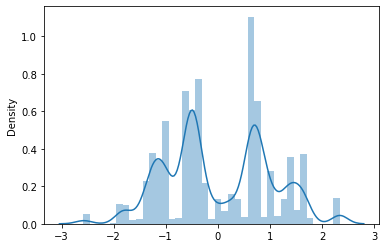

In [78]:
sns.distplot(x)

#### IMBLearn technique

In [79]:
y=df4['Attrition']
y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1302, dtype: int32

In [80]:
df.Attrition.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

In [81]:
#checking the version of sklearn and other libraries and it must be updated one to run the same
import numpy
import pandas
print('sklearn_version',sklearn.__version__)
print('numpy_version',numpy.__version__)
print('pandas_version',pandas.__version__)

sklearn_version 1.0.2
numpy_version 1.21.5
pandas_version 1.4.2


In [82]:
#installing the imblearn library first as it's not installed directly in sklearn
!pip install -U imbalanced-learn

Defaulting to user installation because normal site-packages is not writeable


In [83]:
#now importing the SMOTE
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)
y.value_counts()

1    1088
0    1088
Name: Attrition, dtype: int64

###### Classes are now balanced

In [84]:
#Target
y

0       1
1       0
2       1
3       0
4       0
       ..
2171    1
2172    1
2173    1
2174    1
2175    1
Name: Attrition, Length: 2176, dtype: int32

In [85]:
#feature
x

array([[ 0.63873786,  1.37046854, -0.96515112, ...,  1.62940017,
         1.59918012, -0.42727194],
       [-1.38703106, -0.48065575, -0.96515112, ..., -1.17304034,
        -0.62532043,  2.34042986],
       [ 0.63873786, -0.48065575,  1.231805  , ...,  1.29816126,
         1.59918012, -0.42727194],
       ...,
       [-1.38703106,  1.37046854,  0.39997843, ..., -1.17304034,
        -0.62532043, -0.42727194],
       [ 0.63873786, -0.48065575, -0.96515112, ..., -1.17304034,
         1.59918012,  2.34042986],
       [-1.81350757, -0.48065575, -0.96515112, ..., -0.25844487,
         1.45227829,  2.34042986]])

In [86]:
print(x.shape)
print(y.shape)

(2176, 9)
(2176,)


In [87]:
#importing machine learning libraries for classification model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
lr=LogisticRegression()

In [88]:
#will finding best value of random_state
for h in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=h)
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    if accuracy_score(pred_train,y_train) == accuracy_score(pred_test,y_test):
        print('At random_state',h,'the model perform very well')
        print('At random_state',h)
        print('Training Accuracy Score is- ',accuracy_score(pred_train,y_train))
        print('Testing Accuracy Score is- ',accuracy_score(pred_test,y_test))
        print('\n Classification Report-\n',classification_report(y_test,pred_test))
        print('\n Confusion Metrix-\n',confusion_matrix(y_test,pred_test))
    else:
        print('At random_state',h)
        print('Training Accuracy Score is- ',accuracy_score(pred_train,y_train))
        print('Testing Accuracy Score is- ',accuracy_score(pred_test,y_test))
        print('\n Classification Report-\n',classification_report(y_test,pred_test))
        print('\n Confusion Metrix-\n',confusion_matrix(y_test,pred_test))
        print('\n')

At random_state 0
Training Accuracy Score is-  0.65
Testing Accuracy Score is-  0.6720183486238532

 Classification Report-
               precision    recall  f1-score   support

           0       0.67      0.70      0.69       222
           1       0.67      0.64      0.66       214

    accuracy                           0.67       436
   macro avg       0.67      0.67      0.67       436
weighted avg       0.67      0.67      0.67       436


 Confusion Metrix-
 [[156  66]
 [ 77 137]]


At random_state 1
Training Accuracy Score is-  0.6557471264367816
Testing Accuracy Score is-  0.6674311926605505

 Classification Report-
               precision    recall  f1-score   support

           0       0.64      0.72      0.68       211
           1       0.70      0.62      0.66       225

    accuracy                           0.67       436
   macro avg       0.67      0.67      0.67       436
weighted avg       0.67      0.67      0.67       436


 Confusion Metrix-
 [[152  59]
 [ 8

In [89]:
#Traing the Logistic Regression Model at Random_State 98 as it's giving almost same training and testing accuracy
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=98)
lr.fit(x_train,y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
print('Training Accuracy Score for Logistic model is',accuracy_score(y_train,pred_train))
print('Testing Accuracy Score for Logistic model is',accuracy_score(y_test,pred_test))
print('\n Classification Report-\n',classification_report(y_test,pred_test))
print('\n Confusion Metrix-\n',confusion_matrix(y_test,pred_test))

Training Accuracy Score for Logistic model is 0.6626436781609195
Testing Accuracy Score for Logistic model is 0.6444954128440367

 Classification Report-
               precision    recall  f1-score   support

           0       0.63      0.70      0.67       220
           1       0.66      0.58      0.62       216

    accuracy                           0.64       436
   macro avg       0.65      0.64      0.64       436
weighted avg       0.65      0.64      0.64       436


 Confusion Metrix-
 [[155  65]
 [ 90 126]]


#### CV Score

In [90]:
from sklearn.model_selection import cross_val_score

In [91]:
for l in range(2,15):
    cvscore=cross_val_score(lr,x,y,cv=l)
    cv_accuracy_score=cvscore.mean()
    print(f'At the K-Fold {l} the Cross Value Score is {cv_accuracy_score}')
    print(f'The Testing accuracy Score of Logistic Regression Model is {accuracy_score(y_test,pred_test)}')
    print('\n')

At the K-Fold 2 the Cross Value Score is 0.6567095588235294
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 3 the Cross Value Score is 0.6585465944713594
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 4 the Cross Value Score is 0.6548713235294117
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 5 the Cross Value Score is 0.6599251291785301
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 6 the Cross Value Score is 0.6557907046355061
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 7 the Cross Value Score is 0.6567101812200867
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 8 the Cross Value Score is 0.6534926470588236
The Testing accuracy Score of Logistic Regression Model is 0.6444954128440367


At the K-Fold 9 the 

In [92]:
#importing other libraries
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.linear_model import SGDClassifier
gb=GaussianNB()
neighbor=KNeighborsClassifier()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
ad=AdaBoostClassifier()
grd=GradientBoostingClassifier()
svc=SVC()
sgd=SGDClassifier()

In [93]:
#creating a definition to expand the model individually
def model(algorithm,x,y):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=98)
    algorithm.fit(x_train,y_train)
    pred_train_x=algorithm.predict(x_train)
    pred_test_y=algorithm.predict(x_test)
    print('For',algorithm)
    print('Training_Accuracy_Score=',accuracy_score(y_train,pred_train_x))
    print('Testing_Accuracy_Score=',accuracy_score(y_test,pred_test_y))
    print('\n Classification Report-\n',classification_report(y_test,pred_test_y))
    print('\n Confusion Metrix-\n',confusion_matrix(y_test,pred_test_y))
    print('\n\nAUC_ROC CURVE')
    prob=algorithm.predict_proba(x_test)[:,1]
    FPR,TPR,THRESHOLD=roc_curve(y_test,prob)
    plt.plot(FPR,TPR)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC_Curve')
    plt.show()
    ROC_AUC_SCORE=roc_auc_score(y_test,pred_test_y)
    print('ROC AUC SCORE is-',ROC_AUC_SCORE)
    print('\n')
    print('Finding out the best K-Fold Value')
    print('\n\t')
    for l in range(2,15):
        cvscore=cross_val_score(algorithm,x,y,cv=l)
        cv_accuracy_score=cvscore.mean()
        print(f'At the K-Fold {l} the CV score of model {algorithm} is {cv_accuracy_score}')
        print('\n')

For LogisticRegression()
Training_Accuracy_Score= 0.6626436781609195
Testing_Accuracy_Score= 0.6444954128440367

 Classification Report-
               precision    recall  f1-score   support

           0       0.63      0.70      0.67       220
           1       0.66      0.58      0.62       216

    accuracy                           0.64       436
   macro avg       0.65      0.64      0.64       436
weighted avg       0.65      0.64      0.64       436


 Confusion Metrix-
 [[155  65]
 [ 90 126]]


AUC_ROC CURVE


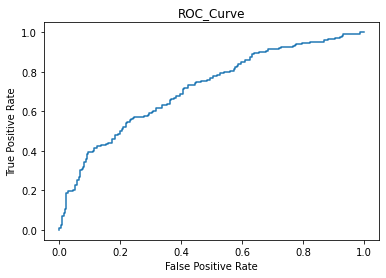

ROC AUC SCORE is- 0.643939393939394


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model LogisticRegression() is 0.6567095588235294


At the K-Fold 3 the CV score of model LogisticRegression() is 0.6585465944713594


At the K-Fold 4 the CV score of model LogisticRegression() is 0.6548713235294117


At the K-Fold 5 the CV score of model LogisticRegression() is 0.6599251291785301


At the K-Fold 6 the CV score of model LogisticRegression() is 0.6557907046355061


At the K-Fold 7 the CV score of model LogisticRegression() is 0.6567101812200867


At the K-Fold 8 the CV score of model LogisticRegression() is 0.6534926470588236


At the K-Fold 9 the CV score of model LogisticRegression() is 0.6571810142160953


At the K-Fold 10 the CV score of model LogisticRegression() is 0.6553312476218661


At the K-Fold 11 the CV score of model LogisticRegression() is 0.6585630182769084


At the K-Fold 12 the CV score of model LogisticRegression() is 0.6567047133345475


At the K-

In [94]:
#1st model
model(lr,x,y)

For GaussianNB()
Training_Accuracy_Score= 0.6597701149425287
Testing_Accuracy_Score= 0.658256880733945

 Classification Report-
               precision    recall  f1-score   support

           0       0.66      0.66      0.66       220
           1       0.65      0.66      0.66       216

    accuracy                           0.66       436
   macro avg       0.66      0.66      0.66       436
weighted avg       0.66      0.66      0.66       436


 Confusion Metrix-
 [[145  75]
 [ 74 142]]


AUC_ROC CURVE


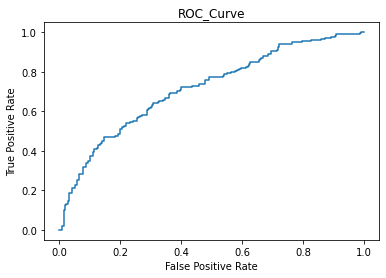

ROC AUC SCORE is- 0.6582491582491583


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GaussianNB() is 0.6544117647058824


At the K-Fold 3 the CV score of model GaussianNB() is 0.6576264209493049


At the K-Fold 4 the CV score of model GaussianNB() is 0.6580882352941176


At the K-Fold 5 the CV score of model GaussianNB() is 0.6553284825477169


At the K-Fold 6 the CV score of model GaussianNB() is 0.6539579623457072


At the K-Fold 7 the CV score of model GaussianNB() is 0.6539511313289966


At the K-Fold 8 the CV score of model GaussianNB() is 0.6553308823529411


At the K-Fold 9 the CV score of model GaussianNB() is 0.6548910454983635


At the K-Fold 10 the CV score of model GaussianNB() is 0.6553354754153806


At the K-Fold 11 the CV score of model GaussianNB() is 0.6539693194054061


At the K-Fold 12 the CV score of model GaussianNB() is 0.6548808005990326


At the K-Fold 13 the CV score of model GaussianNB() is 0.6544274089184269


At the K-Fold 14 the

In [95]:
#2nd model
model(gb,x,y)

For KNeighborsClassifier()
Training_Accuracy_Score= 0.8701149425287357
Testing_Accuracy_Score= 0.7958715596330275

 Classification Report-
               precision    recall  f1-score   support

           0       0.88      0.69      0.77       220
           1       0.74      0.91      0.81       216

    accuracy                           0.80       436
   macro avg       0.81      0.80      0.79       436
weighted avg       0.81      0.80      0.79       436


 Confusion Metrix-
 [[151  69]
 [ 20 196]]


AUC_ROC CURVE


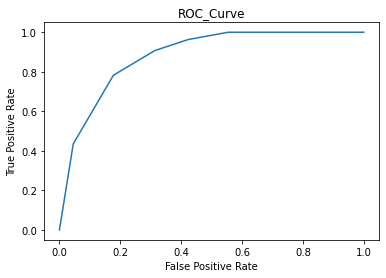

ROC AUC SCORE is- 0.7968855218855218


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model KNeighborsClassifier() is 0.78125


At the K-Fold 3 the CV score of model KNeighborsClassifier() is 0.7968702700991103


At the K-Fold 4 the CV score of model KNeighborsClassifier() is 0.8115808823529412


At the K-Fold 5 the CV score of model KNeighborsClassifier() is 0.8010049562374777


At the K-Fold 6 the CV score of model KNeighborsClassifier() is 0.8161727774987444


At the K-Fold 7 the CV score of model KNeighborsClassifier() is 0.8092862329041148


At the K-Fold 8 the CV score of model KNeighborsClassifier() is 0.8129595588235294


At the K-Fold 9 the CV score of model KNeighborsClassifier() is 0.8083646727554686


At the K-Fold 10 the CV score of model KNeighborsClassifier() is 0.8120323003424513


At the K-Fold 11 the CV score of model KNeighborsClassifier() is 0.8143315946730806


At the K-Fold 12 the CV score of model KNeighborsClassifier() is 0.8092758990549044

In [96]:
#3rd model
model(neighbor,x,y)

For DecisionTreeClassifier()
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.8279816513761468

 Classification Report-
               precision    recall  f1-score   support

           0       0.82      0.84      0.83       220
           1       0.83      0.81      0.82       216

    accuracy                           0.83       436
   macro avg       0.83      0.83      0.83       436
weighted avg       0.83      0.83      0.83       436


 Confusion Metrix-
 [[185  35]
 [ 40 176]]


AUC_ROC CURVE


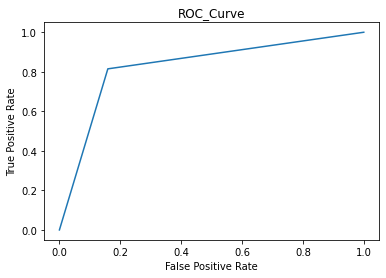

ROC AUC SCORE is- 0.8278619528619529


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model DecisionTreeClassifier() is 0.7849264705882353


At the K-Fold 3 the CV score of model DecisionTreeClassifier() is 0.7982780785915583


At the K-Fold 4 the CV score of model DecisionTreeClassifier() is 0.8235294117647058


At the K-Fold 5 the CV score of model DecisionTreeClassifier() is 0.8336834335126015


At the K-Fold 6 the CV score of model DecisionTreeClassifier() is 0.82217326453891


At the K-Fold 7 the CV score of model DecisionTreeClassifier() is 0.8281313438143643


At the K-Fold 8 the CV score of model DecisionTreeClassifier() is 0.8184742647058824


At the K-Fold 9 the CV score of model DecisionTreeClassifier() is 0.8226436374305102


At the K-Fold 10 the CV score of model DecisionTreeClassifier() is 0.8309453346298568


At the K-Fold 11 the CV score of model DecisionTreeClassifier() is 0.8263064423655102


At the K-Fold 12 the CV score of model DecisionTreeCla

In [97]:
#4rd model
model(dtc,x,y)

For RandomForestClassifier()
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.9013761467889908

 Classification Report-
               precision    recall  f1-score   support

           0       0.88      0.94      0.91       220
           1       0.93      0.87      0.90       216

    accuracy                           0.90       436
   macro avg       0.90      0.90      0.90       436
weighted avg       0.90      0.90      0.90       436


 Confusion Metrix-
 [[206  14]
 [ 29 187]]


AUC_ROC CURVE


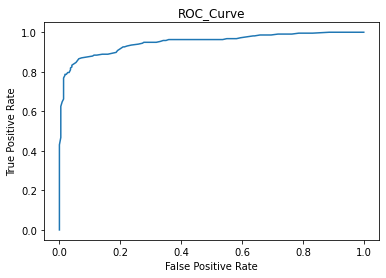

ROC AUC SCORE is- 0.9010521885521885


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model RandomForestClassifier() is 0.8442095588235294


At the K-Fold 3 the CV score of model RandomForestClassifier() is 0.8731921091795701


At the K-Fold 4 the CV score of model RandomForestClassifier() is 0.8754595588235294


At the K-Fold 5 the CV score of model RandomForestClassifier() is 0.8851724137931034


At the K-Fold 6 the CV score of model RandomForestClassifier() is 0.8865221780842072


At the K-Fold 7 the CV score of model RandomForestClassifier() is 0.8892631173411175


At the K-Fold 8 the CV score of model RandomForestClassifier() is 0.8874080882352942


At the K-Fold 9 the CV score of model RandomForestClassifier() is 0.8879191766781356


At the K-Fold 10 the CV score of model RandomForestClassifier() is 0.8870291294973154


At the K-Fold 11 the CV score of model RandomForestClassifier() is 0.8860734712142186


At the K-Fold 12 the CV score of model RandomForestC

In [98]:
#5rd model
model(rfc,x,y)

For AdaBoostClassifier()
Training_Accuracy_Score= 0.8143678160919541
Testing_Accuracy_Score= 0.7935779816513762

 Classification Report-
               precision    recall  f1-score   support

           0       0.78      0.82      0.80       220
           1       0.81      0.77      0.79       216

    accuracy                           0.79       436
   macro avg       0.79      0.79      0.79       436
weighted avg       0.79      0.79      0.79       436


 Confusion Metrix-
 [[180  40]
 [ 50 166]]


AUC_ROC CURVE


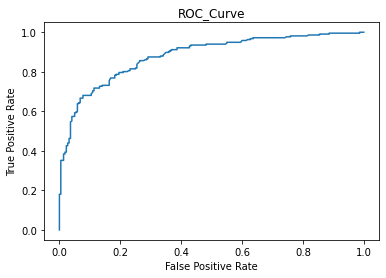

ROC AUC SCORE is- 0.7933501683501684


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model AdaBoostClassifier() is 0.7807904411764706


At the K-Fold 3 the CV score of model AdaBoostClassifier() is 0.7909312561350178


At the K-Fold 4 the CV score of model AdaBoostClassifier() is 0.7849264705882354


At the K-Fold 5 the CV score of model AdaBoostClassifier() is 0.7900590530422862


At the K-Fold 6 the CV score of model AdaBoostClassifier() is 0.7982981497547043


At the K-Fold 7 the CV score of model AdaBoostClassifier() is 0.7890734511831907


At the K-Fold 8 the CV score of model AdaBoostClassifier() is 0.7996323529411765


At the K-Fold 9 the CV score of model AdaBoostClassifier() is 0.7955431340946241


At the K-Fold 10 the CV score of model AdaBoostClassifier() is 0.7983321354585041


At the K-Fold 11 the CV score of model AdaBoostClassifier() is 0.8010515864692145


At the K-Fold 12 the CV score of model AdaBoostClassifier() is 0.7946871268694474


At the K

In [99]:
#6rd model
model(ad,x,y)

For GradientBoostingClassifier()
Training_Accuracy_Score= 0.8931034482758621
Testing_Accuracy_Score= 0.8738532110091743

 Classification Report-
               precision    recall  f1-score   support

           0       0.85      0.91      0.88       220
           1       0.90      0.83      0.87       216

    accuracy                           0.87       436
   macro avg       0.88      0.87      0.87       436
weighted avg       0.88      0.87      0.87       436


 Confusion Metrix-
 [[201  19]
 [ 36 180]]


AUC_ROC CURVE


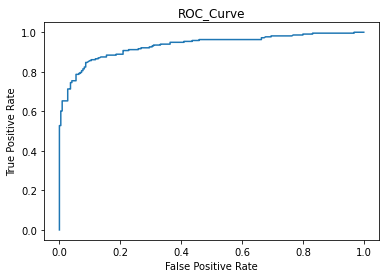

ROC AUC SCORE is- 0.8734848484848485


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GradientBoostingClassifier() is 0.8340992647058824


At the K-Fold 3 the CV score of model GradientBoostingClassifier() is 0.8369019347075773


At the K-Fold 4 the CV score of model GradientBoostingClassifier() is 0.8451286764705882


At the K-Fold 5 the CV score of model GradientBoostingClassifier() is 0.8420194031424655


At the K-Fold 6 the CV score of model GradientBoostingClassifier() is 0.8502478324175963


At the K-Fold 7 the CV score of model GradientBoostingClassifier() is 0.848834590365552


At the K-Fold 8 the CV score of model GradientBoostingClassifier() is 0.8520220588235294


At the K-Fold 9 the CV score of model GradientBoostingClassifier() is 0.854383137295246


At the K-Fold 10 the CV score of model GradientBoostingClassifier() is 0.852604320804972


At the K-Fold 11 the CV score of model GradientBoostingClassifier() is 0.8594365435620627


At the K-Fold 1

In [100]:
#7th model
model(grd,x,y)

Hyperparameter

In [101]:
from sklearn.model_selection import GridSearchCV

In [102]:
#defining all the parameters of the respective models
dict_neigh={'weights':['uniform', 'distance'],'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute']}
dict_dtc={'criterion':["gini", "entropy", "log_loss"],'splitter':["best", "random"],'max_features':["auto", "sqrt", "log2"]}
dict_rfc={'criterion' : ["gini", "entropy", "log_loss"],'max_features':["sqrt", "log2", None],'class_weight':["balanced", "balanced_subsample"]}
dict_ad={'algorithm':['SAMME', 'SAMME.R']}
dict_grd={'loss':['log_loss', 'deviance', 'exponential'],'criterion':['friedman_mse', 'squared_error', 'mse'],'max_features':['auto', 'sqrt', 'log2']}

In [103]:
#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')

In [104]:
HPT(neighbor,dict_neigh)

The best Parameters of the model KNeighborsClassifier() is {'algorithm': 'auto', 'weights': 'distance'}


In [105]:
HPT(rfc,dict_rfc)

The best Parameters of the model RandomForestClassifier() is {'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt'}


In [106]:
HPT(ad,dict_ad)

The best Parameters of the model AdaBoostClassifier() is {'algorithm': 'SAMME.R'}


In [107]:
HPT(grd,dict_grd)

The best Parameters of the model GradientBoostingClassifier() is {'criterion': 'friedman_mse', 'loss': 'deviance', 'max_features': 'auto'}


In [108]:
#Redefining the models after getting the parameters
lr=LogisticRegression()
gb=GaussianNB()
neighbor=KNeighborsClassifier(algorithm='auto',weights='distance')
dtc=DecisionTreeClassifier(criterion='log_loss',max_features='log2',splitter='random')
rfc=RandomForestClassifier(class_weight= 'balanced_subsample',criterion='entropy',max_features='log2')
ad=AdaBoostClassifier(algorithm= 'SAMME.R')
grd=GradientBoostingClassifier(criterion='friedman_mse',loss= 'log_loss',max_features= 'auto')

For LogisticRegression()
Training_Accuracy_Score= 0.6626436781609195
Testing_Accuracy_Score= 0.6444954128440367

 Classification Report-
               precision    recall  f1-score   support

           0       0.63      0.70      0.67       220
           1       0.66      0.58      0.62       216

    accuracy                           0.64       436
   macro avg       0.65      0.64      0.64       436
weighted avg       0.65      0.64      0.64       436


 Confusion Metrix-
 [[155  65]
 [ 90 126]]


AUC_ROC CURVE


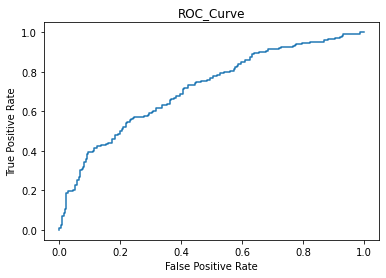

ROC AUC SCORE is- 0.643939393939394


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model LogisticRegression() is 0.6567095588235294


At the K-Fold 3 the CV score of model LogisticRegression() is 0.6585465944713594


At the K-Fold 4 the CV score of model LogisticRegression() is 0.6548713235294117


At the K-Fold 5 the CV score of model LogisticRegression() is 0.6599251291785301


At the K-Fold 6 the CV score of model LogisticRegression() is 0.6557907046355061


At the K-Fold 7 the CV score of model LogisticRegression() is 0.6567101812200867


At the K-Fold 8 the CV score of model LogisticRegression() is 0.6534926470588236


At the K-Fold 9 the CV score of model LogisticRegression() is 0.6571810142160953


At the K-Fold 10 the CV score of model LogisticRegression() is 0.6553312476218661


At the K-Fold 11 the CV score of model LogisticRegression() is 0.6585630182769084


At the K-Fold 12 the CV score of model LogisticRegression() is 0.6567047133345475


At the K-

In [109]:
model(lr,x,y)

For GaussianNB()
Training_Accuracy_Score= 0.6597701149425287
Testing_Accuracy_Score= 0.658256880733945

 Classification Report-
               precision    recall  f1-score   support

           0       0.66      0.66      0.66       220
           1       0.65      0.66      0.66       216

    accuracy                           0.66       436
   macro avg       0.66      0.66      0.66       436
weighted avg       0.66      0.66      0.66       436


 Confusion Metrix-
 [[145  75]
 [ 74 142]]


AUC_ROC CURVE


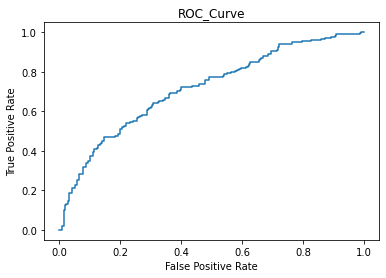

ROC AUC SCORE is- 0.6582491582491583


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GaussianNB() is 0.6544117647058824


At the K-Fold 3 the CV score of model GaussianNB() is 0.6576264209493049


At the K-Fold 4 the CV score of model GaussianNB() is 0.6580882352941176


At the K-Fold 5 the CV score of model GaussianNB() is 0.6553284825477169


At the K-Fold 6 the CV score of model GaussianNB() is 0.6539579623457072


At the K-Fold 7 the CV score of model GaussianNB() is 0.6539511313289966


At the K-Fold 8 the CV score of model GaussianNB() is 0.6553308823529411


At the K-Fold 9 the CV score of model GaussianNB() is 0.6548910454983635


At the K-Fold 10 the CV score of model GaussianNB() is 0.6553354754153806


At the K-Fold 11 the CV score of model GaussianNB() is 0.6539693194054061


At the K-Fold 12 the CV score of model GaussianNB() is 0.6548808005990326


At the K-Fold 13 the CV score of model GaussianNB() is 0.6544274089184269


At the K-Fold 14 the

In [110]:
model(gb,x,y)

For KNeighborsClassifier(weights='distance')
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.8142201834862385

 Classification Report-
               precision    recall  f1-score   support

           0       0.91      0.70      0.79       220
           1       0.75      0.93      0.83       216

    accuracy                           0.81       436
   macro avg       0.83      0.82      0.81       436
weighted avg       0.83      0.81      0.81       436


 Confusion Metrix-
 [[154  66]
 [ 15 201]]


AUC_ROC CURVE


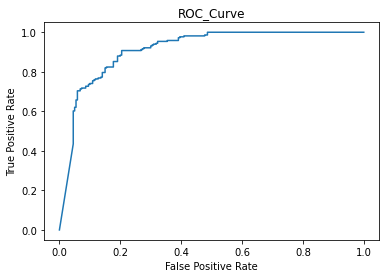

ROC AUC SCORE is- 0.8152777777777778


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model KNeighborsClassifier(weights='distance') is 0.802389705882353


At the K-Fold 3 the CV score of model KNeighborsClassifier(weights='distance') is 0.8170925556505494


At the K-Fold 4 the CV score of model KNeighborsClassifier(weights='distance') is 0.8308823529411764


At the K-Fold 5 the CV score of model KNeighborsClassifier(weights='distance') is 0.8262828218918065


At the K-Fold 6 the CV score of model KNeighborsClassifier(weights='distance') is 0.8318011861457366


At the K-Fold 7 the CV score of model KNeighborsClassifier(weights='distance') is 0.8258271963489265


At the K-Fold 8 the CV score of model KNeighborsClassifier(weights='distance') is 0.8322610294117647


At the K-Fold 9 the CV score of model KNeighborsClassifier(weights='distance') is 0.8285876494099805


At the K-Fold 10 the CV score of model KNeighborsClassifier(weights='distance') is 0.8317993489197988

In [111]:
model(neighbor,x,y)

For RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2')
Training_Accuracy_Score= 1.0
Testing_Accuracy_Score= 0.9036697247706422

 Classification Report-
               precision    recall  f1-score   support

           0       0.88      0.94      0.91       220
           1       0.94      0.87      0.90       216

    accuracy                           0.90       436
   macro avg       0.91      0.90      0.90       436
weighted avg       0.91      0.90      0.90       436


 Confusion Metrix-
 [[207  13]
 [ 29 187]]


AUC_ROC CURVE


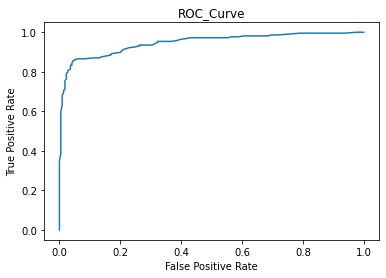

ROC AUC SCORE is- 0.9033249158249158


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2') is 0.8579963235294117


At the K-Fold 3 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2') is 0.8759469301162092


At the K-Fold 4 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2') is 0.8754595588235293


At the K-Fold 5 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2') is 0.8801254877148581


At the K-Fold 6 the CV score of model RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2') is 0.8851473042834167



In [112]:
model(rfc,x,y)

For AdaBoostClassifier()
Training_Accuracy_Score= 0.8143678160919541
Testing_Accuracy_Score= 0.7935779816513762

 Classification Report-
               precision    recall  f1-score   support

           0       0.78      0.82      0.80       220
           1       0.81      0.77      0.79       216

    accuracy                           0.79       436
   macro avg       0.79      0.79      0.79       436
weighted avg       0.79      0.79      0.79       436


 Confusion Metrix-
 [[180  40]
 [ 50 166]]


AUC_ROC CURVE


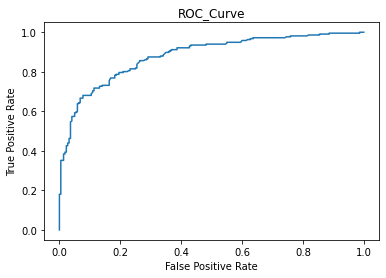

ROC AUC SCORE is- 0.7933501683501684


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model AdaBoostClassifier() is 0.7807904411764706


At the K-Fold 3 the CV score of model AdaBoostClassifier() is 0.7909312561350178


At the K-Fold 4 the CV score of model AdaBoostClassifier() is 0.7849264705882354


At the K-Fold 5 the CV score of model AdaBoostClassifier() is 0.7900590530422862


At the K-Fold 6 the CV score of model AdaBoostClassifier() is 0.7982981497547043


At the K-Fold 7 the CV score of model AdaBoostClassifier() is 0.7890734511831907


At the K-Fold 8 the CV score of model AdaBoostClassifier() is 0.7996323529411765


At the K-Fold 9 the CV score of model AdaBoostClassifier() is 0.7955431340946241


At the K-Fold 10 the CV score of model AdaBoostClassifier() is 0.7983321354585041


At the K-Fold 11 the CV score of model AdaBoostClassifier() is 0.8010515864692145


At the K-Fold 12 the CV score of model AdaBoostClassifier() is 0.7946871268694474


At the K

In [114]:

model(ad,x,y)

In [123]:
svc=SVC(decision_function_shape='ovo',gamma='scale')
sgd=SGDClassifier(learning_rate='optimal',loss='huber',penalty='elasticnet')

###### Save the Model

In [125]:
import joblib

In [126]:
file='HR.obj'
joblib.dump(rfc,file)


['HR.obj']

In [127]:
a=joblib.load('HR.obj')
a

RandomForestClassifier(class_weight='balanced_subsample', criterion='entropy',
                       max_features='log2')

##### Loading the Modle

In [128]:
#predicting the model
pred=a.predict(x_test)
pred

array([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,

In [129]:
y_test

663     0
1455    1
595     0
2110    1
864     0
       ..
1303    1
613     0
406     0
1055    0
1742    1
Name: Attrition, Length: 436, dtype: int32

In [130]:
pred.size

436

In [132]:
#Testing Accuracy score of the model 
Accuracy_Score=accuracy_score(y_test,pred)
Accuracy_Score

0.9036697247706422

In [133]:
#checking errors
confusion_matrix(y_test,pred)

array([[207,  13],
       [ 29, 187]], dtype=int64)

In [134]:
#checking F1 score
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.88      0.94      0.91       220
           1       0.94      0.87      0.90       216

    accuracy                           0.90       436
   macro avg       0.91      0.90      0.90       436
weighted avg       0.91      0.90      0.90       436



In [135]:
conclusion=pd.DataFrame(pred,y_test)
conclusion

,0
Attrition,
0,0
1,1
0,0
1,1
0,0
...,...
1,1
0,0
0,0


In [136]:
conclusion=pd.DataFrame(data=[y_test,pred],index=['Original Attrition','Predicted Attrition'])
conclusion

,663,1455,595,2110,864,378,1922,328,1978,1754,...,895,1119,587,1232,801,1303,613,406,1055,1742
Original Attrition,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
Predicted Attrition,NaN,NaN,NaN,NaN,NaN,0.0,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN


##### Now,what I would like to conclude is that Random Forest Classifier is one of the best model among all because it's giving the training accuracy as 100% and testing accuracy as 88% and later on while predicting the saved model it reaches to more than 98%. Also the F1 score,CV score,AUC_ROC score is equal too and one more thing is that the error is really low for the model as we can see in the confusion matrix of the respective model.Hence we can say that my approach was quite good throughout the whole process so that model have acheived 98% of accuracy score while predicting the attrition.